#Gerando amostras do conjunto de dados SPR usando Deep Convolutional GANs - (DCGAM)

#**1 - FUNÇÕES E IMPORTAÇÕES DO TREINAMENTO DA DCGAM**#

 ## 1.1 - Importações do framework pyTorch

In [4]:
import torch
import os
import torchvision
import torchvision.transforms as transforms
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
import torch.optim as optim
from torch.utils.data import random_split, DataLoader

from torchvision import datasets, transforms
from torch.utils.data import DataLoader
#Montar o Google Drive
from google.colab import drive
drive.mount('/content/drive')

# definir dispositivo
device = torch.device("cpu")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


##1.2 - Criando o trainloader e testloader com as imagens SPR Simuladas


In [ ]:
caminho_trainloader = "/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/IMAGENS_SIMULADAS_RPS_C1/trainloader"#imagem: RGB
caminho_testloader = "/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/IMAGENS_SIMULADAS_RPS_C1/testloader"#imagem: RGB
caminho_img_gerada_DCGAN = "/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/IMAGENS_GERADA_DCGAN"
caminho_img_gerada_DCGAN_1331 = "/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/IMG_GERADA_+_INTERPOLDASA_133_1335"
caminho_img_gerada_DCGAN_1336 = "/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/IMAGENS_GERADA_DCGAN_1336"
caminho_img_gerada_DCGAN_1341 = "/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/IMAGENS_GERADA_DCGAN_1341"
caminho_img_REAIS_SPR = "/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/IMAGENS_ORIGINAIS_SPR"
caminho_transição_img = "/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/TRANSICAO_DE_IMAGENS_1"
caminho_todas_img_simuladas = "/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/TODAS_IMAGENS SIMULADAS"
caminho_transição_img_133_1335 = "/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/TRANSICAO_DE_IMAGENS_2"
caminho_DATASET_600IMG_SPR = "/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/DATASET_600IMG_SPR"
caminho_11_IMG_GERADA_133_A_1335 = "/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/11_IMG_GERADA_133_A_1335"


# Transformação das imagens
transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),  # Converter para escala de cinza
    transforms.Resize((224, 224)),                # Redimensionar para 224x224
    transforms.ToTensor(),                        # Converter para tensor
    transforms.Normalize((0.5,), (0.5,))          # Normalizar para [-1, 1]
])

# Criando uma classe personalizada para o Dataset que também retorna o nome da imagem
class CustomImageFolder(datasets.ImageFolder):
    def __getitem__(self, index):
        image, label = super().__getitem__(index)  # Obtém a imagem transformada e o rótulo
        image_path = self.imgs[index][0]  # Caminho completo da imagem
        image_name = os.path.basename(image_path)  # Obtém apenas o nome do arquivo

        return image, label, image_name  # Retorna a imagem, rótulo e nome do arquivo

# Criar o dataset usando a classe CustomImageFolder
dataset_trainloader = CustomImageFolder(root=caminho_trainloader, transform=transform)
dataset_testloader = CustomImageFolder(root=caminho_testloader, transform=transform)

dataset_DCGAN1 = CustomImageFolder(root=caminho_img_gerada_DCGAN, transform=transform)
dataset_DCGAN_1331 = CustomImageFolder(root=caminho_img_gerada_DCGAN_1331, transform=transform)
dataset_DCGAN_1336 = CustomImageFolder(root=caminho_img_gerada_DCGAN_1336, transform=transform)
dataset_DCGAN_1341 = CustomImageFolder(root=caminho_img_gerada_DCGAN_1341, transform=transform)

dataset_SPR1 = CustomImageFolder(root=caminho_img_REAIS_SPR, transform=transform)
dataset_TRANSICAO_IMG1 = CustomImageFolder(root=caminho_transição_img, transform=transform)
dataset_todas_img_simuladas1 = CustomImageFolder(root=caminho_todas_img_simuladas, transform=transform)
dataset_TRANSICAO_IMG_133_1335_1 = CustomImageFolder(root=caminho_transição_img_133_1335, transform=transform)
dataset_DATASET_600IMG_SPR1 = CustomImageFolder(root=caminho_DATASET_600IMG_SPR, transform=transform)
dataset_11_IMG_GERADA_133_A_1335 = CustomImageFolder(root= caminho_11_IMG_GERADA_133_A_1335, transform=transform)

########################################################################################################################
#######################################################################################################################

trainloader = DataLoader(dataset_trainloader, batch_size=1, shuffle=True, num_workers=0)# Tem 108 imagens cada classe, totalizando 540imagens
testloader = DataLoader(dataset_testloader, batch_size=1, shuffle=True, num_workers=0)# # Tem 12 imagens cada classe, totalizando 60 imagens
dataset_DATASET_600IMG_SPR2 = DataLoader(dataset_DATASET_600IMG_SPR1, batch_size=1, shuffle=True, num_workers=0)# # Tem 12 imagens cada classe, totalizando 60 imagens

dataset_DCGAN2 = DataLoader(dataset_DCGAN1, batch_size=1, shuffle=True, num_workers=0)# # IMAGENS GERADA PELA DCGAN
dataset_DCGAN_1331_2 = DataLoader(dataset_DCGAN_1331, batch_size=1, shuffle=True, num_workers=0)# # IMAGENS GERADA PELA DCGAN
dataset_DCGAN_1336_2 = DataLoader(dataset_DCGAN_1336, batch_size=1, shuffle=True, num_workers=0)# # IMAGENS GERADA PELA DCGAN
dataset_DCGAN_1341_2 = DataLoader(dataset_DCGAN_1341, batch_size=1, shuffle=True, num_workers=0)# # IMAGENS GERADA PELA DCGAN

dataset_SPR2 = DataLoader(dataset_SPR1, batch_size=1, shuffle=True, num_workers=0)# # IMAGENS SPR
dataset_TRANSICAO_IMG2 = DataLoader(dataset_TRANSICAO_IMG1, batch_size=1, shuffle=True, num_workers=0)# # IMAGENS SPR
dataset_todas_img_simuladas2 = DataLoader(dataset_todas_img_simuladas1, batch_size=1, shuffle=True, num_workers=0)# #
dataset_TRANSICAO_IMG_133_1335_2 = DataLoader(dataset_TRANSICAO_IMG_133_1335_1, batch_size=1, shuffle=True, num_workers=0)# # IMAGENS SPR


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/IMAGENS_GERADA_DCGAN_1336'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

caminho_arquivo = "/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/teste.pt"
dados_carregados = torch.load(caminho_arquivo, weights_only=False)
#print(dados_carregados)


imagens = []  # Lista para armazenar as imagens

for item in dados_carregados:
    imagens.append(item['imagem_gerada'])  # Coleta todas as imagens

printImages2(imagens)  # Exibe todas as imagens juntas


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


NameError: name 'printImages2' is not defined

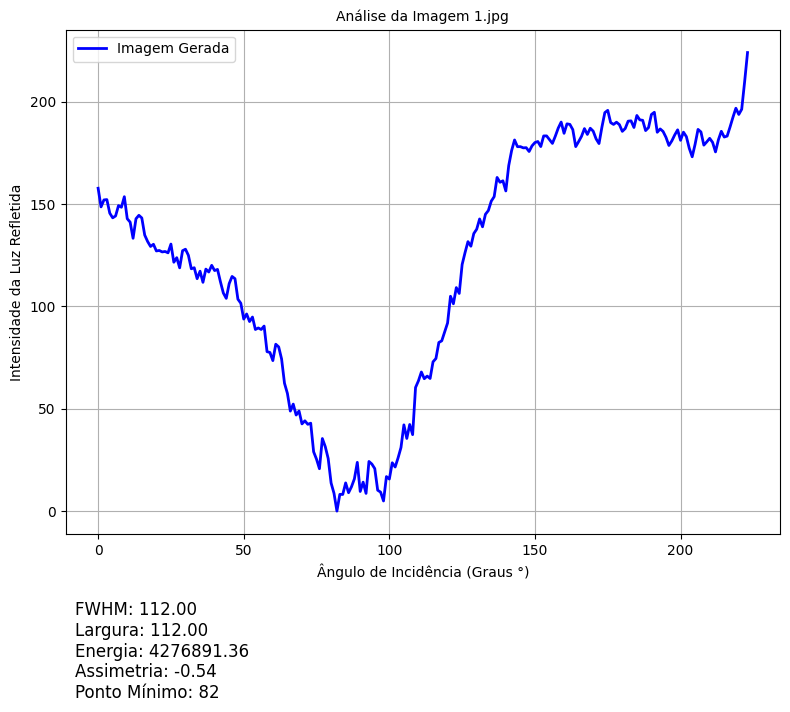

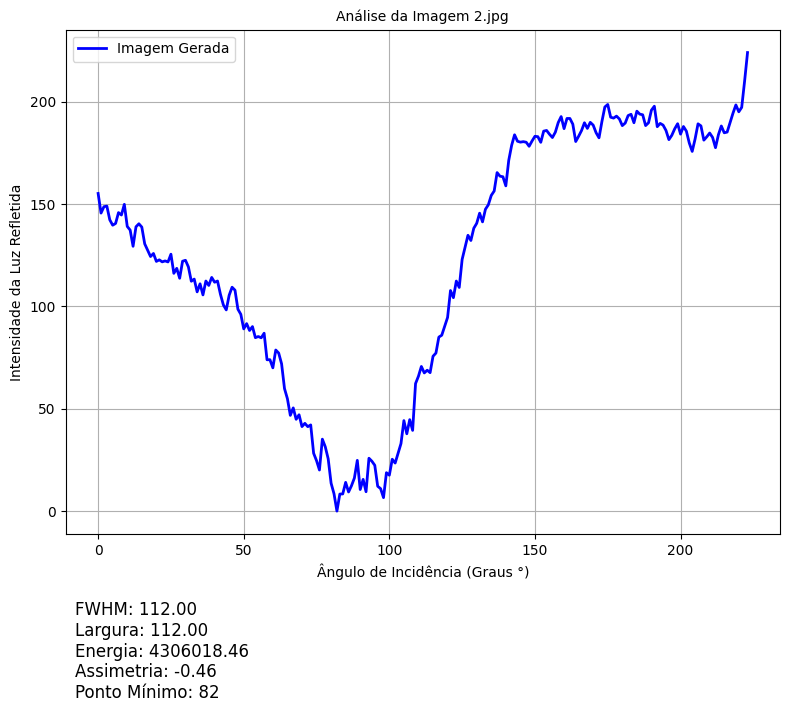

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import skew
import os

# Listas para armazenar dados
images_2 = []
labels_2 = []
image_names_2 = []

# Carregar dados do dataset_11_IMG_GERADA_133_A_1335
for image, label, image_name in dataset_11_IMG_GERADA_133_A_1335:
    images_2.append(image.numpy())  # Converter para NumPy
    labels_2.append(label)
    image_names_2.append(image_name)

# Lista de nomes a serem destacados
destacar_nomes = [
    "1.jpg",
    "2.jpg",
]

# Função para calcular métricas
def calcular_fwhm_max_min_gerada(curva_normalizada_gerada):
    max_value_gerada = np.max(curva_normalizada_gerada)
    min_value_gerada = np.min(curva_normalizada_gerada)
    fwhm_value_gerada = (max_value_gerada - min_value_gerada) / 2.0
    fwhm_line_gerada = min_value_gerada + fwhm_value_gerada
    min_index_gerada = np.argmin(curva_normalizada_gerada)
    return fwhm_value_gerada, fwhm_line_gerada, min_value_gerada, max_value_gerada, min_index_gerada

# Pasta para salvar os gráficos
output_folder = "graficos_spr"
os.makedirs(output_folder, exist_ok=True)

# Iterar sobre cada imagem carregada
for idx, (img_np_gerada, nome_imagem) in enumerate(zip(images_2, image_names_2)):

    if nome_imagem not in destacar_nomes:
        continue  # pula se o nome não for o desejado

    img_np_gerada = np.squeeze(img_np_gerada)
    img_np_gerada = ((img_np_gerada + 1) * 127.5).astype(np.uint8)

    # Calcular curva e normalizar
    curva_gerada = np.sum(img_np_gerada, axis=0)
    curva_normalizada_visual_gerada = (curva_gerada - np.min(curva_gerada)) / (np.max(curva_gerada) - np.min(curva_gerada)) * img_np_gerada.shape[0]

    # Calcular métricas
    fwhm_value_gerada, fwhm_line_gerada, min_value_gerada, max_value_gerada, min_index_gerada = calcular_fwhm_max_min_gerada(curva_normalizada_visual_gerada)
    energia_normalizada_gerada = np.sum(curva_normalizada_visual_gerada ** 2)
    assimetria_gerada = skew(curva_normalizada_visual_gerada)

    # Criar gráfico
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.plot(curva_normalizada_visual_gerada, linewidth=2, color='blue', label="Imagem Gerada")
    ax.legend()

    # Adicionar informações
    info_text = (f'FWHM: {fwhm_value_gerada:.2f}\n'
                 f'Largura: {fwhm_line_gerada:.2f}\n'
                 f'Energia: {energia_normalizada_gerada:.2f}\n'
                 f'Assimetria: {assimetria_gerada:.2f}\n'
                 f'Ponto Mínimo: {min_index_gerada}')
    fig.text(0.10, -0.01, info_text, fontsize=12, ha="left", va="top")

    # Configurar eixos
    plt.title(f"Análise da Imagem {nome_imagem}", fontsize=10)
    plt.xlabel('Ângulo de Incidência (Graus °)')
    plt.ylabel('Intensidade da Luz Refletida')
    plt.grid(True)
    plt.tight_layout()

    # Salvar o gráfico
    nome_grafico = os.path.join(output_folder, f"grafico_{idx + 1}_{nome_imagem}.png")
    plt.savefig(nome_grafico, dpi=300)

    # Mostrar o gráfico
    plt.show()


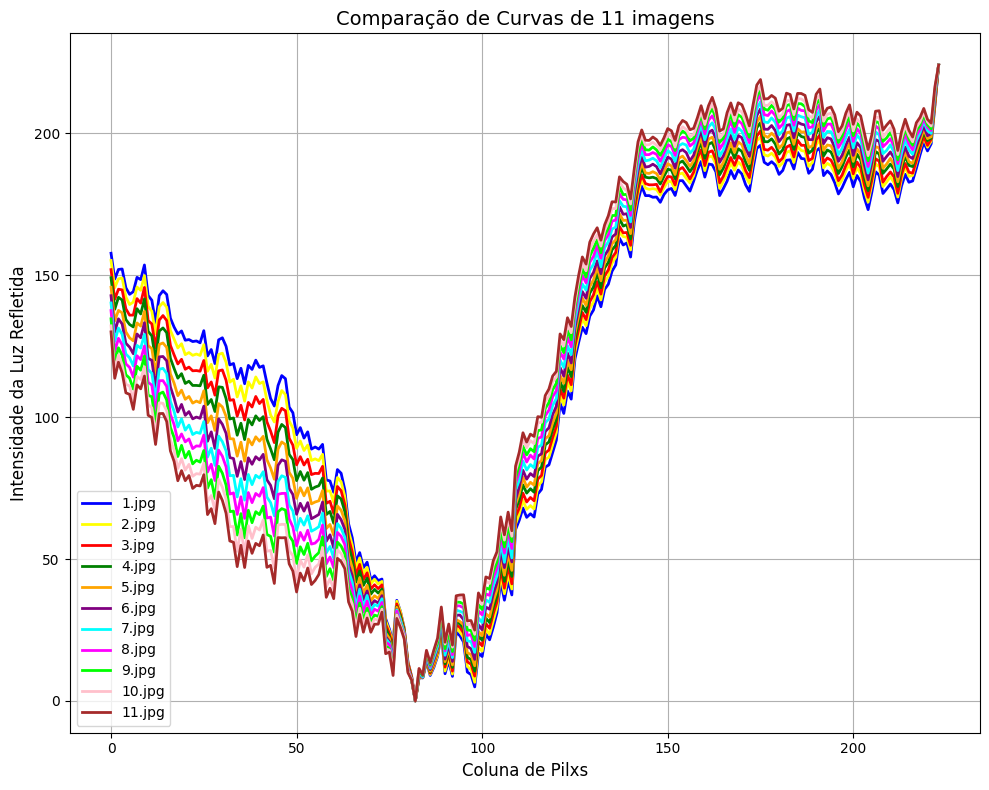

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import os

# Listas para armazenar dados
images_2 = []
labels_2 = []
image_names_2 = []

# Carregar dados do dataset
for image, label, image_name in dataset_11_IMG_GERADA_133_A_1335:
    images_2.append(image.numpy())  # Converter para NumPy
    labels_2.append(label)
    image_names_2.append(image_name)

# Lista de nomes a serem destacados (em ordem desejada)
destacar_nomes = [
    "1.jpg",
    "2.jpg",
    "3.jpg",
    "4.jpg",
    "5.jpg",
    "6.jpg",
    "7.jpg",
    "8.jpg",
    "9.jpg",
    "10.jpg",
    "11.jpg",
]

# Função para calcular métricas
def calcular_fwhm_max_min_gerada(curva_normalizada_gerada):
    max_value_gerada = np.max(curva_normalizada_gerada)
    min_value_gerada = np.min(curva_normalizada_gerada)
    fwhm_value_gerada = (max_value_gerada - min_value_gerada) / 2.0
    fwhm_line_gerada = min_value_gerada + fwhm_value_gerada
    min_index_gerada = np.argmin(curva_normalizada_gerada)
    return fwhm_value_gerada, fwhm_line_gerada, min_value_gerada, max_value_gerada, min_index_gerada



# Preparar variáveis para armazenar curvas
curvas = []
nomes_imagens_selecionadas = []

# Coletar curvas apenas das imagens destacadas
for nome_destacado in destacar_nomes:
    for img_np_gerada, nome_imagem in zip(images_2, image_names_2):
        if nome_imagem == nome_destacado:
            img_np_gerada = np.squeeze(img_np_gerada)
            img_np_gerada = ((img_np_gerada + 1) * 127.5).astype(np.uint8)

            curva_gerada = np.sum(img_np_gerada, axis=0)
            curva_normalizada_visual_gerada = (curva_gerada - np.min(curva_gerada)) / (np.max(curva_gerada) - np.min(curva_gerada)) * img_np_gerada.shape[0]

            curvas.append(curva_normalizada_visual_gerada)
            nomes_imagens_selecionadas.append(nome_imagem)
            break  # Achou, não precisa procurar mais

# Usar as cores que você mandou
cores = [
    'blue',      # azul
    'yellow',    # amarelo
    'red',       # vermelho
    'green',     # verde
    'orange',    # laranja
    'purple',    # roxo
    'cyan',      # ciano
    'magenta',   # magenta
    'lime',      # verde limão
    'pink',      # rosa
    'brown'      # marrom
]

# Criar o gráfico
fig, ax = plt.subplots(figsize=(10, 8))

for curva, nome, cor in zip(curvas, nomes_imagens_selecionadas, cores):
    ax.plot(curva, linewidth=2, color=cor, label=f"{nome}")

ax.legend()
plt.title("Comparação de Curvas de 11 imagens", fontsize=14)
plt.xlabel('Coluna de Pilxs', fontsize=12)
plt.ylabel('Intensidade da Luz Refletida', fontsize=12)
plt.grid(True)
plt.tight_layout()

# Salvar o gráfico
nome_grafico = os.path.join(output_folder, "grafico_comparativo.png")
plt.savefig(nome_grafico, dpi=300)

# Mostrar o gráfico
plt.show()



CSV salvo em: /content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/curvas_das_11img.csv


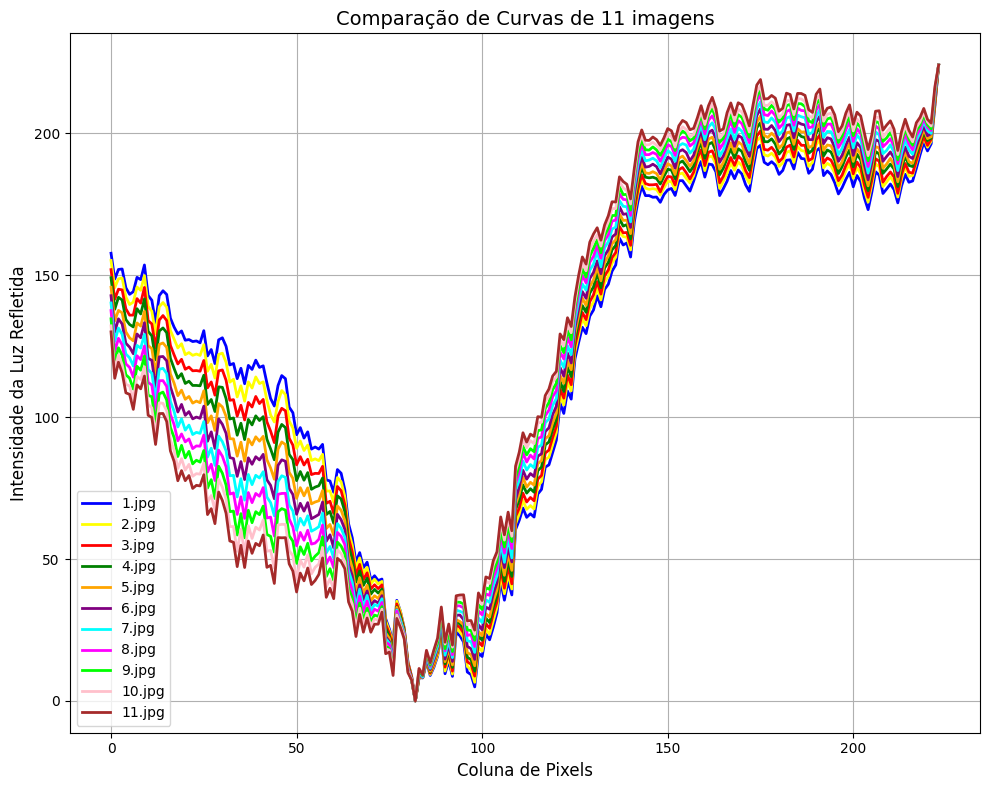

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd

# Listas para armazenar dados
images_2 = []
labels_2 = []
image_names_2 = []

# Carregar dados do dataset
for image, label, image_name in dataset_11_IMG_GERADA_133_A_1335:
    images_2.append(image.numpy())  # Converter para NumPy
    labels_2.append(label)
    image_names_2.append(image_name)

# Lista de nomes a serem destacados
destacar_nomes = [
    "1.jpg", "2.jpg", "3.jpg", "4.jpg", "5.jpg", "6.jpg",
    "7.jpg", "8.jpg", "9.jpg", "10.jpg", "11.jpg",
]

def calcular_fwhm_max_min_gerada(curva_normalizada_gerada):
    max_value_gerada = np.max(curva_normalizada_gerada)
    min_value_gerada = np.min(curva_normalizada_gerada)
    fwhm_value_gerada = (max_value_gerada - min_value_gerada) / 2.0
    fwhm_line_gerada = min_value_gerada + fwhm_value_gerada
    min_index_gerada = np.argmin(curva_normalizada_gerada)
    return fwhm_value_gerada, fwhm_line_gerada, min_value_gerada, max_value_gerada, min_index_gerada

# Preparar variáveis
curvas = []
nomes_imagens_selecionadas = []

for nome_destacado in destacar_nomes:
    for img_np_gerada, nome_imagem in zip(images_2, image_names_2):
        if nome_imagem == nome_destacado:
            img_np_gerada = np.squeeze(img_np_gerada)
            img_np_gerada = ((img_np_gerada + 1) * 127.5).astype(np.uint8)

            curva_gerada = np.sum(img_np_gerada, axis=0)
            curva_normalizada_visual_gerada = (curva_gerada - np.min(curva_gerada)) / (np.max(curva_gerada) - np.min(curva_gerada)) * img_np_gerada.shape[0]

            curvas.append(curva_normalizada_visual_gerada)
            nomes_imagens_selecionadas.append(nome_imagem)
            break

# Cores do gráfico
cores = ['blue', 'yellow', 'red', 'green', 'orange', 'purple', 'cyan', 'magenta', 'lime', 'pink', 'brown']

# Criar gráfico
fig, ax = plt.subplots(figsize=(10, 8))
for curva, nome, cor in zip(curvas, nomes_imagens_selecionadas, cores):
    ax.plot(curva, linewidth=2, color=cor, label=f"{nome}")

ax.legend()
plt.title("Comparação de Curvas de 11 imagens", fontsize=14)
plt.xlabel('Coluna de Pixels', fontsize=12)
plt.ylabel('Intensidade da Luz Refletida', fontsize=12)
plt.grid(True)
plt.tight_layout()

# Caminho de saída no Google Drive
output_folder = "/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/"
os.makedirs(output_folder, exist_ok=True)

# Criar CSV
dados_curvas = {nome: curva for nome, curva in zip(nomes_imagens_selecionadas, curvas)}
df_curvas = pd.DataFrame(dados_curvas)
df_curvas.index.name = 'Coluna de Pixels'

# Salvar CSV
nome_csv = os.path.join(output_folder, "curvas_das_11img.csv")
df_curvas.to_csv(nome_csv)

print(f"CSV salvo em: {nome_csv}")

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import re

def calcular_largura_listra(imagem_tensor):
    imagem_array = imagem_tensor.squeeze().cpu().detach().numpy()
    perfil_vertical = np.mean(imagem_array, axis=0)
    limiar = np.min(perfil_vertical) + (np.max(perfil_vertical) - np.min(perfil_vertical)) * 0.2
    regiao_escura = perfil_vertical < limiar
    indices = np.where(regiao_escura)[0]
    if len(indices) > 0:
        inicio = indices[0]
        fim = indices[-1]
        largura_listra = fim - inicio + 1
    else:
        inicio, fim, largura_listra = None, None, 0
    return largura_listra, inicio, fim

# Lista para armazenar imagens selecionadas
imagens_selecionadas = []

# Iterar sobre todas as imagens no dataset e filtrar as que contêm '_1.33_'
for batch in trainloader:
    if isinstance(batch, (list, tuple)) and len(batch) >= 3:
        image, _, nome_image = batch
        nome_imagem = nome_image[0]
        if re.search(r'_1\.33_', nome_imagem):  # Filtra por nome com '_1.33_'
            imagens_selecionadas.append((image, nome_imagem))
    else:
        raise ValueError("Formato inesperado dos dados no dataset")

# Exibir imagens selecionadas
if imagens_selecionadas:
    fig, axes = plt.subplots(len(imagens_selecionadas), 1, figsize=(8, 5 * len(imagens_selecionadas)))

    if len(imagens_selecionadas) == 1:
        axes = [axes]

    for ax, (img_tensor, nome) in zip(axes, imagens_selecionadas):
        largura, inicio, fim = calcular_largura_listra(img_tensor)
        img_np = img_tensor.squeeze().cpu().detach().numpy()

        # Identificar coluna de menor intensidade luminosa
        perfil_vertical = np.mean(img_np, axis=0)
        coluna_min = np.argmin(perfil_vertical)

        ax.imshow(img_np, cmap='gray')

        # Linha preta na menor intensidade
        ax.axvline(x=coluna_min, color='black', linestyle='-', linewidth=2.5, label='Mínimo')

        if inicio is not None and fim is not None:
            ax.axvline(x=inicio, color='blue', linestyle='--', linewidth=2.5, label='Início')
            ax.axvline(x=fim, color='red', linestyle='--', linewidth=2.5, label='Fim')
            info_text = f"Início: {inicio}px, Fim: {fim}px, Largura: {largura}px, Mínimo: {coluna_min}px"
        else:
            info_text = f"Listra não detectada, Mínimo: {coluna_min}px"

        ax.set_title(f"{nome}\n{info_text}", fontsize=10)
        ax.axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Nenhuma das imagens com '_1.33_' foi encontrada no dataset.")


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # <-- importar pandas para salvar Excel
import re

def calcular_largura_listra(imagem_tensor):
    imagem_array = imagem_tensor.squeeze().cpu().detach().numpy()
    perfil_vertical = np.mean(imagem_array, axis=0)
    limiar = np.min(perfil_vertical) + (np.max(perfil_vertical) - np.min(perfil_vertical)) * 0.2
    regiao_escura = perfil_vertical < limiar
    indices = np.where(regiao_escura)[0]
    if len(indices) > 0:
        inicio = indices[0]
        fim = indices[-1]
        largura_listra = fim - inicio + 1
    else:
        inicio, fim, largura_listra = None, None, 0
    return largura_listra, inicio, fim

# Lista para armazenar imagens selecionadas
imagens_selecionadas = []
# Lista para armazenar os dados para o Excel
dados_excel = []

# Iterar sobre todas as imagens no dataset
for batch in dataset_DATASET_600IMG_SPR1:
#for batch in dataset_DCGAN_1331:
    if isinstance(batch, (list, tuple)) and len(batch) >= 3:
        image, _, nome_image = batch
        nome_imagem = nome_image
        imagens_selecionadas.append((image, nome_imagem))
    else:
        raise ValueError("Formato inesperado dos dados no dataset")

# Exibir imagens selecionadas
if imagens_selecionadas:
    fig, axes = plt.subplots(len(imagens_selecionadas), 1, figsize=(8, 5 * len(imagens_selecionadas)))

    if len(imagens_selecionadas) == 1:
        axes = [axes]

    for ax, (img_tensor, nome) in zip(axes, imagens_selecionadas):
        largura, inicio, fim = calcular_largura_listra(img_tensor)
        img_np = img_tensor.squeeze().cpu().detach().numpy()

        # Identificar coluna de menor intensidade luminosa
        perfil_vertical = np.mean(img_np, axis=0)
        coluna_min = np.argmin(perfil_vertical)

        ax.imshow(img_np, cmap='gray')

        # Linhas
        ax.axvline(x=coluna_min, color='black', linestyle='-', linewidth=2.5, label='Mínimo')
        if inicio is not None and fim is not None:
            ax.axvline(x=inicio, color='blue', linestyle='--', linewidth=2.5, label='Início')
            ax.axvline(x=fim, color='red', linestyle='--', linewidth=2.5, label='Fim')
            info_text = f"Início: {inicio}px, Fim: {fim}px, Largura: {largura}px, Mínimo: {coluna_min}px"
        else:
            info_text = f"Listra não detectada, Mínimo: {coluna_min}px"

        ax.set_title(f"{nome}\n{info_text}", fontsize=10)
        ax.axis('off')

        # Adicionar dados na lista para Excel
        dados_excel.append({
            'Nome da Imagem': nome,
            'Início (px)': inicio if inicio is not None else '',
            'Fim (px)': fim if fim is not None else '',
            'Largura (px)': largura,
            'Coluna de Mínimo (px)': coluna_min
        })

    plt.tight_layout()
    plt.show()

    # Depois de terminar, salvar no Excel
    caminho_arquivo = '/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/nome_inicio_fim_laguraDaMancha_img600.csv'
    df = pd.DataFrame(dados_excel)
    df.to_csv(caminho_arquivo, index=False)

    print("Arquivo 'nome_inicio_fim_laguraDaMancha_img.csv' gerado com sucesso!")

else:
    print("Nenhuma das imagens foi encontrada no dataset.")


Output hidden; open in https://colab.research.google.com to view.

Informações das imagens da classe 5 (ordenadas pelo nome):
Nome da Imagem: 1.jpg, Posição (x, y): (7.68, -8.46)
Nome da Imagem: 2.jpg, Posição (x, y): (7.39, -8.38)
Nome da Imagem: 3.jpg, Posição (x, y): (7.08, -8.13)
Nome da Imagem: 4.jpg, Posição (x, y): (6.69, -7.81)
Nome da Imagem: 5.jpg, Posição (x, y): (6.24, -7.46)
Nome da Imagem: 6.jpg, Posição (x, y): (5.81, -7.12)
Nome da Imagem: 7.jpg, Posição (x, y): (5.47, -6.84)
Nome da Imagem: 8.jpg, Posição (x, y): (5.19, -6.62)
Nome da Imagem: 9.jpg, Posição (x, y): (5.00, -6.47)
Nome da Imagem: 10.jpg, Posição (x, y): (4.90, -6.39)
Nome da Imagem: 11.jpg, Posição (x, y): (4.83, -6.34)


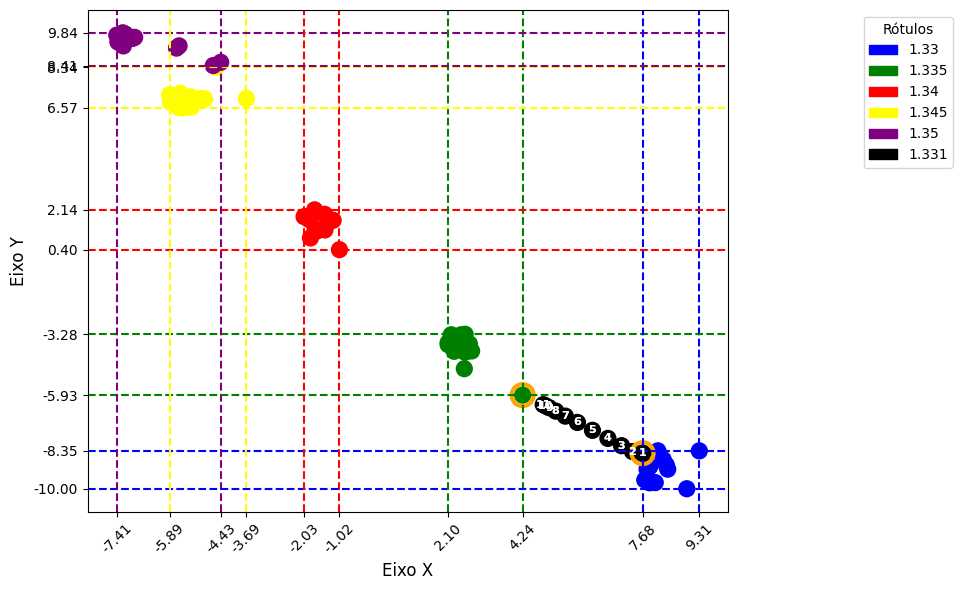

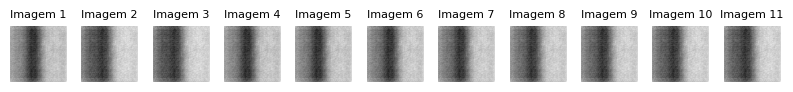

In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from sklearn.manifold import TSNE

# Inicializar listas
images_2 = []
labels_2 = []
image_names_2 = []

# Carregar dados do dataset_DCGAN1
for image, label, image_name in dataset_DCGAN_1331:
    images_2.append(image.numpy())  # Converter para NumPy
    labels_2.append(label)
    image_names_2.append(image_name)

# Nomes das imagens que serão destacadas
destacar_nomes = [
    "imagem_gerada_1_c1_4_img_1.33_guassblur_10.jpg",
    "imagem_gerada_15_c1_4_img_1.335_guassblur_10.jpg"
]


# Verificação dos tamanhos das imagens e conversão para 2D
images_2 = np.array([img_2.flatten() for img_2 in images_2])

# Aplicar t-SNE
perplexity = 16
tsne = TSNE(n_components=2, init='pca', random_state=0, perplexity=perplexity)
digits_proj = tsne.fit_transform(images_2)

# Definir cores
color_map = {0: 'blue', 1: 'green', 2: 'red', 3: 'yellow', 4: 'purple', 5: 'black'}
label_colors = [color_map[int(label)] for label in labels_2]

# Criar patches para legenda
label_values = {0: 1.33, 1: 1.335, 2: 1.34, 3: 1.345, 4: 1.35, 5: 1.331}
legend_patches = [mpatches.Patch(color=color_map[label], label=f'{label_values[label]}') for label in color_map]

# Plot
fig, ax = plt.subplots(figsize=(10, 6))
scatter = ax.scatter(x=digits_proj[:, 0], y=digits_proj[:, 1], c=label_colors, s=130)

# Destacar imagens específicas com um círculo preto
for i, name in enumerate(image_names_2):
    if name in destacar_nomes:
        ax.scatter(digits_proj[i, 0], digits_proj[i, 1],
                   s=250, facecolors='none', edgecolors='orange', linewidths=3)
######################################################################################################
# Lista para armazenar as imagens da classe 5
imagens_classe_5 = []

# Adicionar número extraído do nome da imagem nas bolinhas da classe 5 (label == 5)
for i, (label, name) in enumerate(zip(labels_2, image_names_2)):
    if label == 5:
        x, y = digits_proj[i]
        numero = name.split('.')[0]
        ax.text(x, y, numero, color='white', fontsize=8, ha='center', va='center', fontweight='bold')

        # Adiciona a imagem original à lista
        imagens_classe_5.append(images_2[i])

####################################################################################################
import re

# Função para extrair o número do nome da imagem
def extrair_numero(nome_imagem):
    # Usamos uma expressão regular para pegar o número antes da extensão ".jpg"
    match = re.match(r'(\d+)', nome_imagem)
    if match:
        return int(match.group(1))  # Retorna o número como inteiro
    return float('inf')  # Retorna um valor grande caso não haja número no nome

# Lista para armazenar informações da classe 5
imagens_classe_6 = []

# Adicionar número extraído do nome da imagem nas bolinhas da classe 5 (label == 5)
for i, (label, name) in enumerate(zip(labels_2, image_names_2)):
    if label == 5:
        x, y = digits_proj[i]
        numero = name.split('.')[0]
        ax.text(x, y, numero, color='white', fontsize=8, ha='center', va='center', fontweight='bold')

        # Adiciona uma tupla com nome da imagem e posição no gráfico
        imagens_classe_6.append((name, x, y))

# Ordenar as imagens pela numeração extraída do nome
imagens_classe_6_sorted = sorted(imagens_classe_6, key=lambda item: extrair_numero(item[0]))

# Imprimir as informações coletadas em ordem
print("Informações das imagens da classe 5 (ordenadas pelo nome):")
for name, x, y in imagens_classe_6_sorted:
    print(f"Nome da Imagem: {name}, Posição (x, y): ({x:.2f}, {y:.2f})")


####################################################################################################
# Adicionar linhas delimitadoras por classe (máximos)
labels_2 = np.array(labels_2)
for class_id in np.unique(labels_2):
    if color_map[class_id] == 'black':
        continue  # Ignora a cor preta
    indices = np.where(labels_2 == class_id)[0]
    class_proj = digits_proj[indices]

    max_x = np.max(class_proj[:, 0])
    max_y = np.max(class_proj[:, 1])

    ax.axvline(x=max_x, color=color_map[class_id], linestyle='--', linewidth=1.5)
    ax.axhline(y=max_y, color=color_map[class_id], linestyle='--', linewidth=1.5)

#######################################################
# Coletar todos os valores de X das linhas verticais (mínimos e máximos)
valores_x = []

for class_id in np.unique(labels_2):
    if color_map[class_id] == 'black':
        continue
    indices = np.where(labels_2 == class_id)[0]
    class_proj = digits_proj[indices]
    max_x = np.max(class_proj[:, 0])
    min_x = np.min(class_proj[:, 0])
    valores_x.extend([min_x, max_x])

# Remover duplicatas e ordenar
valores_x = sorted(set(valores_x))

# Atualizar os ticks do eixo X
ax.set_xticks(valores_x)
ax.set_xticklabels([f'{v:.2f}' for v in valores_x], rotation=45)

# Coletar todos os valores de Y das linhas horizontais (mínimos e máximos)
valores_y = []

for class_id in np.unique(labels_2):
    if color_map[class_id] == 'black':
        continue
    indices = np.where(labels_2 == class_id)[0]
    class_proj = digits_proj[indices]
    max_y = np.max(class_proj[:, 1])
    min_y = np.min(class_proj[:, 1])
    valores_y.extend([min_y, max_y])

# Remover duplicatas e ordenar
valores_y = sorted(set(valores_y))

# Atualizar os ticks do eixo Y
ax.set_yticks(valores_y)
ax.set_yticklabels([f'{v:.2f}' for v in valores_y])


#######################################################

# Adicionar linhas delimitadoras por classe (mínimos)
for class_id in np.unique(labels_2):
    if color_map[class_id] == 'black':
        continue  # Ignora a cor preta
    indices = np.where(labels_2 == class_id)[0]
    class_proj = digits_proj[indices]

    min_x = np.min(class_proj[:, 0])
    min_y = np.min(class_proj[:, 1])

    ax.axvline(x=min_x, color=color_map[class_id], linestyle='--', linewidth=1.5)
    ax.axhline(y=min_y, color=color_map[class_id], linestyle='--', linewidth=1.5)

# Eixos e legenda
ax.set_xlabel("Eixo X", fontsize=12)
ax.set_ylabel("Eixo Y", fontsize=12)
plt.legend(handles=legend_patches, title="Rótulos", bbox_to_anchor=(1.2, 1), loc='upper left')

plt.tight_layout(rect=[0, 0, 1.0, 1])
plt.show()


# Exibir as imagens da classe 5 usando a função printImages1
# Visualizar imagens da classe 5
plt.figure(figsize=(8, 8))
for i, img in enumerate(imagens_classe_5):
    plt.subplot(1, len(imagens_classe_5), i + 1)
    plt.imshow(img.reshape(224, 224), cmap='gray')
    plt.axis('off')
    plt.title(f'Imagem {i+1}', fontsize=8 )
plt.tight_layout()
plt.show()








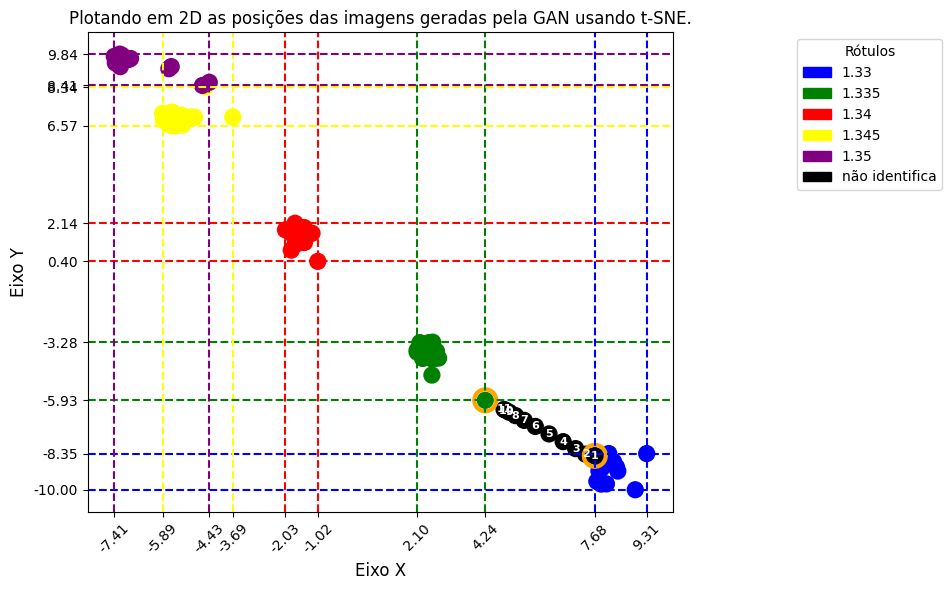

Nome da Imagem: 1.jpg, Posição (x, y): (7.68, -8.46)
Nome da Imagem: 2.jpg, Posição (x, y): (7.39, -8.38)
Nome da Imagem: 3.jpg, Posição (x, y): (7.08, -8.13)
Nome da Imagem: 4.jpg, Posição (x, y): (6.69, -7.81)
Nome da Imagem: 5.jpg, Posição (x, y): (6.24, -7.46)
Nome da Imagem: 6.jpg, Posição (x, y): (5.81, -7.12)
Nome da Imagem: 7.jpg, Posição (x, y): (5.47, -6.84)
Nome da Imagem: 8.jpg, Posição (x, y): (5.19, -6.62)
Nome da Imagem: 9.jpg, Posição (x, y): (5.00, -6.47)
Nome da Imagem: 10.jpg, Posição (x, y): (4.90, -6.39)
Nome da Imagem: 11.jpg, Posição (x, y): (4.83, -6.34)


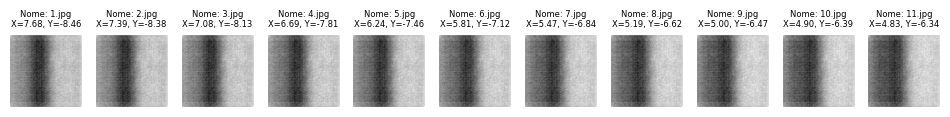

Posições (x, y) das imagens destacadas:
imagem_gerada_1_c1_4_img_1.33_guassblur_10.jpg: x = 7.68, y = -8.46
imagem_gerada_15_c1_4_img_1.335_guassblur_10.jpg: x = 4.24, y = -5.93


In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from sklearn.manifold import TSNE

# Inicializar listas
images_2 = []
labels_2 = []
image_names_2 = []

# Carregar dados do dataset_DCGAN1
for image, label, image_name in dataset_DCGAN_1331:
    images_2.append(image.numpy())  # Converter para NumPy
    labels_2.append(label)
    image_names_2.append(image_name)

# Nomes das imagens que serão destacadas
destacar_nomes = [
    "imagem_gerada_1_c1_4_img_1.33_guassblur_10.jpg",
    "imagem_gerada_15_c1_4_img_1.335_guassblur_10.jpg"
]


# Verificação dos tamanhos das imagens e conversão para 2D
images_2 = np.array([img_2.flatten() for img_2 in images_2])

# Aplicar t-SNE
perplexity = 16
tsne = TSNE(n_components=2, init='pca', random_state=0, perplexity=perplexity)
digits_proj = tsne.fit_transform(images_2)

# Definir cores
color_map = {0: 'blue', 1: 'green', 2: 'red', 3: 'yellow', 4: 'purple', 5: 'black'}
label_colors = [color_map[int(label)] for label in labels_2]

# Criar patches para legenda
label_values = {0: 1.33, 1: 1.335, 2: 1.34, 3: 1.345, 4: 1.35, 5: "não identifica"}
legend_patches = [mpatches.Patch(color=color_map[label], label=f'{label_values[label]}') for label in color_map]

# Plot
fig, ax = plt.subplots(figsize=(10, 6))
scatter = ax.scatter(x=digits_proj[:, 0], y=digits_proj[:, 1], c=label_colors, s=130)

# Destacar imagens específicas com um círculo preto
for i, name in enumerate(image_names_2):
    if name in destacar_nomes:
        ax.scatter(digits_proj[i, 0], digits_proj[i, 1],
                   s=250, facecolors='none', edgecolors='orange', linewidths=3)
######################################################################################################
# Lista para armazenar as imagens da classe 5
imagens_classe_5 = []

# Adicionar número extraído do nome da imagem nas bolinhas da classe 5 (label == 5)
for i, (label, name) in enumerate(zip(labels_2, image_names_2)):
    if label == 5:
        x, y = digits_proj[i]
        numero = name.split('.')[0]
        ax.text(x, y, numero, color='white', fontsize=8, ha='center', va='center', fontweight='bold')

        # Adiciona a imagem original e o nome à lista
        imagens_classe_5.append((name, images_2[i]))  # Agora armazenando uma tupla com nome e imagem

####################################################################################################

####################################################################################################
# Adicionar linhas delimitadoras por classe (máximos)
labels_2 = np.array(labels_2)
for class_id in np.unique(labels_2):
    if color_map[class_id] == 'black':
        continue  # Ignora a cor preta
    indices = np.where(labels_2 == class_id)[0]
    class_proj = digits_proj[indices]

    max_x = np.max(class_proj[:, 0])
    max_y = np.max(class_proj[:, 1])

    ax.axvline(x=max_x, color=color_map[class_id], linestyle='--', linewidth=1.5)
    ax.axhline(y=max_y, color=color_map[class_id], linestyle='--', linewidth=1.5)

#######################################################
# Coletar todos os valores de X das linhas verticais (mínimos e máximos)
valores_x = []

for class_id in np.unique(labels_2):
    if color_map[class_id] == 'black':
        continue
    indices = np.where(labels_2 == class_id)[0]
    class_proj = digits_proj[indices]
    max_x = np.max(class_proj[:, 0])
    min_x = np.min(class_proj[:, 0])
    valores_x.extend([min_x, max_x])

# Remover duplicatas e ordenar
valores_x = sorted(set(valores_x))

# Atualizar os ticks do eixo X
ax.set_xticks(valores_x)
ax.set_xticklabels([f'{v:.2f}' for v in valores_x], rotation=45)

# Coletar todos os valores de Y das linhas horizontais (mínimos e máximos)
valores_y = []

for class_id in np.unique(labels_2):
    if color_map[class_id] == 'black':
        continue
    indices = np.where(labels_2 == class_id)[0]
    class_proj = digits_proj[indices]
    max_y = np.max(class_proj[:, 1])
    min_y = np.min(class_proj[:, 1])
    valores_y.extend([min_y, max_y])

# Remover duplicatas e ordenar
valores_y = sorted(set(valores_y))

# Atualizar os ticks do eixo Y
ax.set_yticks(valores_y)
ax.set_yticklabels([f'{v:.2f}' for v in valores_y])


#######################################################

# Adicionar linhas delimitadoras por classe (mínimos)
for class_id in np.unique(labels_2):
    if color_map[class_id] == 'black':
        continue  # Ignora a cor preta
    indices = np.where(labels_2 == class_id)[0]
    class_proj = digits_proj[indices]

    min_x = np.min(class_proj[:, 0])
    min_y = np.min(class_proj[:, 1])

    ax.axvline(x=min_x, color=color_map[class_id], linestyle='--', linewidth=1.5)
    ax.axhline(y=min_y, color=color_map[class_id], linestyle='--', linewidth=1.5)

# Eixos e legenda
ax.set_xlabel("Eixo X", fontsize=12)
ax.set_ylabel("Eixo Y", fontsize=12)
plt.legend(handles=legend_patches, title="Rótulos", bbox_to_anchor=(1.2, 1), loc='upper left')

plt.title("Plotando em 2D as posições das imagens geradas pela GAN usando t-SNE.", fontsize=12)



plt.tight_layout(rect=[0, 0, 1.0, 1])
plt.show()


# Exibir as imagens da classe 5 usando a função printImages1

#######################################################################
import re

# Função para extrair o número do nome da imagem
def extrair_numero(nome_imagem):
    # Usamos uma expressão regular para pegar o número antes da extensão ".jpg"
    match = re.match(r'(\d+)', nome_imagem)
    if match:
        return int(match.group(1))  # Retorna o número como inteiro
    return float('inf')  # Retorna um valor grande caso não haja número no nome

# Lista para armazenar informações da classe 5
imagens_classe_6 = []


# Adicionar número extraído do nome da imagem nas bolinhas da classe 5 (label == 5)
for i, (label, name) in enumerate(zip(labels_2, image_names_2)):
    if label == 5:
        x, y = digits_proj[i]
        numero = name.split('.')[0]
        ax.text(x, y, numero, color='white', fontsize=8, ha='center', va='center', fontweight='bold')

        # Adiciona uma tupla com nome da imagem e posição no gráfico
        imagens_classe_6.append((name, x, y))

# Ordenar as imagens pela numeração extraída do nome
imagens_classe_6_sorted = sorted(imagens_classe_6, key=lambda item: extrair_numero(item[0]))

# Imprimir as informações coletadas em ordem
#print("Informações das imagens da classe 5 (ordenadas pelo nome):")
for name, x, y in imagens_classe_6_sorted:
    print(f"Nome da Imagem: {name}, Posição (x, y): ({x:.2f}, {y:.2f})")


# Agora, ao exibir as imagens, vamos acessar o nome e a imagem
fig = plt.figure(figsize=(12, 8))

# Ordena as imagens com base no número no nome (removendo o '.jpg')
imagens_classe_5_sorted = sorted(imagens_classe_5, key=lambda item: int(item[0].split('.')[0]))

# Exibindo as imagens ordenadas
for i, (nome, img) in enumerate(imagens_classe_5_sorted):  # Acessa a tupla (nome, imagem)
    ax = plt.subplot(1, len(imagens_classe_5_sorted), i + 1)
    ax.imshow(img.reshape(224, 224), cmap='gray')
    ax.axis('off')

    # Título acima da imagem com o nome da imagem
    # Exibindo o nome da imagem e as coordenadas (assumindo que você tem as coordenadas de x e y na lista `imagens_classe_6_sorted`)
    if i < len(imagens_classe_6_sorted):
        _, x, y = imagens_classe_6_sorted[i]
        ax.set_title(f"Nome: {nome}\nX={x:.2f}, Y={y:.2f}", fontsize=6)

plt.subplots_adjust(top=0.85, bottom=0.15)
plt.show()

##############################################################
# Lista de posições (x, y) das imagens destacadas
posicoes_destacadas = []

# Iterar sobre as imagens e verificar se o nome está na lista de destaque
for i, nome in enumerate(image_names_2):
    if nome in destacar_nomes:
        x, y = digits_proj[i]
        posicoes_destacadas.append((nome, x, y))

# Exibir as posições encontradas
print("Posições (x, y) das imagens destacadas:")
for nome, x, y in posicoes_destacadas:
    print(f"{nome}: x = {x:.2f}, y = {y:.2f}")




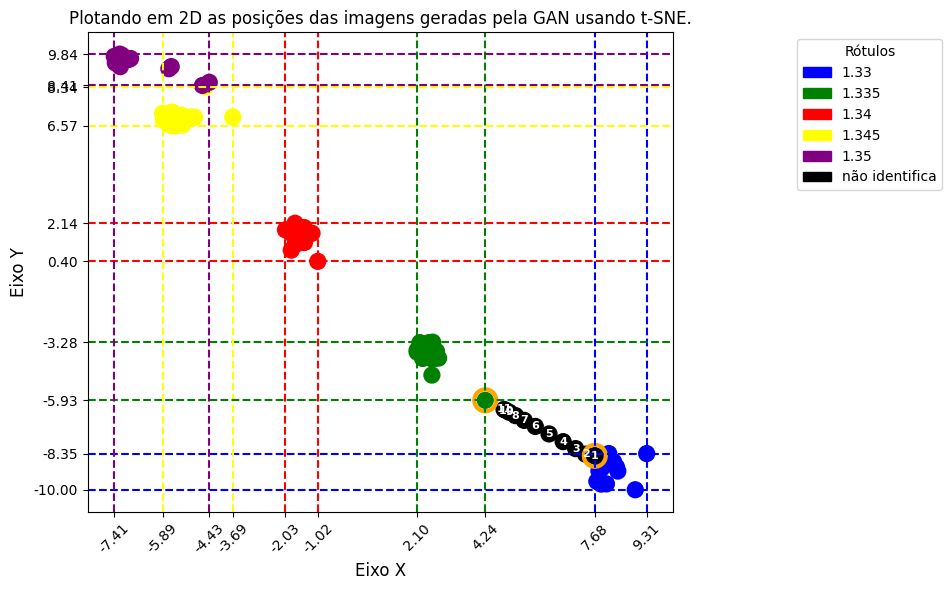

Posições (x, y) de todas as imagens:
Nome da Imagem: 1.jpg, Posição (x, y): (7.68, -8.46)
Nome da Imagem: 2.jpg, Posição (x, y): (7.39, -8.38)
Nome da Imagem: 3.jpg, Posição (x, y): (7.08, -8.13)
Nome da Imagem: 4.jpg, Posição (x, y): (6.69, -7.81)
Nome da Imagem: 5.jpg, Posição (x, y): (6.24, -7.46)
Nome da Imagem: 6.jpg, Posição (x, y): (5.81, -7.12)
Nome da Imagem: 7.jpg, Posição (x, y): (5.47, -6.84)
Nome da Imagem: 8.jpg, Posição (x, y): (5.19, -6.62)
Nome da Imagem: 9.jpg, Posição (x, y): (5.00, -6.47)
Nome da Imagem: 10.jpg, Posição (x, y): (4.90, -6.39)
Nome da Imagem: 11.jpg, Posição (x, y): (4.83, -6.34)
Nome da Imagem: imagem_gerada_11_c1_4_img_1.33_guassblur_10.jpg, Posição (x, y): (8.28, -8.73)
Nome da Imagem: imagem_gerada_12_c1_4_img_1.33_guassblur_2.jpg, Posição (x, y): (8.12, -8.35)
Nome da Imagem: imagem_gerada_15_c1_4_img_1.33_guassblur_10.jpg, Posição (x, y): (7.75, -9.62)
Nome da Imagem: imagem_gerada_16_c1_4_img_1.33_guassblur_2.jpg, Posição (x, y): (8.05, -9.73)


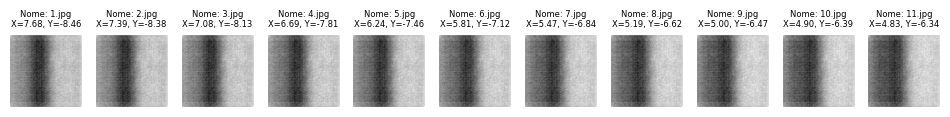

Posições (x, y) das imagens destacadas:
imagem_gerada_1_c1_4_img_1.33_guassblur_10.jpg: x = 7.68, y = -8.46
imagem_gerada_15_c1_4_img_1.335_guassblur_10.jpg: x = 4.24, y = -5.93


In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from sklearn.manifold import TSNE

# Inicializar listas
images_2 = []
labels_2 = []
image_names_2 = []

# Carregar dados do dataset_DCGAN1
for image, label, image_name in dataset_DCGAN_1331:
    images_2.append(image.numpy())  # Converter para NumPy
    labels_2.append(label)
    image_names_2.append(image_name)

# Nomes das imagens que serão destacadas
destacar_nomes = [
    "imagem_gerada_1_c1_4_img_1.33_guassblur_10.jpg",
    "imagem_gerada_15_c1_4_img_1.335_guassblur_10.jpg"
]


# Verificação dos tamanhos das imagens e conversão para 2D
images_2 = np.array([img_2.flatten() for img_2 in images_2])

# Aplicar t-SNE
perplexity = 16
tsne = TSNE(n_components=2, init='pca', random_state=0, perplexity=perplexity)
digits_proj = tsne.fit_transform(images_2)

# Definir cores
color_map = {0: 'blue', 1: 'green', 2: 'red', 3: 'yellow', 4: 'purple', 5: 'black'}
label_colors = [color_map[int(label)] for label in labels_2]

# Criar patches para legenda
label_values = {0: 1.33, 1: 1.335, 2: 1.34, 3: 1.345, 4: 1.35, 5: "não identifica"}
legend_patches = [mpatches.Patch(color=color_map[label], label=f'{label_values[label]}') for label in color_map]

# Plot
fig, ax = plt.subplots(figsize=(10, 6))
scatter = ax.scatter(x=digits_proj[:, 0], y=digits_proj[:, 1], c=label_colors, s=130)

# Destacar imagens específicas com um círculo preto
for i, name in enumerate(image_names_2):
    if name in destacar_nomes:
        ax.scatter(digits_proj[i, 0], digits_proj[i, 1],
                   s=250, facecolors='none', edgecolors='orange', linewidths=3)
######################################################################################################
# Lista para armazenar as imagens da classe 5
imagens_classe_5 = []

# Adicionar número extraído do nome da imagem nas bolinhas da classe 5 (label == 5)
for i, (label, name) in enumerate(zip(labels_2, image_names_2)):
    if label == 5:
        x, y = digits_proj[i]
        numero = name.split('.')[0]
        ax.text(x, y, numero, color='white', fontsize=8, ha='center', va='center', fontweight='bold')

        # Adiciona a imagem original e o nome à lista
        imagens_classe_5.append((name, images_2[i]))  # Agora armazenando uma tupla com nome e imagem

####################################################################################################

####################################################################################################
# Adicionar linhas delimitadoras por classe (máximos)
labels_2 = np.array(labels_2)
for class_id in np.unique(labels_2):
    if color_map[class_id] == 'black':
        continue  # Ignora a cor preta
    indices = np.where(labels_2 == class_id)[0]
    class_proj = digits_proj[indices]

    max_x = np.max(class_proj[:, 0])
    max_y = np.max(class_proj[:, 1])

    ax.axvline(x=max_x, color=color_map[class_id], linestyle='--', linewidth=1.5)
    ax.axhline(y=max_y, color=color_map[class_id], linestyle='--', linewidth=1.5)

#######################################################
# Coletar todos os valores de X das linhas verticais (mínimos e máximos)
valores_x = []

for class_id in np.unique(labels_2):
    if color_map[class_id] == 'black':
        continue
    indices = np.where(labels_2 == class_id)[0]
    class_proj = digits_proj[indices]
    max_x = np.max(class_proj[:, 0])
    min_x = np.min(class_proj[:, 0])
    valores_x.extend([min_x, max_x])

# Remover duplicatas e ordenar
valores_x = sorted(set(valores_x))

# Atualizar os ticks do eixo X
ax.set_xticks(valores_x)
ax.set_xticklabels([f'{v:.2f}' for v in valores_x], rotation=45)

# Coletar todos os valores de Y das linhas horizontais (mínimos e máximos)
valores_y = []

for class_id in np.unique(labels_2):
    if color_map[class_id] == 'black':
        continue
    indices = np.where(labels_2 == class_id)[0]
    class_proj = digits_proj[indices]
    max_y = np.max(class_proj[:, 1])
    min_y = np.min(class_proj[:, 1])
    valores_y.extend([min_y, max_y])

# Remover duplicatas e ordenar
valores_y = sorted(set(valores_y))

# Atualizar os ticks do eixo Y
ax.set_yticks(valores_y)
ax.set_yticklabels([f'{v:.2f}' for v in valores_y])


#######################################################

# Adicionar linhas delimitadoras por classe (mínimos)
for class_id in np.unique(labels_2):
    if color_map[class_id] == 'black':
        continue  # Ignora a cor preta
    indices = np.where(labels_2 == class_id)[0]
    class_proj = digits_proj[indices]

    min_x = np.min(class_proj[:, 0])
    min_y = np.min(class_proj[:, 1])

    ax.axvline(x=min_x, color=color_map[class_id], linestyle='--', linewidth=1.5)
    ax.axhline(y=min_y, color=color_map[class_id], linestyle='--', linewidth=1.5)

# Eixos e legenda
ax.set_xlabel("Eixo X", fontsize=12)
ax.set_ylabel("Eixo Y", fontsize=12)
plt.legend(handles=legend_patches, title="Rótulos", bbox_to_anchor=(1.2, 1), loc='upper left')

plt.title("Plotando em 2D as posições das imagens geradas pela GAN usando t-SNE.", fontsize=12)



plt.tight_layout(rect=[0, 0, 1.0, 1])
plt.show()


# Exibir as imagens da classe 5 usando a função printImages1

#######################################################################
import re

# Função para extrair o número do nome da imagem
def extrair_numero(nome_imagem):
    # Usamos uma expressão regular para pegar o número antes da extensão ".jpg"
    match = re.match(r'(\d+)', nome_imagem)
    if match:
        return int(match.group(1))  # Retorna o número como inteiro
    return float('inf')  # Retorna um valor grande caso não haja número no nome

# Lista para armazenar informações da classe 5
imagens_classe_6 = []

# Adicionar número extraído do nome da imagem nas bolinhas da classe 5 (label == 5)
for i, (label, name) in enumerate(zip(labels_2, image_names_2)):
    if label == 5:
        x, y = digits_proj[i]
        numero = name.split('.')[0]
        ax.text(x, y, numero, color='white', fontsize=8, ha='center', va='center', fontweight='bold')

        # Adiciona uma tupla com nome da imagem e posição no gráfico
        imagens_classe_6.append((name, x, y))

# Ordenar as imagens pela numeração extraída do nome
imagens_classe_6_sorted = sorted(imagens_classe_6, key=lambda item: extrair_numero(item[0]))
"""
# Imprimir as informações coletadas em ordem
print("Posições (x, y) das imagens de 6:")
for name, x, y in imagens_classe_6_sorted:
    print(f"Nome da Imagem: {name}, Posição (x, y): ({x:.2f}, {y:.2f})")
"""
###############################################################
imagens_classe_0_ate_5 = []

for i, (label, name) in enumerate(zip(labels_2, image_names_2)):
    if 0 <= label <= 5:
        x, y = digits_proj[i]
        imagens_classe_0_ate_5.append((name, x, y))

# Ordenar as imagens pela numeração extraída do nome
imagens_classe_0_ate_5_sorted = sorted(imagens_classe_0_ate_5, key=lambda item: extrair_numero(item[0]))

# Imprimir as informações coletadas em ordem
print("Posições (x, y) de todas as imagens:")
for name, x, y in imagens_classe_0_ate_5_sorted:
    print(f"Nome da Imagem: {name}, Posição (x, y): ({x:.2f}, {y:.2f})")

###############################################################
"""
import csv

# Caminho no Google Drive
caminho_arquivo = '/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/posicao_de_x_y_todas_img.csv'

# Criar e salvar o CSV
with open(caminho_arquivo, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Nome da Imagem', 'Posição X', 'Posição Y'])  # Cabeçalho
    for name, x, y in imagens_classe_0_ate_5_sorted:
        writer.writerow([name, f"{x:.2f}", f"{y:.2f}"])

print(f"Arquivo CSV salvo em: {caminho_arquivo}")
"""
###############################################################

# Agora, ao exibir as imagens, vamos acessar o nome e a imagem
fig = plt.figure(figsize=(12, 8))

# Ordena as imagens com base no número no nome (removendo o '.jpg')
imagens_classe_5_sorted = sorted(imagens_classe_5, key=lambda item: int(item[0].split('.')[0]))

# Exibindo as imagens ordenadas
for i, (nome, img) in enumerate(imagens_classe_5_sorted):  # Acessa a tupla (nome, imagem)
    ax = plt.subplot(1, len(imagens_classe_5_sorted), i + 1)
    ax.imshow(img.reshape(224, 224), cmap='gray')
    ax.axis('off')

    # Título acima da imagem com o nome da imagem
    # Exibindo o nome da imagem e as coordenadas (assumindo que você tem as coordenadas de x e y na lista `imagens_classe_6_sorted`)
    if i < len(imagens_classe_6_sorted):
        _, x, y = imagens_classe_6_sorted[i]
        ax.set_title(f"Nome: {nome}\nX={x:.2f}, Y={y:.2f}", fontsize=6)

plt.subplots_adjust(top=0.85, bottom=0.15)
plt.show()

##############################################################
# Lista de posições (x, y) das imagens destacadas
posicoes_destacadas = []

# Iterar sobre as imagens e verificar se o nome está na lista de destaque
for i, nome in enumerate(image_names_2):
    if nome in destacar_nomes:
        x, y = digits_proj[i]
        posicoes_destacadas.append((nome, x, y))

# Exibir as posições encontradas
print("Posições (x, y) das imagens destacadas:")
for nome, x, y in posicoes_destacadas:
    print(f"{nome}: x = {x:.2f}, y = {y:.2f}")



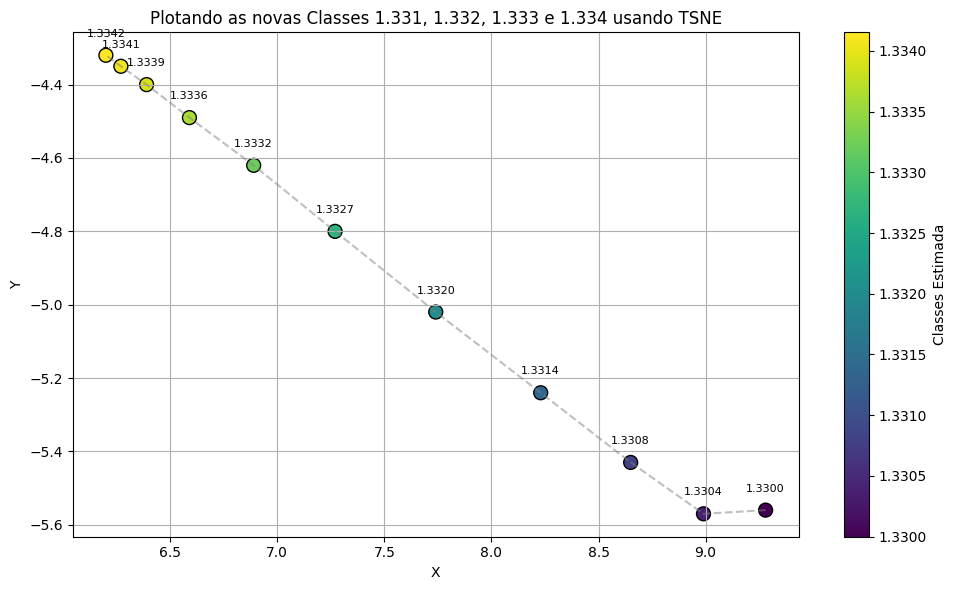

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Dados das posições (x, y) das imagens
coords = np.array([
    [9.28, -5.56],  # 1.jpg
    [8.99, -5.57],
    [8.65, -5.43],
    [8.23, -5.24],
    [7.74, -5.02],
    [7.27, -4.80],
    [6.89, -4.62],
    [6.59, -4.49],
    [6.39, -4.40],
    [6.27, -4.35],
    [6.20, -4.32],  # 11.jpg
])





#Define P1 (classe 1.330) e P2 (classe 1.335) pelas coordenadas reais
P1 = np.array([9.28, -5.56])
P2 = np.array([5.59, -4.02])

classe_P1 = 1.330
classe_P2 = 1.335

# Distância total entre P1 e P2
dist_total = np.linalg.norm(P2 - P1)


# Cria uma lista vazia para armazenar os valores de classe estimados para cada ponto
classes_est = []

# Para cada ponto na lista de coordenadas 'coords'
for point in coords:
    dist_i = np.linalg.norm(point - P1)  # Calcula a distância euclidiana entre o ponto atual e o ponto inicial P1

    # Interpola a classe do ponto atual com base na distância relativa entre P1 e P2
    # A ideia é: quanto mais próximo de P2, mais o valor da classe se aproxima de classe_P2
    # quanto mais próximo de P1, mais o valor da classe se aproxima de classe_P1
    classe_i = classe_P1 + (dist_i / dist_total) * (classe_P2 - classe_P1)

    # Adiciona a classe estimada à lista
    classes_est.append(classe_i)

# Converte a lista para um array numpy, facilitando o uso posterior em operações vetoriais
classes_est = np.array(classes_est)

# Gráfico
plt.figure(figsize=(10, 6))
scatter = plt.scatter(coords[:, 0], coords[:, 1], c=classes_est, cmap='viridis', s=100, edgecolor='black')
plt.plot(coords[:, 0], coords[:, 1], linestyle='--', color='gray', alpha=0.5)

# Adiciona os rótulos com as classes
for i, txt in enumerate(classes_est):
    plt.text(coords[i, 0], coords[i, 1]+0.05, f'{txt:.4f}', ha='center', fontsize=8)

plt.title("Plotando as novas Classes 1.331, 1.332, 1.333 e 1.334 usando TSNE")
plt.xlabel("X")
plt.ylabel("Y")
cbar = plt.colorbar(scatter)
cbar.set_label("Classes Estimada")
plt.grid(True)
plt.tight_layout()
plt.show()


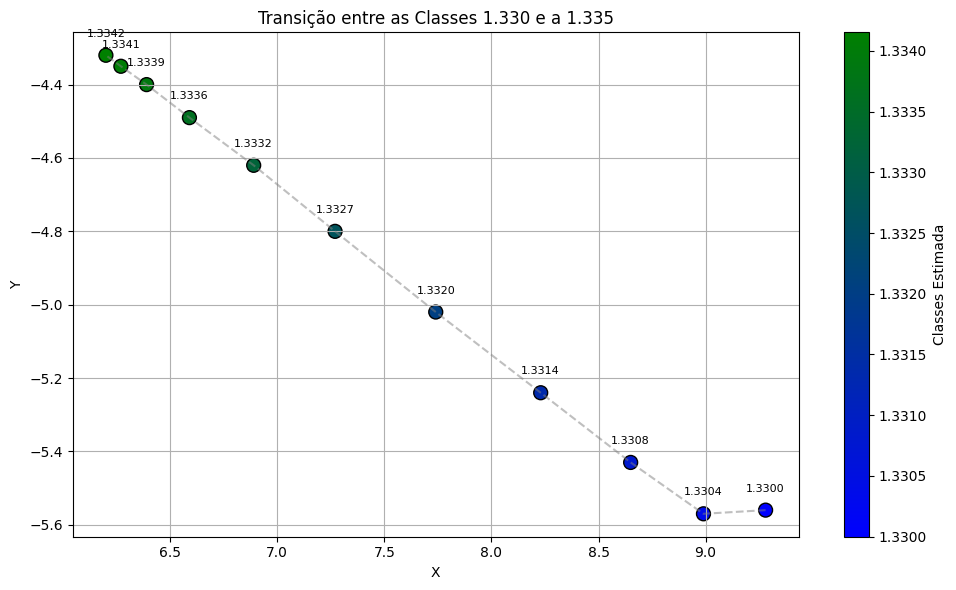

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

# Dados das posições (x, y) das imagens
coords = np.array([
    [9.28, -5.56],  # 1.jpg
    [8.99, -5.57],
    [8.65, -5.43],
    [8.23, -5.24],
    [7.74, -5.02],
    [7.27, -4.80],
    [6.89, -4.62],
    [6.59, -4.49],
    [6.39, -4.40],
    [6.27, -4.35],
    [6.20, -4.32],  # 11.jpg
])





#Define P1 (classe 1.330) e P2 (classe 1.335) pelas coordenadas reais
P1 = np.array([9.28, -5.56])
P2 = np.array([5.59, -4.02])

classe_P1 = 1.330
classe_P2 = 1.335

# Distância total entre P1 e P2
dist_total = np.linalg.norm(P2 - P1)


# Cria uma lista vazia para armazenar os valores de classe estimados para cada ponto
classes_est = []

# Para cada ponto na lista de coordenadas 'coords'
for point in coords:
    dist_i = np.linalg.norm(point - P1)  # Calcula a distância euclidiana entre o ponto atual e o ponto inicial P1

    # Interpola a classe do ponto atual com base na distância relativa entre P1 e P2
    # A ideia é: quanto mais próximo de P2, mais o valor da classe se aproxima de classe_P2
    # quanto mais próximo de P1, mais o valor da classe se aproxima de classe_P1
    classe_i = classe_P1 + (dist_i / dist_total) * (classe_P2 - classe_P1)

    # Adiciona a classe estimada à lista
    classes_est.append(classe_i)

# Converte a lista para um array numpy, facilitando o uso posterior em operações vetoriais
classes_est = np.array(classes_est)


# Define um colormap de azul para verde
custom_cmap = LinearSegmentedColormap.from_list("blue_green", ["blue", "green"])

# ... (seu código anterior continua igual até o plt.scatter)

# Gráfico
plt.figure(figsize=(10, 6))
scatter = plt.scatter(coords[:, 0], coords[:, 1], c=classes_est, cmap=custom_cmap, s=100, edgecolor='black')
plt.plot(coords[:, 0], coords[:, 1], linestyle='--', color='gray', alpha=0.5)

# Adiciona os rótulos com as classes
for i, txt in enumerate(classes_est):
    plt.text(coords[i, 0], coords[i, 1]+0.05, f'{txt:.4f}', ha='center', fontsize=8)

plt.title("Transição entre as Classes 1.330 e a 1.335")
plt.xlabel("X")
plt.ylabel("Y")
cbar = plt.colorbar(scatter)
cbar.set_label("Classes Estimada")
plt.grid(True)
plt.tight_layout()
plt.show()


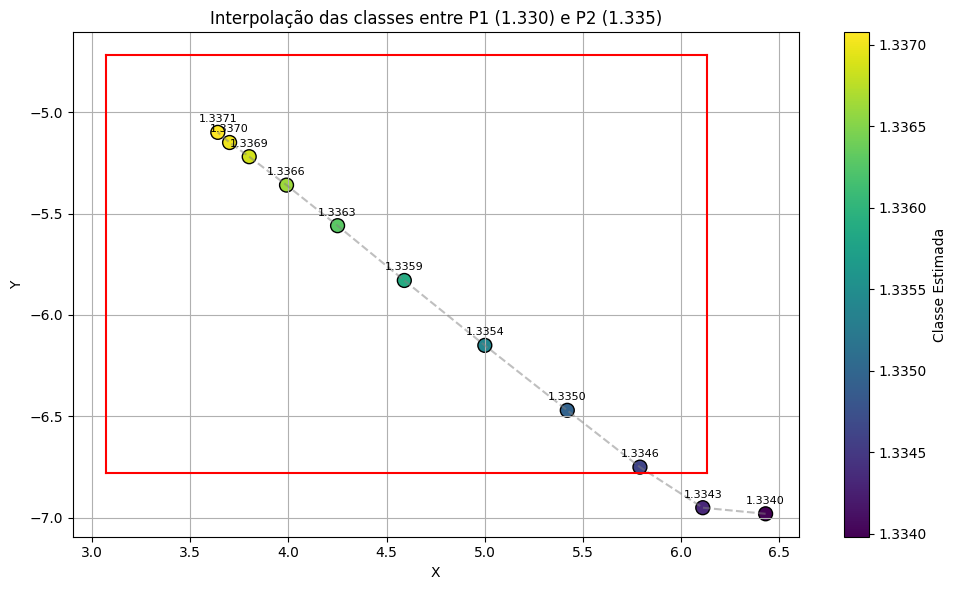

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Limites do quadro
x_min, x_max = 3.07, 6.13
y_min, y_max = -6.78, -4.72

# Dados das posições (x, y) das imagens
coords = np.array([
    [6.43, -6.98],  # P1
    [6.11, -6.95],
    [5.79, -6.75],
    [5.42, -6.47],
    [5.00, -6.15],
    [4.59, -5.83],
    [4.25, -5.56],
    [3.99, -5.36],
    [3.80, -5.22],
    [3.70, -5.15],
    [3.64, -5.10],  # P2
])

# Define P1 (classe 1.330) e P2 (classe 1.335) pelas coordenadas reais
P1 = np.array([9.28, -5.56])
P2 = np.array([5.59, -4.02])
classe_P1 = 1.330
classe_P2 = 1.335

# Distância total entre P1 e P2
dist_total = np.linalg.norm(P2 - P1)

# Cálculo das classes estimadas por interpolação euclidiana normalizada
classes_est = []
for point in coords:
    dist_i = np.linalg.norm(point - P1)
    classe_i = classe_P1 + (dist_i / dist_total) * (classe_P2 - classe_P1)
    classes_est.append(classe_i)
classes_est = np.array(classes_est)

# Gráfico
plt.figure(figsize=(10, 6))
scatter = plt.scatter(coords[:, 0], coords[:, 1], c=classes_est, cmap='viridis', s=100, edgecolor='black')
plt.plot(coords[:, 0], coords[:, 1], linestyle='--', color='gray', alpha=0.5)

# Adiciona os rótulos com as classes
for i, txt in enumerate(classes_est):
    plt.text(coords[i, 0], coords[i, 1]+0.05, f'{txt:.4f}', ha='center', fontsize=8)

# Adiciona o quadro vermelho para demarcar a área
plt.plot([x_min, x_max], [y_min, y_min], 'r')  # base
plt.plot([x_min, x_max], [y_max, y_max], 'r')  # topo
plt.plot([x_min, x_min], [y_min, y_max], 'r')  # esquerda
plt.plot([x_max, x_max], [y_min, y_max], 'r')  # direita

plt.title("Interpolação das classes entre P1 (1.330) e P2 (1.335)")
plt.xlabel("X")
plt.ylabel("Y")
cbar = plt.colorbar(scatter)
cbar.set_label("Classe Estimada")
plt.grid(True)
plt.tight_layout()
plt.show()



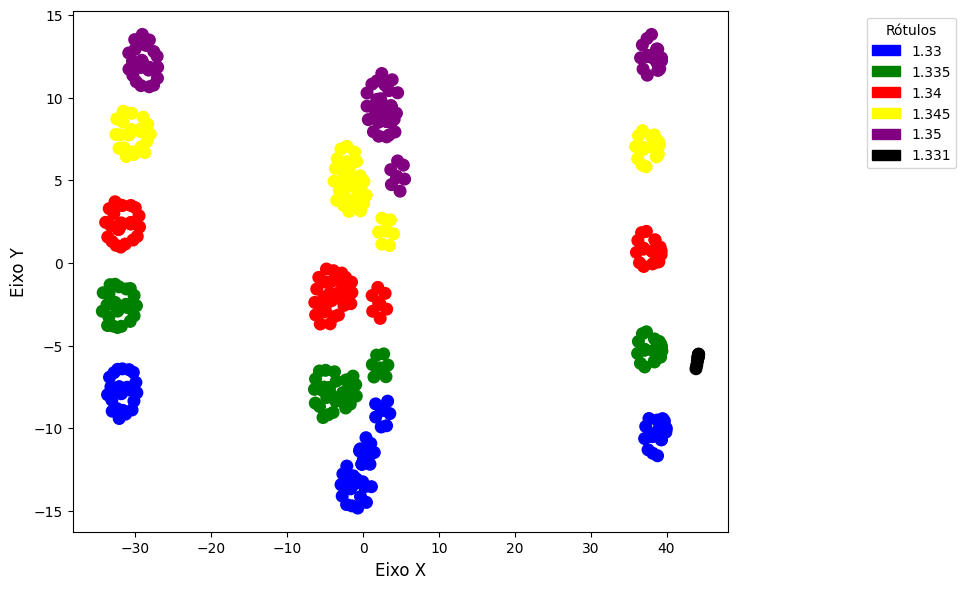

In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from sklearn.manifold import TSNE

# Inicializar listas
images_2 = []
labels_2 = []
image_names_2 = []

# Carregar dados do dataset_testloader
for image, label, image_name in dataset_todas_img_simuladas1:
    images_2.append(image.numpy())  # Converter para NumPy
    labels_2.append(label)
    image_names_2.append(image_name)



# Verificação dos tamanhos das imagens e conversão para 2D
images_2 = np.array([img_2.flatten() for img_2 in images_2])
# Aplicar t-SNE
perplexity = 30
tsne = TSNE(n_components=2, init='pca',  random_state=0, perplexity = perplexity)
digits_proj = tsne.fit_transform(images_2)

# Definir cores
color_map = {0: 'blue', 1: 'green', 2: 'red', 3: 'yellow', 4: 'purple', 5: 'black'}
label_colors = [color_map[int(label)] for label in labels_2]

# Criar patches para legenda

label_values = { 0: 1.33, 1: 1.335, 2: 1.34, 3: 1.345, 4: 1.35, 5: 1.331}
# Criar patches para a legenda com os valores personalizados
legend_patches = [
    mpatches.Patch(color=color_map[label], label=f'{label_values[label]}')
    for label in color_map
]
# Plot
fig, ax = plt.subplots(figsize=(10, 6))
scatter = ax.scatter(x=digits_proj[:, 0], y=digits_proj[:, 1], c=label_colors, s=70)

ax.set_xlabel("Eixo X", fontsize=12)
ax.set_ylabel("Eixo Y", fontsize=12)
plt.legend(handles=legend_patches, title="Rótulos", bbox_to_anchor=(1.2, 1), loc='upper left')


plt.tight_layout(rect=[0, 0, 1.0, 1])
plt.show()


##1.3 - Arquitetura da Rede Discriminadora



In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class Discriminator(nn.Module):
    def __init__(self, d_n):
        super(Discriminator, self).__init__()

        self.conv1 = nn.Conv2d(1, d_n, 4, 2, 1, bias=False)  # 224x224 -> 112x112
        self.conv2 = nn.Conv2d(d_n, d_n*2, 4, 2, 1, bias=False)  # 112x112 -> 56x56
        self.conv3 = nn.Conv2d(d_n*2, d_n*4, 4, 2, 1, bias=False)  # 56x56 -> 28x28
        self.conv4 = nn.Conv2d(d_n*4, d_n*8, 4, 2, 1, bias=False)  # 28x28 -> 14x14
        self.conv5 = nn.Conv2d(d_n*8, d_n*16, 4, 2, 1, bias=False)  # 14x14 -> 7x7
        self.conv6 = nn.Conv2d(d_n*16, 1, 7, 1, 0, bias=False)  # 7x7 -> 1x1

    def forward(self, x):  # a entrada é 1 x 224 x 224
        x = F.leaky_relu(self.conv1(x), 0.2)  # state size: d_n x 112 x 112
        x = F.leaky_relu(self.conv2(x), 0.2)  # state size: (2*d_n) x 56 x 56
        x = F.leaky_relu(self.conv3(x), 0.2)  # state size: (4*d_n) x 28 x 28
        x = F.leaky_relu(self.conv4(x), 0.2)  # state size: (8*d_n) x 14 x 14
        x = F.leaky_relu(self.conv5(x), 0.2)  # state size: (16*d_n) x 7 x 7
        x = torch.sigmoid(self.conv6(x))  # state size: 1 x 1 x 1
        return x


## 1.4 - Arquitetura da Rede Geradora



In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class Generator(nn.Module):
    def __init__(self, z_i, g_n):
        super(Generator, self).__init__()

        self.conv1 = nn.ConvTranspose2d(z_i, g_n*16, 7, 1, 0, bias=False)  # 1x1 -> 7x7
        self.batchNorm1 = nn.BatchNorm2d(g_n*16)
        self.conv2 = nn.ConvTranspose2d(g_n*16, g_n*8, 4, 2, 1, bias=False)  # 7x7 -> 14x14
        self.batchNorm2 = nn.BatchNorm2d(g_n*8)
        self.conv3 = nn.ConvTranspose2d(g_n*8, g_n*4, 4, 2, 1, bias=False)  # 14x14 -> 28x28
        self.batchNorm3 = nn.BatchNorm2d(g_n*4)
        self.conv4 = nn.ConvTranspose2d(g_n*4, g_n*2, 4, 2, 1, bias=False)  # 28x28 -> 56x56
        self.batchNorm4 = nn.BatchNorm2d(g_n*2)
        self.conv5 = nn.ConvTranspose2d(g_n*2, g_n, 4, 2, 1, bias=False)  # 56x56 -> 112x112
        self.batchNorm5 = nn.BatchNorm2d(g_n)
        self.conv6 = nn.ConvTranspose2d(g_n, 1, 4, 2, 1, bias=False)  # 112x112 -> 224x224

    def forward(self, x):
        # a entrada é (z_i) x 1 x 1
        x = F.leaky_relu(self.batchNorm1(self.conv1(x)), 0.2)  # state size: (16*g_n) x 7 x 7
        x = F.leaky_relu(self.batchNorm2(self.conv2(x)), 0.2)  # state size: (8*g_n) x 14 x 14
        x = F.leaky_relu(self.batchNorm3(self.conv3(x)), 0.2)  # state size: (4*g_n) x 28 x 28
        x = F.leaky_relu(self.batchNorm4(self.conv4(x)), 0.2)  # state size: (2*g_n) x 56 x 56
        x = F.leaky_relu(self.batchNorm5(self.conv5(x)), 0.2)  # state size: (g_n) x 112 x 112
        x = torch.tanh(self.conv6(x))  # state size: 1 x 224 x 224
        return x


## 1.5 - Gerando pontos a partir da distribuição do espaço latente

In [ ]:
def generateLatentPoints(batch_size, z_i):
    z = torch.randn(batch_size, z_i, 1, 1, device=device)
    return z

##1.6 - Esta função gera rótulos para a rede discriminadora.

In [ ]:
def generateLabels(arg, batch_size, smooth=False):

    random = torch.rand(batch_size, 1, 1, 1, device=device)
    ones = torch.ones(batch_size, 1, 1, 1, device=device)
    zeros = torch.zeros(batch_size, 1, 1, 1, device=device)

    # suavização da rotulo está ativada
    if smooth:
        # os rótulos verdadeiros estão dentro do intervalo de 0.8 a 1.2
        if arg == 'True':
            #gerar valores aleatórios dentro desse intervalo. = 1.2 a 0.4
            labels = 0.2 * random + 0.8

        # rótulos falsos estão no intervalo entre 0.0 a 0.2]
        if arg == 'False':
            labels = 0.2*random

    # o suavização de rótulos está desativada
    else:
        if arg == 'True':
            # os rótulos verdadeiros são 1s
            labels = ones
        if arg == 'False':
            # os rótulos falsos são 0s
            labels = zeros

    return labels

##1.7 - Inicializando Pesos

In [ ]:
def initWeights(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

## 1.8 - Visualizar as amostras e plota as perdas do (D) e do (G)

In [ ]:
# função para imprimir imagens de amostra
def printImages(images):
    for i in range(len(images)):
        ax = plt.subplot(1,len(images),i+1)
        ax.set_axis_off()
        ax = plt.imshow(images[i].view(224,224).cpu().numpy(), cmap='gray')
    plt.show()

# função para imprimir várias linhas de imagens

def printImageMatrix(imageData, title):
    numRows = len(imageData)

    n=0
    fig = plt.figure(1)
    fig.suptitle(title)
    for line in imageData:
        for i in range(len(line)):
            ax = fig.add_subplot(numRows,len(line),n+1)
            ax.set_axis_off()
            ax = plt.imshow(line[i].view(224, 224).cpu().numpy(), cmap='gray')
            n+=1
    plt.savefig('image:' + str(title) + '.png')
    plt.show()

# função para imprimir as perdas do modelo
def printLosses(d_loss, g_loss, save=False):
    plt.plot(d_loss, label='Perda do Discriminador', c='blue')
    plt.plot(g_loss, label='Perda do Gerador', c='orange')
    plt.title('Perdas do Treinamento')
    plt.xlabel('Épocas')
    plt.ylabel('Perda')
    plt.legend()

    if save:
        plt.savefig('image:losses.png')
    plt.show()

##1.9 - Essas funções avaliar o modelo e imprimir imagens geradas.

In [ ]:
from numpy import arccos, clip, dot, sin
from numpy.linalg import norm

# função de interpolação linear esférica
def slerp(val, low, high):
    omega = arccos(clip(dot(low/norm(low), high/norm(high)), -1, 1))
    so = sin(omega)
    if so == 0:
        # Regra de L'Hôpital/LERP
        return (1.0-val) * low + val * high
    return sin((1.0-val)*omega) / so * low + sin(val*omega) / so * high

# função para interpolar dois pontos no espaço latente
def interpolateLatentPoints(G, p1, p2, num_images, mode='linear'):
    p1 = p1.cpu()
    p2 = p2.cpu()

    ratios = np.linspace(0, 1, num_images)

    # interpolação linear
    if mode == 'linear':
        z = []
        for ratio in ratios:
            v = (1.0 - ratio) * p1 + ratio * p2
            z.append(v.tolist())

    # interpolação linear esférica
    elif mode == 'spherical':
        z = []
        for ratio in ratios:
            v = slerp(ratio, p1, p2)
            z.append(v.tolist())

    z = torch.tensor(z).to(device)
    return z

# função para avaliar o modelo
def evaluateModel(G, z_i, mode='random', p1=[], p2=[]):
    num_images = 10

    if mode == 'random':
        # gera pontos latentes aleatórios
        z = generateLatentPoints(num_images, z_i)

    elif mode == 'linear':
        p1 = p1.reshape(z_i)
        p2 = p2.reshape(z_i)
        # interpola linearmente entre os dois pontos
        z = interpolateLatentPoints(G, p1, p2, num_images=num_images, mode=mode)

    elif mode == 'spherical':
        p1 = p1.reshape(z_i)
        p2 = p2.reshape(z_i)
        # interpola esfericamente entre os dois pontos
        z = interpolateLatentPoints(G, p1, p2, num_images=num_images, mode=mode)

    z = z.reshape(num_images,z_i,1,1)
    # gerar imagens
    G.eval()
    with torch.no_grad():
        sampleImages = G(z)

    return sampleImages

In [ ]:
def lerp(val, low, high):
    return (1.0 - val) * low + val * high

def slerp(val, low, high):
    omega = arccos(clip(dot(low/norm(low), high/norm(high)), -1, 1))
    so = sin(omega)
    if so == 0:
        # Regra de L'Hôpital/LERP
        return (1.0-val) * low + val * high
    return sin((1.0-val)*omega) / so * low + sin(val*omega) / so * high

##1.10 - Função de treinamento da DCGAN

In [ ]:
def train(z_i, max_epochs):
    print('started training')

    criterion = nn.BCELoss()  # Perda de Entropia Cruzada Binária

    # inicializar as estruturas de dados
    d_loss_data = []
    d_loss_avg = []
    g_loss_data = []
    g_loss_avg = []
    generatedImages = []

    # treinamento
    for epoch in range(max_epochs):

        for i,data in enumerate(trainloader,0):
            realImages, realLabels = data[0].to(device), data[1].to(device)
            batchSize = realLabels.size(0)
            d_optimizer.zero_grad()

            # treinar D em amostras reais (RS = Amostras Reais)
            d_prediction_RS = D(realImages)
            d_labels_RS = generateLabels('True', batchSize, smooth=True) # amostras pertencem aos dados reais
            d_loss_RS = criterion(d_prediction_RS, d_labels_RS) # Perda D para amostras reais
            d_loss_RS.backward() # calcula os gradientes sem alterar os parâmetros de D

            #  treinar D em amostras falsas (FS = amostras falsas)
            z = generateLatentPoints(batchSize, z_i)
            fakeImages = G(z)
            d_prediction_FS = D(fakeImages)
            d_labels_FS = generateLabels('False', batchSize, smooth=True) # amostras pertencem aos dados gerados
            d_loss_FS = criterion(d_prediction_FS, d_labels_FS) # Perda D para amostras falsas
            d_loss_FS.backward() # Calcular gradientes sem alterar os parâmetros de D

            d_loss = d_loss_RS + d_loss_FS
            d_optimizer.step()

            # treinar G
            g_optimizer.zero_grad()
            z = generateLatentPoints(batchSize, z_i)
            fakeImages = G(z)
            d_loss_g = D(fakeImages)
            d_labels_g = generateLabels('True', batchSize, smooth=True)
            g_loss = criterion(d_loss_g, d_labels_g)

            g_loss.backward()
            g_optimizer.step()

            # armazenar as perdas para cada iteração
            d_loss_data.append(d_loss.item())
            g_loss_data.append(g_loss.item())

        # imprimir as perdas
        if epoch % 1 == 0:
            # print losses
            printLosses(d_loss_data, g_loss_data)

            # imprimir as perdas do gerador e do discriminador
            print('Epoch: %s - D: (%s) | G: (%s)' % (epoch, d_loss.item(), g_loss.item()))

            # imprimir amostras de imagens geradas durante o treinamento
            sampleImages = evaluateModel(G, z_i, mode='random')
            printImages(sampleImages)

        if epoch % 4 == 0:
            # armazenar imagens
            generatedImages.append(sampleImages)

        # armazenar a perda média da época
        d_loss_avg.append(np.mean(d_loss_data))
        g_loss_avg.append(np.mean(g_loss_data))

    print('treinamento concluído')
    return d_loss_avg, g_loss_avg, generatedImages

##1.11 - Criando, treinando e validando os modelos:

In [ ]:
# hiperparâmetros do discriminador e do gerador"
z_i = 100 # tamanho da entrada da distribuição aleatória
d_n = 64 # São as características para usar na rede discriminadora
g_n = 64 # São as características para usar na rede geradora

# iniciar a rede discriminadora
D = Discriminator(d_n).to(device)
D.apply(initWeights)

# iniciar a rede geradora
G = Generator(z_i, g_n).to(device)
G.apply(initWeights)

############################################################
# Otimizador responsável por atualizar os parâmetros do Gerador durante o treinamento.
# lr (taxa de aprendizado): Define o tamanho do passo a cada atualização no treinamento.
# betas: Parâmetros do Adam que ajudam a manter a estabilidade durante o treinamento.
d_optimizer = optim.Adam(D.parameters(), lr = 0.00001, betas=(0.5, 0.999))

############################################################

# Otimizador responsável por atualizar os parâmetros do Gerador durante o treinamento.
# lr (taxa de aprendizado): Define o tamanho do passo a cada atualização no treinamento.
# betas: Parâmetros do Adam que ajudam a manter a estabilidade durante o treinamento.
g_optimizer = optim.Adam(G.parameters(), lr=0.00001, betas=(0.5, 0.999))

############################################################

# hiperparâmetros de treinamento
maxEpochs = 50

##1.12 - Treinar ambos os modelos através da estrutura adversarial.

In [ ]:
#d_loss, g_loss, generatedImages = train(z_i, maxEpochs)

#**2 - FUNÇÕES PARA SALVA DADOS DA DCGAM DURANTE O TREINAMENTO**#

##2.1 - Salvar o "a perda do gerador" e a "perda do discriminador"


In [ ]:


#import json

# Define o caminho completo para salvar os dados de perda
#loss_data_path = '/content/drive/My Drive/mestrado_16_03_2024/224X224_24_02_2025/Loss_salvo_DCGAM/loss_data.json'
#loss_data_path = r"C:\Users\Aluno\Desktop\Gidel\20_01_20225_224x224_2\img_rps_c1_lr_0_00001_50_loss_data.json"

# Salva os dados no arquivo JSON
#with open(loss_data_path, 'w') as f:
    #json.dump({'d_loss_': d_loss, 'g_loss_': g_loss}, f)



##2.2 - Salvar o modelo treinado

#**3 - BUSCAR DADOS DA DCGAM DURANTE O TREINAMENTO**#

In [ ]:

#import torch
#from google.colab import drive

# Montar o Google Drive
#drive.mount('/content/drive')

# Define o nome do arquivo e o caminho onde o modelo será salvo
#PATH_G = '/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/Modelo_salvo_DCGAM/Modelo_salvo_G_100_epochs.pt'
#PATH_G = r"C:\Users\Aluno\Desktop\Gidel\20_01_20225_224x224_2\img_spr_c1_lr_0.00001_Modelo_salvo_G_50_epochs.pt"


# Salva o state_dict do modelo gerador no arquivo especificado
#torch.save(G.state_dict(), PATH_G)

#print(f"Modelo salvo em: {PATH_G}")

##2.3 - Buscar a "perda do gerador" e a "perda do discriminador"

In [ ]:

import json
from google.colab import drive
drive.mount('/content/drive')

loss_data_path = '/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/Loss_salvo_DCGAM/30_01_2025_img_rps_c1_lr_0_00001_50_loss_data.json'


# Lê os dados do arquivo JSON
with open(loss_data_path, 'r') as f:
    loss_data = json.load(f)

d_loss_ = loss_data['d_loss_']
g_loss_ = loss_data['g_loss_']


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


##2.3 - Buscar o modelo  treinado

In [ ]:

from google.colab import drive
drive.mount('/content/drive')

#PATH_G =  r"C:\Users\Aluno\Desktop\Gidel\20_01_20225_224x224_2\img_spr_c1_lr_0.00001_Modelo_salvo_G_30_epochs.pt"
PATH_G ='/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/Modelo_salvo_DCGAM/30_01_2025_img_spr_c1_lr_0.00001_Modelo_salvo_G_50_epochs.pt'


# Recria as instâncias das classes do gerador
G = Generator(z_i, g_n).to(device)

# Carrega o state_dict salvo nos modelos
G.load_state_dict(torch.load(PATH_G))

# Coloca os modelos em modo de avaliação
G.eval()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Generator(
  (conv1): ConvTranspose2d(100, 1024, kernel_size=(7, 7), stride=(1, 1), bias=False)
  (batchNorm1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (batchNorm2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (batchNorm3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (batchNorm4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv5): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (batchNorm5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv6): ConvTran

#4 - RESULTADOS DA DCGAN

### 4.1 - Transforma um imagens em um vetor

In [ ]:
def findLatentVector(G, z_i, image, maxEpochs=5000, patience=5):
    z = torch.randn(1, z_i, 1, 1, device=device, requires_grad=True)# Cria um vetor latente inicial aleatório
    z_optimizer = optim.Adam([z], lr=0.01)#otimizador Adam para ajustar o vetor latente `z`
    criterion = nn.MSELoss(reduction='sum')#função de perda (loss function) do tipo MSE (Mean Squared Error).
    z_optimizer.zero_grad()#Zera os gradientes acumulados do otimizador.

    #Inicializa variáveis de controle:
    last_loss = 10000
    no_change = 0

    #Loop de treinamento que itera até `maxEpochs`
    for epoch in range(maxEpochs + 1):
        generated_image = G(z)#Gera uma imagem a partir do vetor latente `z`
        loss = criterion(generated_image, image)#Calcula a perda comparando a imagem gerada com a imagem alvo
        loss.backward()#Calcula os gradientes da perda em relação ao vetor latente `z`.
        z_optimizer.step()#Atualiza o vetor latente `z`
        z_optimizer.zero_grad()#Zera os gradientes acumulados no otimizador

        if last_loss - loss.item() < 0:#Verifica se a perda atual não melhorou significativament
            no_change += 1
        else:
            no_change = 0

        if no_change >= patience:#Interrompe o treinamento se não houver melhoria por `patience`
            break

        last_loss = loss.item()#Atualiza `last_loss` com a perda atual para a próxima iteração

    return z.detach()#Retorna o vetor latente `z` ajustado, com os gradientes desativados

### 4.2 - Visualizar imagens

In [ ]:
def printImages1(images):
    num_images = len(images)
    fig, axes = plt.subplots(1, num_images, figsize=(num_images * 2, 2))

    if num_images == 1:
        axes = [axes]  # Se houver apenas uma imagem, axes não será uma lista

    for i, img in enumerate(images):
        img_array = img.squeeze()  # Remove dimensões extras
        if isinstance(img_array, torch.Tensor):
            img_array = img_array.cpu().numpy()  # Converte para NumPy array se necessário

        # Certifique-se de que a imagem esteja no formato correto (28x28 para MNIST)
        if img_array.ndim == 3 and img_array.shape[0] == 1:
            img_array = img_array[0]  # Remove o canal se for único

        if img_array.ndim == 2:
            # Imagem já está no formato correto
            axes[i].imshow(img_array, cmap='gray', interpolation='nearest')
        else:
            raise ValueError(f"Imagem tem formato inesperado: {img_array.shape}")

        axes[i].axis('off')  # Desliga os eixos para uma visualização limpa

    plt.show()


###4.3 - Gerando uma lista com (nome da imagens, rotulo da imagen, imagens alvo, vetor latente e imagens geradas)

In [ ]:

def busca_vetores_de_cada_classe(G, z_i, dataset, maxEpochs=5000):
    resultados = []  # Lista para armazenar os vetores latentes, rótulos e imagens

    #for idx in range(len(dataset_testloader)):  # Percorre todas as imagens
    for idx in reversed(range(len(dataset))):
        imagem_alvo, label, nome_imagem = dataset[idx]  # Obtém a imagem, rótulo e nome

        print(f"Processando imagem {nome_imagem} da classe {label}")

        # Move para o dispositivo (GPU/CPU)
        imagem_alvo = imagem_alvo.to(device)

        # Busca o vetor latente correspondente para a imagem alvo
        z_latent = findLatentVector(G, z_i, imagem_alvo, maxEpochs=maxEpochs)

        # Gera a imagem a partir do vetor latente
        with torch.no_grad():
            G.eval()
            image_z_latent = G(z_latent).cpu().numpy()
            printImages1([imagem_alvo, image_z_latent])  # Exibe a imagem gerada a partir do vetor latente

        # Armazena os resultados
        resultados.append({
            'image_index': nome_imagem,  # Usa o nome da imagem como identificador
            'label': label,
            'imagem_alvo': imagem_alvo,
            'vetor_latente': z_latent,
            'imagem_gerada': image_z_latent
        })

    return resultados  # Retorna a lista com os vetores e rótulos


###4.4 - Execultando a função para gera lista

In [ ]:
"""
# Executa a função com dataset_testloader
resultado = busca_vetores_de_cada_classe(G, z_i, dataset_SPR1)#dataset_SPR1, dataset_DCGAN1

# Salvar os resultados no Google Drive
caminho_saida = '/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/dados_gerada_da_DCGAN_testando_codigo.pt'
torch.save(resultado, caminho_saida)
"""

In [ ]:

import os
from PIL import Image
import numpy as np
import torch
import matplotlib.pyplot as plt

# Carregar o arquivo
caminho_arquivo_33 = "/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/60_img_continuar_133_1335_.pt"
#caminho_arquivo_33 = "/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/60_img_continuar_1335_134_.pt"
#caminho_arquivo_33 = "/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/60_img_continuar_134_1345_.pt"
loaded_generated_images_list_33 = torch.load(caminho_arquivo_33, weights_only=False)


# Caminho da pasta onde as imagens serão salvas
pasta_salvar = "/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/IMAGENS_GERADA_DCGAN_1331/img_133_1335_60_img/"
#pasta_salvar = "/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/IMAGENS_GERADA_DCGAN_1336/img_1335_134_60_img/"
#pasta_salvar = "/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/IMAGENS_GERADA_DCGAN_1341/img_134_1345_60_img/"
os.makedirs(pasta_salvar, exist_ok=True)

# Iterar sobre todas as imagens geradas
for idx, item in enumerate(loaded_generated_images_list_33):
    id = item['id']
    imagem_gerada = item['imagem_gerada']
    imagem_tensor = imagem_gerada.squeeze()

    # Normalizar a imagem e converter para uint8
    img_pil = Image.fromarray(((imagem_tensor - imagem_tensor.min()) / (imagem_tensor.max() - imagem_tensor.min()) * 255).astype('uint8'))

    # Visualizar a imagem antes de salvar
    plt.imshow(img_pil, cmap="gray")
    plt.axis("off")
    plt.show()

    # Caminho completo do arquivo de imagem
    caminho_salvar = os.path.join(pasta_salvar, f"{id}.jpg")

    # Salvar a imagem
    img_pil.save(caminho_salvar)

    print(f"Imagem {idx+1} salva em: {caminho_salvar}")



Output hidden; open in https://colab.research.google.com to view.

##4.5 - Grafico de perda do  "D" e do "G"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


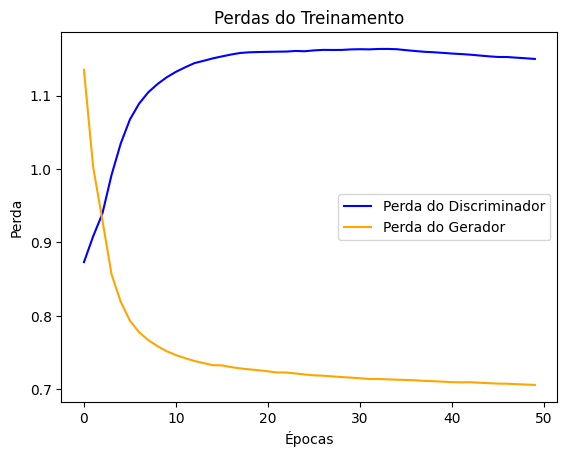

In [ ]:

import json
from google.colab import drive

# Montar o Google Drive
drive.mount('/content/drive')

loss_data_path = '/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/Loss_salvo_DCGAM/30_01_2025_img_rps_c1_lr_0_00001_50_loss_data.json'


# Lê os dados do arquivo JSON
with open(loss_data_path, 'r') as f:
    loss_data = json.load(f)

d_loss_ = loss_data['d_loss_']
g_loss_ = loss_data['g_loss_']


printLosses(d_loss_, g_loss_, save=True)
## EXPLICAR COMO É ESSA EPOCA NA DCGAN?

##4.6 - Grafico das imagens RPS simuladas do trainloader usando TSNE

##4.7 - Grafico das imagens RPS simuladas do testloader

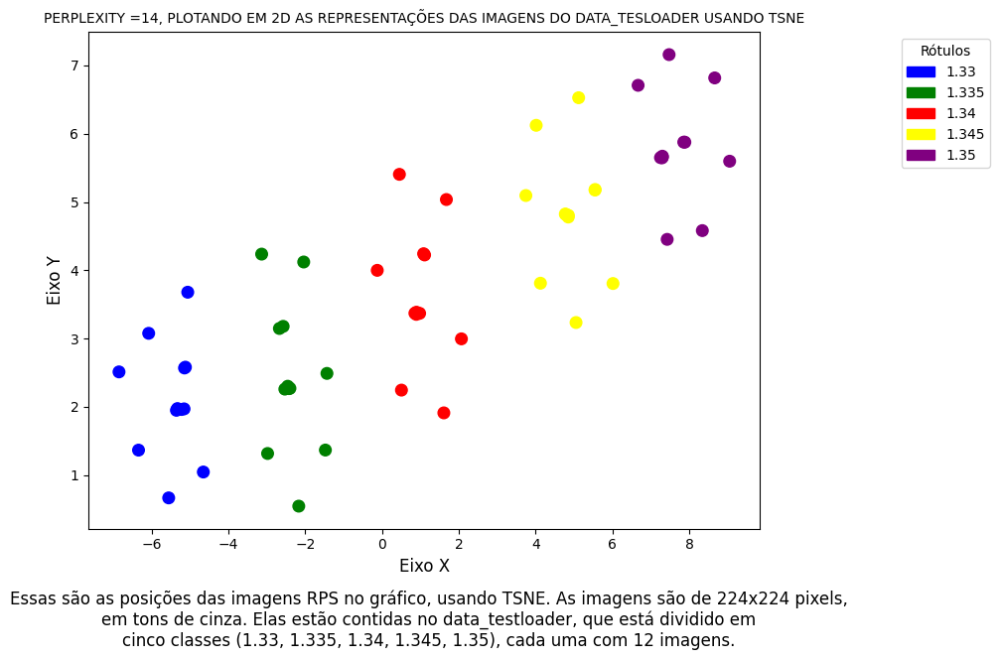

In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from sklearn.manifold import TSNE

# Inicializar listas
images_2 = []
labels_2 = []
image_names_2 = []

# Carregar dados do dataset_testloader
for image, label, image_name in dataset_testloader:
    images_2.append(image.numpy())  # Converter para NumPy
    labels_2.append(label)
    image_names_2.append(image_name)



# Verificação dos tamanhos das imagens e conversão para 2D
images_2 = np.array([img_2.flatten() for img_2 in images_2])
# Aplicar t-SNE
perplexity = 14
tsne = TSNE(n_components=2, init='random',  random_state=0, perplexity = perplexity)
digits_proj = tsne.fit_transform(images_2)

# Definir cores
color_map = {0: 'blue', 1: 'green', 2: 'red', 3: 'yellow', 4: 'purple'}
label_colors = [color_map[int(label)] for label in labels_2]

# Criar patches para legenda

label_values = { 0: 1.33, 1: 1.335,2: 1.34,3: 1.345,4: 1.35}
# Criar patches para a legenda com os valores personalizados
legend_patches = [
    mpatches.Patch(color=color_map[label], label=f'{label_values[label]}')
    for label in color_map
]
# Plot
fig, ax = plt.subplots(figsize=(10, 6))
scatter = ax.scatter(x=digits_proj[:, 0], y=digits_proj[:, 1], c=label_colors, s=70)

ax.set_xlabel("Eixo X", fontsize=12)
ax.set_ylabel("Eixo Y", fontsize=12)
plt.legend(handles=legend_patches, title="Rótulos", bbox_to_anchor=(1.2, 1), loc='upper left')

plt.title(f"PERPLEXITY ={perplexity}, PLOTANDO EM 2D AS REPRESENTAÇÕES DAS IMAGENS DO DATA_TESLOADER USANDO TSNE", fontsize=10)
fig.text(0.4, -0.1,
   'Essas são as posições das imagens RPS no gráfico, usando TSNE. As imagens são de 224x224 pixels,\n'
   'em tons de cinza. Elas estão contidas no data_testloader, que está dividido em\n'
   'cinco classes (1.33, 1.335, 1.34, 1.345, 1.35), cada uma com 12 imagens.',
    #'Alem disso, foi selecionado um imagens de cada classe e sua posição Y E X',
    ha='center', va='bottom', fontsize=12)

plt.tight_layout(rect=[0, 0, 1.0, 1])
plt.show()

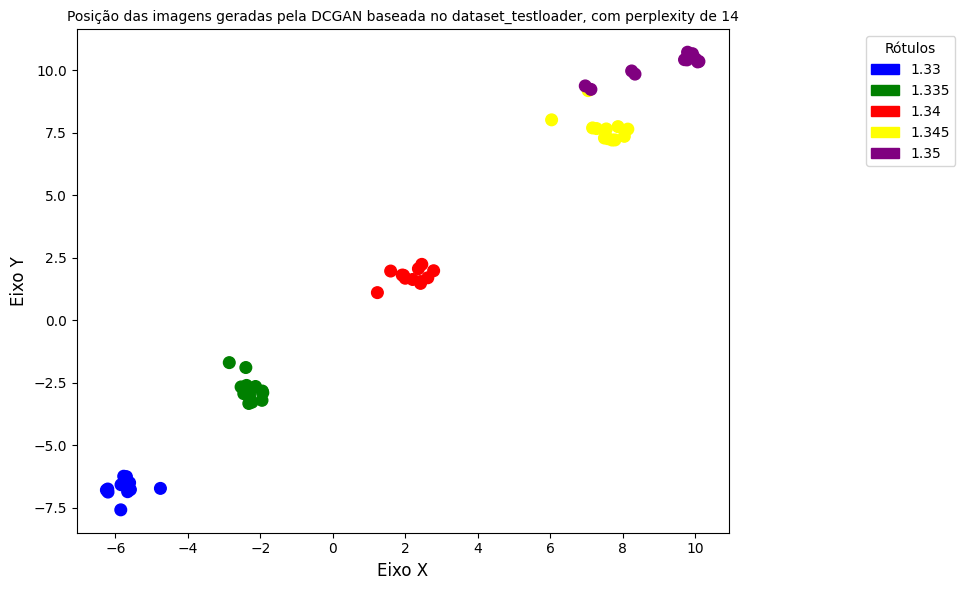

In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from sklearn.manifold import TSNE

# Inicializar listas
images_2 = []
labels_2 = []
image_names_2 = []

# Carregar dados do dataset_testloader
for image, label, image_name in dataset_DCGAN1:
    images_2.append(image.numpy())  # Converter para NumPy
    labels_2.append(label)
    image_names_2.append(image_name)



# Verificação dos tamanhos das imagens e conversão para 2D
images_2 = np.array([img_2.flatten() for img_2 in images_2])
# Aplicar t-SNE
perplexity = 14
tsne = TSNE(n_components=2, init='random',  random_state=0, perplexity = perplexity)
digits_proj = tsne.fit_transform(images_2)

# Definir cores
color_map = {0: 'blue', 1: 'green', 2: 'red', 3: 'yellow', 4: 'purple'}
label_colors = [color_map[int(label)] for label in labels_2]

# Criar patches para legenda

label_values = { 0: 1.33, 1: 1.335,2: 1.34,3: 1.345,4: 1.35}
# Criar patches para a legenda com os valores personalizados
legend_patches = [
    mpatches.Patch(color=color_map[label], label=f'{label_values[label]}')
    for label in color_map
]
# Plot
fig, ax = plt.subplots(figsize=(10, 6))
scatter = ax.scatter(x=digits_proj[:, 0], y=digits_proj[:, 1], c=label_colors, s=70)

ax.set_xlabel("Eixo X", fontsize=12)
ax.set_ylabel("Eixo Y", fontsize=12)
plt.legend(handles=legend_patches, title="Rótulos", bbox_to_anchor=(1.2, 1), loc='upper left')

plt.title(f"Posição das imagens geradas pela DCGAN baseada no dataset_testloader, com perplexity de {perplexity}", fontsize=10)


plt.tight_layout(rect=[0, 0, 1.0, 1])
plt.show()

In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from sklearn.manifold import TSNE

# Inicializar listas
images_2 = []
labels_2 = []
image_names_2 = []

# Carregar dados do dataset_testloader
for image, label, image_name in dataset_gerada_da_gerada_da_DCGAN1:
    images_2.append(image.numpy())  # Converter para NumPy
    labels_2.append(label)
    image_names_2.append(image_name)



# Verificação dos tamanhos das imagens e conversão para 2D
images_2 = np.array([img_2.flatten() for img_2 in images_2])
# Aplicar t-SNE
perplexity = 14
tsne = TSNE(n_components=2, init='random',  random_state=0, perplexity = perplexity)
digits_proj = tsne.fit_transform(images_2)

# Definir cores
color_map = {0: 'blue', 1: 'green', 2: 'red', 3: 'yellow', 4: 'purple'}
label_colors = [color_map[int(label)] for label in labels_2]

# Criar patches para legenda

label_values = { 0: 1.33, 1: 1.335,2: 1.34,3: 1.345,4: 1.35}
# Criar patches para a legenda com os valores personalizados
legend_patches = [
    mpatches.Patch(color=color_map[label], label=f'{label_values[label]}')
    for label in color_map
]
# Plot
fig, ax = plt.subplots(figsize=(10, 6))
scatter = ax.scatter(x=digits_proj[:, 0], y=digits_proj[:, 1], c=label_colors, s=70)

ax.set_xlabel("Eixo X", fontsize=12)
ax.set_ylabel("Eixo Y", fontsize=12)
plt.legend(handles=legend_patches, title="Rótulos", bbox_to_anchor=(1.2, 1), loc='upper left')

plt.title(f"Posição das imagens geradas pela DCGAN, baseadas em cópias sucessivas do dataset_testloader, com perplexidade de {perplexity}", fontsize=10)


plt.tight_layout(rect=[0, 0, 1.0, 1])
plt.show()

KeyboardInterrupt: 

## 4.8 - Função para visualizar imagens alvo e gerada de  cada classe

In [ ]:

caminho_arquivo1 = '/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/Lista_gerada_DCGAN/10_02_2025_dadosC1_50_epocas_12_Imagens_gerada_rps_cada_classe.pt'
resultados1 = torch.load(caminho_arquivo1, weights_only=False)
#############################################################################
caminho_arquivo2 = '/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/Lista_gerada_DCGAN/25_03_dados_originais_RPS_50_epocas.pt'
resultados2 = torch.load(caminho_arquivo2, weights_only=False)


def Visualizar_Image_criada(G, z_i, label, resultados1, resultados2, iterations, classe):
    imagens_alvo1 = []
    vetores_latentes1 = []
    img_gerada1 = []
    imagens_alvo2 = []
    vetores_latentes2 = []
    img_gerada2 = []

    # Processar resultados1
    for i in iterations:
        match = next((item for item in resultados1 if item['image_index'] == i and item['label'] == label), None)
        if match:
            imagens_alvo1.append(match['imagem_alvo'])
            vetores_latentes1.append(match['vetor_latente'])
            img_gerada1.append(match['imagem_gerada'])
        else:
            print(f"[Resultados1] Iteração {i} não encontrada ou label não corresponde. label: {label}, iteration: {i}")

    print(f'Imagens simulada do sensor SPR da classe {classe}. 1º conjunto')
    printImages1(imagens_alvo1)

    with torch.no_grad():
        G.eval()
        imagens_geradas1 = [G(z).cpu().numpy() for z in vetores_latentes1]

    print('Imagens geradas pela DCGAN, baseado nas imagens do primeiro conjunto. 2º conjunto')
    printImages1(imagens_geradas1)

    ######################################################################################################

    # Processar resultados2
    for i in iterations:
       # match = next((item for item in resultados2 if item['image_index'] == i and item['label'] == label), None)
        match = next((item for item in resultados2 if item['image_index'].replace("imagem_gerada_", "") == i and item['label'] == label), None)

        if match:
            imagens_alvo2.append(match['imagem_alvo'])
            vetores_latentes2.append(match['vetor_latente'])
            img_gerada2.append(match['imagem_gerada'])
        else:
            print(f"[Resultados2] Iteração {i} não encontrada ou label não corresponde. label: {label}, iteration: {i}")


    with torch.no_grad():
        G.eval()
        imagens_geradas2 = []
        imagens_geradas2 = [G(z).cpu().numpy() for z in vetores_latentes2]

    print('Imagens geradas pela DCGAN, baseado nas imagens do 2º conjunto.')
    printImages1(img_gerada2)


    import matplotlib.pyplot as plt
import numpy as np





In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch

def printImages1(imagens):
    plt.figure(figsize=(15, 5))
    for i, img in enumerate(imagens):
        if isinstance(img, np.ndarray):
            img = img.squeeze()
        elif isinstance(img, torch.Tensor):
            img = img.squeeze().cpu().numpy()
        else:
            continue  # Pula se não for tensor ou array
        plt.subplot(1, len(imagens), i + 1)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
    plt.tight_layout()
    plt.show()


def mostrar_latentes_como_imagens(vetores_latentes):
    plt.figure(figsize=(5, 5))
    for idx, z in enumerate(vetores_latentes):
        z_np = z.squeeze().cpu().numpy()
        tam = int(np.sqrt(z_np.size))
        z_img = z_np[:tam*tam].reshape(tam, tam)
        plt.subplot(1, len(vetores_latentes), idx + 1)
        plt.imshow(z_img, cmap='gray')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

def Visualizar_Image_TESTE(G, z_i, label, resultados1, iterations, classe):
    imagens_alvo1 = []
    vetores_latentes1 = []
    img_gerada1 = []

    for i in iterations:
        match = next((item for item in resultados1 if item['image_index'] == i and item['label'] == label), None)
        if match:
            imagens_alvo1.append(match['imagem_alvo'])
            vetores_latentes1.append(match['vetor_latente'])
            img_gerada1.append(match['imagem_gerada'])
        else:
            print(f"[Resultados1] Iteração {i} não encontrada ou label não corresponde. label: {label}, iteration: {i}")

    print(f'Imagens simulada do sensor SPR da classe {classe}. 1º conjunto')
    printImages1(imagens_alvo1)

    with torch.no_grad():
        G.eval()
        imagens_geradas1 = [G(z).cpu().numpy() for z in vetores_latentes1]

    print('Imagens geradas pela DCGAN, baseado nas imagens do primeiro conjunto. 2º conjunto')
    printImages1(imagens_geradas1)

    return vetores_latentes1




In [ ]:
Nomes_Img = ['2_c1_4_img_1.33_guassblur_2.jpg']
vetores = Visualizar_Image_TESTE(G, z_i, 0, resultados1, Nomes_Img, "1.33")

# Visualizar o primeiro vetor latente como imagem
mostrar_latentes_como_imagens([vetores[0]])


NameError: name 'Visualizar_Image_TESTE' is not defined

### 4.8.1 - Imagens da cada classe "1.33" ou "0"

Imagens simulada do sensor SPR da classe 1.33. 1º conjunto


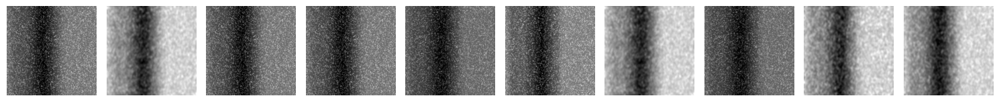

Imagens geradas pela DCGAN, baseado nas imagens do primeiro conjunto. 2º conjunto


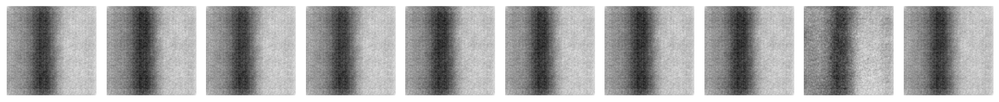

Imagens geradas pela DCGAN, baseado nas imagens do 2º conjunto.


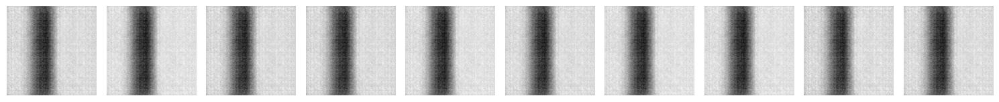

In [ ]:
Nomes_Img = [
    '2_c1_4_img_1.33_guassblur_2.jpg',
    '1_c1_4_img_1.33_guassblur_10.jpg',
    '2_c1_4_img_1.33_guassblur_2.jpg',
    '2_c1_4_img_1.33_guassblur_2.jpg',
    '12_c1_4_img_1.33_guassblur_2.jpg',
    '8_c1_4_img_1.33_guassblur_2.jpg',
    '1_c1_4_img_1.33_guassblur_10.jpg',
    '12_c1_4_img_1.33_guassblur_2.jpg',
    '5_c1_4_img_1.33_guassblur_10.jpg',
    '11_c1_4_img_1.33_guassblur_10.jpg'
]
Visualizar_Image_criada(G, z_i, 0, resultados1, resultados2, Nomes_Img, "1.33")

### 4.8.2 - Imagens da cada classe "1.335" ou "1"

Imagens simulada do sensor SPR da classe 1.335. 1º conjunto


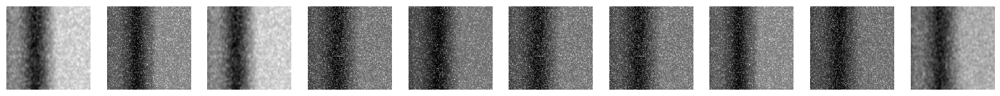

Imagens geradas pela DCGAN, baseado nas imagens do primeiro conjunto. 2º conjunto


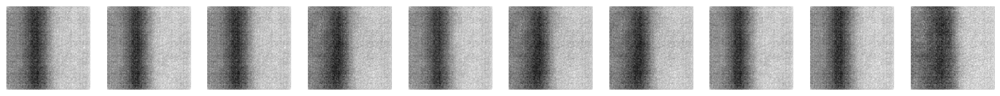

Imagens geradas pela DCGAN, baseado nas imagens do 2º conjunto.


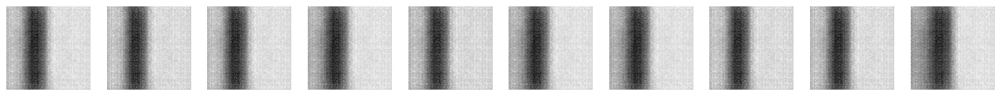

In [ ]:
Nomes_Img = [

'1_c1_4_img_1.335_guassblur_10.jpg',
'8_c1_4_img_1.335_guassblur_2.jpg',
'1_c1_4_img_1.335_guassblur_10.jpg',
'6_c1_4_img_1.335_guassblur_2.jpg',
'2_c1_4_img_1.335_guassblur_2.jpg',
'6_c1_4_img_1.335_guassblur_2.jpg',
'6_c1_4_img_1.335_guassblur_2.jpg',
'8_c1_4_img_1.335_guassblur_2.jpg',
'16_c1_4_img_1.335_guassblur_2.jpg',
'15_c1_4_img_1.335_guassblur_10.jpg',
]

Visualizar_Image_criada(G, z_i, 1,  resultados1, resultados2, Nomes_Img,"1.335")

### 4.8.3 - Imagens da cada classe "1.34" ou "2"

Imagens simulada do sensor SPR da classe 1.34. 1º conjunto


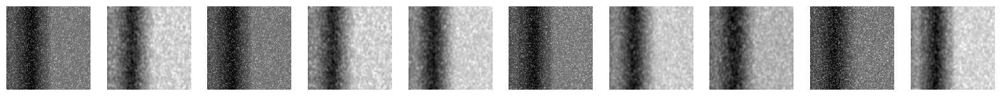

Imagens geradas pela DCGAN, baseado nas imagens do primeiro conjunto. 2º conjunto


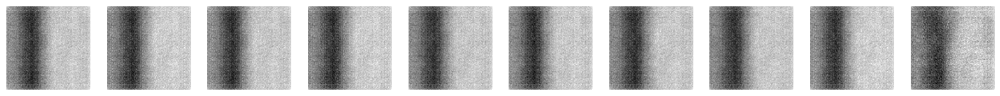

Imagens geradas pela DCGAN, baseado nas imagens do 2º conjunto.


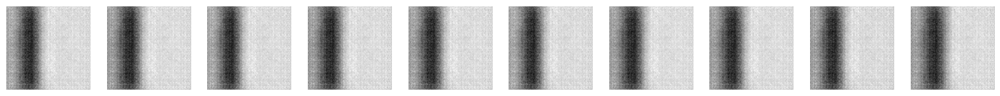

In [ ]:
Nomes_Img = [
              '8_c1_4_img_1.34_guassblur_2.jpg',
              '15_c1_4_img_1.34_guassblur_10.jpg',
              '8_c1_4_img_1.34_guassblur_2.jpg',
              '15_c1_4_img_1.34_guassblur_10.jpg',
              '1_c1_4_img_1.34_guassblur_10.jpg',
              '18_c1_4_img_1.34_guassblur_2.jpg',
              '11_c1_4_img_1.34_guassblur_10.jpg',
              '5_c1_4_img_1.34_guassblur_10.jpg',
              '6_c1_4_img_1.34_guassblur_2.jpg',
              '7_c1_4_img_1.34_guassblur_10.jpg',
]
Visualizar_Image_criada(G, z_i, 2,  resultados1, resultados2, Nomes_Img,"1.34")

### 4.8.4 - Imagens da cada classe "1.345" ou "3"

Imagens simulada do sensor SPR da classe 1.345. 1º conjunto


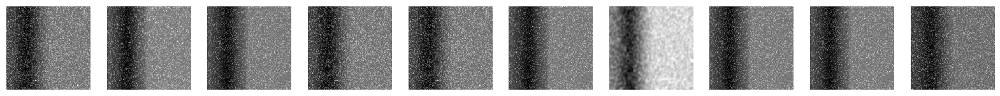

Imagens geradas pela DCGAN, baseado nas imagens do primeiro conjunto. 2º conjunto


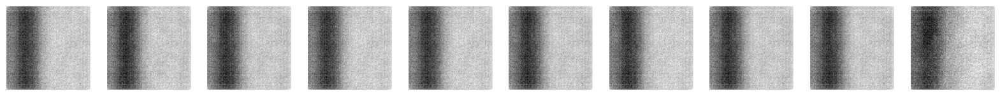

Imagens geradas pela DCGAN, baseado nas imagens do 2º conjunto.


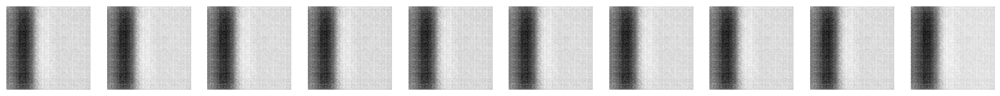

In [ ]:
Nomes_Img = [
              '16_c1_4_img_1.345_guassblur_2.jpg',
              '18_c1_4_img_1.345_guassblur_2.jpg',
              '8_c1_4_img_1.345_guassblur_2.jpg',
              '16_c1_4_img_1.345_guassblur_2.jpg',
              '16_c1_4_img_1.345_guassblur_2.jpg',
              '8_c1_4_img_1.345_guassblur_2.jpg',
              '15_c1_4_img_1.345_guassblur_10.jpg',
              '8_c1_4_img_1.345_guassblur_2.jpg',
              '8_c1_4_img_1.345_guassblur_2.jpg',
              '6_c1_4_img_1.345_guassblur_2.jpg',
]
Visualizar_Image_criada(G, z_i, 3,  resultados1, resultados2, Nomes_Img, "1.345")

### 4.8.5 - Imagens da cada classe "1.35" ou "4"

Imagens simulada do sensor SPR da classe 1.35. 1º conjunto


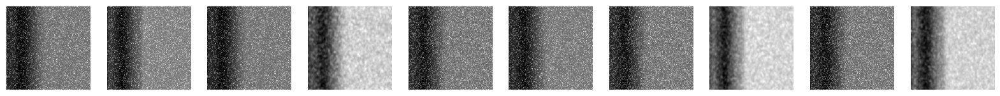

Imagens geradas pela DCGAN, baseado nas imagens do primeiro conjunto. 2º conjunto


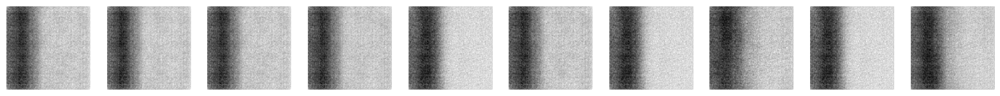

Imagens geradas pela DCGAN, baseado nas imagens do 2º conjunto.


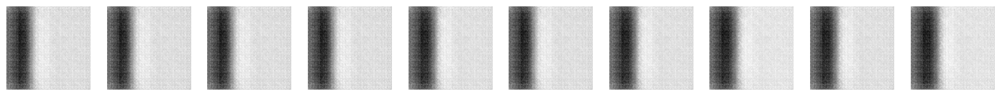

In [ ]:
Nomes_Img = [
            '2_c1_4_img_1.35_guassblur_2.jpg',
            '18_c1_4_img_1.35_guassblur_2.jpg',
            '2_c1_4_img_1.35_guassblur_2.jpg',
            '5_c1_4_img_1.35_guassblur_10.jpg',
            '6_c1_4_img_1.35_guassblur_2.jpg',
            '12_c1_4_img_1.35_guassblur_2.jpg',
            '6_c1_4_img_1.35_guassblur_2.jpg',
            '17_c1_4_img_1.35_guassblur_10.jpg',
            '6_c1_4_img_1.35_guassblur_2.jpg',
            '7_c1_4_img_1.35_guassblur_10.jpg',
            ]
Visualizar_Image_criada(G, z_i, 4,  resultados1, resultados2, Nomes_Img, "1.35")

## 4.9 - Grafico representando as imagens Gerada pela DCGAN usando TSNE

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


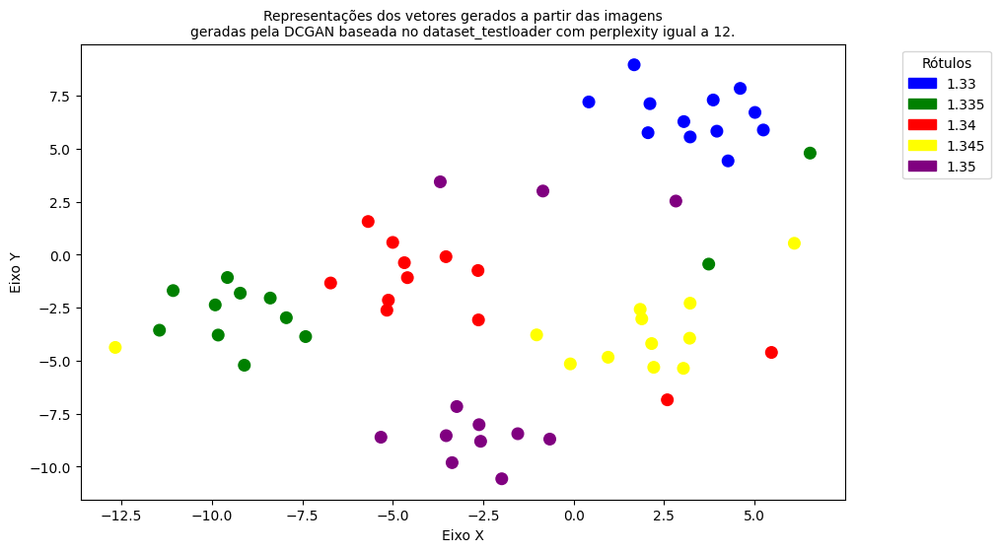

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from sklearn.manifold import TSNE
from google.colab import drive

drive.mount('/content/drive')

# Carregar dados
caminho_arquivo = '/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/Lista_gerada_DCGAN/10_02_2025_dadosC1_50_epocas_12_Imagens_gerada_rps_cada_classe.pt'
dados = torch.load(caminho_arquivo, weights_only=False)

# Extrair rótulos e vetores latentes
labels = np.array([item['label'] for item in dados])
vetores_latentes = np.array([item['vetor_latente'].flatten() for item in dados])

# Aplicar t-SNE
perplexity=12
tsne = TSNE(n_components=2, init='random', random_state=0, perplexity=perplexity)
projecao = tsne.fit_transform(vetores_latentes)

# Definir cores e legenda
valores_rotulos = {0: 1.33, 1: 1.335, 2: 1.34, 3: 1.345, 4: 1.35}
cores = ['blue', 'green', 'red', 'yellow', 'purple']
color_map = dict(zip(valores_rotulos.keys(), cores))
legend_patches = [mpatches.Patch(color=c, label=str(v)) for v, c in zip(valores_rotulos.values(), cores)]

# Criar o gráfico
fig, ax = plt.subplots(figsize=(10, 6))
ax.scatter(projecao[:, 0], projecao[:, 1], c=[color_map[l] for l in labels], s=70)

# Ao lado do grafico
plt.legend(handles=legend_patches, title="Rótulos", bbox_to_anchor=(1.2, 1))
ax.set_xlabel("Eixo X"), ax.set_ylabel("Eixo Y")

ax.set_title("Representações dos vetores gerados a partir das imagens\n"
             "geradas pela DCGAN baseada no dataset_testloader com "
             f"perplexity igual a {perplexity}.", fontsize=10)  # Subtítulo com 3 linhas

plt.show()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


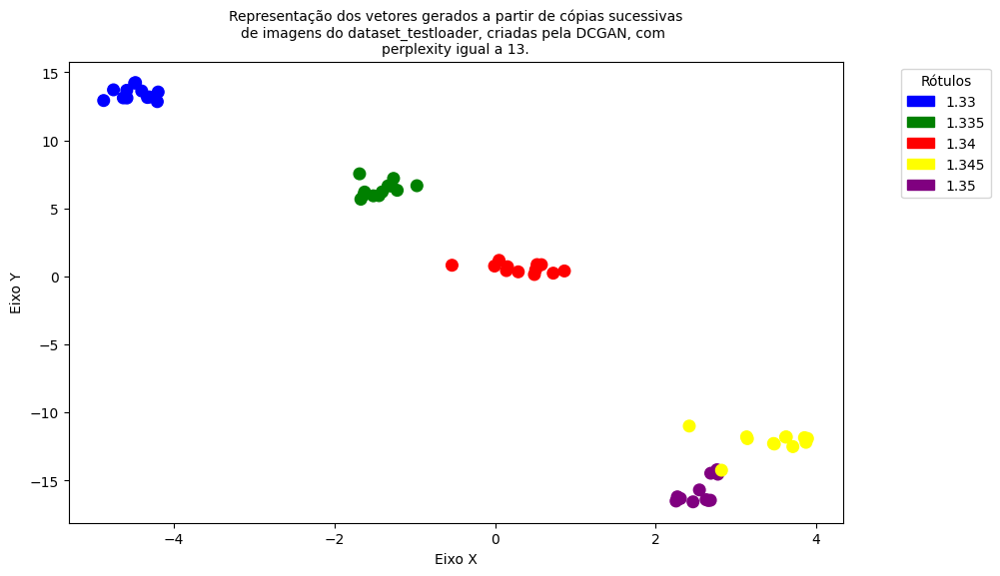

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from sklearn.manifold import TSNE
from google.colab import drive

drive.mount('/content/drive')

# Carregar dados
caminho_arquivo = '/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/Lista_gerada_DCGAN/25_03_dados_originais_RPS_50_epocas.pt'
dados = torch.load(caminho_arquivo, weights_only=False)

# Extrair rótulos e vetores latentes
labels = np.array([item['label'] for item in dados])
vetores_latentes = np.array([item['vetor_latente'].flatten() for item in dados])

# Aplicar t-SNE
perplexity=13
tsne = TSNE(n_components=2, init='random', random_state=0, perplexity=perplexity)
projecao = tsne.fit_transform(vetores_latentes)

# Definir cores e legenda
valores_rotulos = {0: 1.33, 1: 1.335, 2: 1.34, 3: 1.345, 4: 1.35}
cores = ['blue', 'green', 'red', 'yellow', 'purple']
color_map = dict(zip(valores_rotulos.keys(), cores))
legend_patches = [mpatches.Patch(color=c, label=str(v)) for v, c in zip(valores_rotulos.values(), cores)]

# Criar o gráfico
fig, ax = plt.subplots(figsize=(10, 6))
ax.scatter(projecao[:, 0], projecao[:, 1], c=[color_map[l] for l in labels], s=70)

# Ao lado do grafico
plt.legend(handles=legend_patches, title="Rótulos", bbox_to_anchor=(1.2, 1))
ax.set_xlabel("Eixo X"), ax.set_ylabel("Eixo Y")

ax.set_title("Representação dos vetores gerados a partir de cópias sucessivas\n"
             "de imagens do dataset_testloader, criadas pela DCGAN, com \n"
             f"perplexity igual a {perplexity}.", fontsize=10)  # Subtítulo com 3 linhas

plt.show()

## 4.10 - Grafico das imagens Gerada pela DCGAN usando TSNE

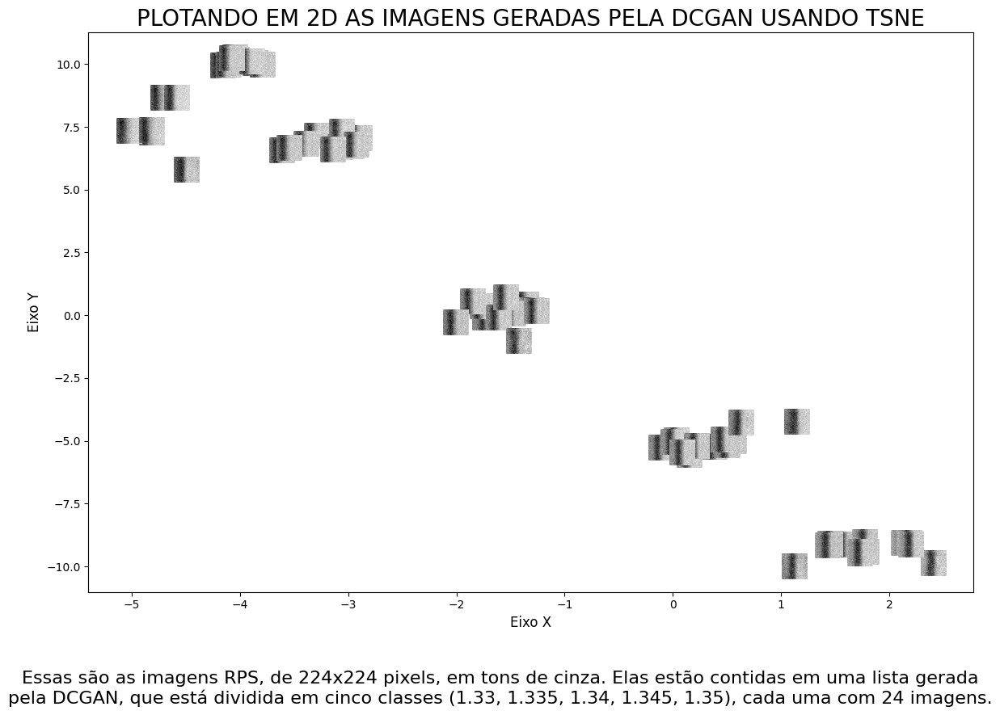

In [ ]:
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
import numpy as np
import torch
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

# Inicializar listas
images_4 = []
labels_4 = []
image_names_4 = []

# Carregar dados do dataset_DCGAN1
for image, label, image_name in dataset_DCGAN1:
    images_4.append(image.numpy())  # Converter para NumPy
    labels_4.append(label)
    image_names_4.append(image_name)

# Verificação dos tamanhos das imagens e conversão para 2D (flatten)
images_4_flat = np.array([img.flatten() for img in images_4])  # Corrigido para usar images_4

# Aplicar t-SNE
perplexity = 15
tsne = TSNE(n_components=2, init='pca', random_state=0, perplexity=perplexity)
digits_proj = tsne.fit_transform(images_4_flat)

# Função auxiliar para inserir imagens nos pontos
def imscatter(x, y, image, ax=None, zoom=1.0):
    if ax is None:
        ax = plt.gca()
    imagebox = OffsetImage(image, zoom=zoom, cmap='gray')
    ab = AnnotationBbox(imagebox, (x, y), frameon=False)
    ax.add_artist(ab)

# Visualizar os dados reduzidos com imagens nos pontos
fig, ax = plt.subplots(figsize=(12, 8))

# Plotar cada imagem nos pontos correspondentes
for i in range(len(digits_proj)):
    img = images_4[i].reshape(224, 224)  # Assumindo que as imagens são 224x224
    imscatter(digits_proj[i, 0], digits_proj[i, 1], img, ax=ax, zoom=0.1)

# Ajustes do gráfico
ax.update_datalim(digits_proj)
ax.autoscale()
ax.set_xlabel("Eixo X", fontsize=12)
ax.set_ylabel("Eixo Y", fontsize=12)
plt.title("PLOTANDO EM 2D AS IMAGENS GERADAS PELA DCGAN USANDO TSNE", fontsize=20)
fig.text(
    0.5, -0.1,
    'Essas são as imagens RPS, de 224x224 pixels, em tons de cinza. Elas estão contidas em uma lista gerada\n'
    'pela DCGAN, que está dividida em cinco classes (1.33, 1.335, 1.34, 1.345, 1.35), cada uma com 24 imagens.',
    ha='center', va='bottom', fontsize=16
)

# Ajustar layout
plt.tight_layout()
plt.show()


## 4.11 - Grafico representando duas imagens Gerada pela DCGAN usando TSNE

In [ ]:
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches  # Import necessário para criar legendas
from google.colab import drive
drive.mount('/content/drive')
caminho_arquivo_5 = '/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/Lista_gerada_DCGAN/10_02_2025_dadosC1_50_epocas_12_Imagens_gerada_rps_cada_classe.pt'
loaded_generated_images_list_5 = torch.load(caminho_arquivo_5, weights_only=False)
# Acessar todas do arquivo

labels_5 = [item['label'] for item in loaded_generated_images_list_5]
imagem_gerada_5 = [item['imagem_gerada'] for item in loaded_generated_images_list_5]
image_names_5 = [item['image_index'] for item in loaded_generated_images_list_5]  # Adicionando nomes das imagens
# Verificação dos tamanhos das imagens e conversão para 2D
imagens_5 = np.array([img.flatten() for img in imagem_gerada_5])

# Aplicar t-SNE
perplexity = 12
tsne = TSNE(n_components=2, init='random',  random_state=0, perplexity = perplexity)
digits_proj = tsne.fit_transform(imagens_5)
######################3333
# Definir cores personalizadas para cada rótulo
color_map = {0: 'blue',1: 'green',2: 'red',3: 'yellow',4: 'purple'}
# Cores associadas a cada rótulo
#label_colors = [color_map[label] for label in labels]
label_colors = [color_map[int(label)] for label in labels_5]
# Criar patches para a legenda
legend_patches = [
    mpatches.Patch(color=color_map[label], label=f'Classe {label}') for label in np.unique(labels_5)
]
# Imagem a ser destacada
##################### classe 4 a 0 #######################
# Definir quais imagens serão destacadas
destacar_nomes = ["6_c1_4_img_1.35_guassblur_2.jpg", "11_c1_4_img_1.33_guassblur_10.jpg"]
x_vals = []  # Para armazenar os valores de x
y_vals = []  # Para armazenar os valores de y

# Criar figura principal
fig, ax = plt.subplots(figsize=(12, 7))

# Adicionar as imagens com transparência para as não destacadas
for i, (x, y) in enumerate(digits_proj):
    nome_imagem = image_names_5[i]  # Ou qualquer outra forma de obter o nome da imagem
    if nome_imagem in destacar_nomes:
        # Imagem destacada - opaca
        ax.scatter(x, y, c=[label_colors[i]], s=70, alpha=1)
    else:
        # Outras imagens - transparentes
        ax.scatter(x, y, c=[label_colors[i]], s=70, alpha=0.0)  # Defina alpha=0.1 para torná-las transparentes

# Destacar as imagens específicas e exibir coordenadas (x, y)
for i, destacar_nome in enumerate(destacar_nomes):
    if destacar_nome in image_names_5:
        indice_destacar = list(image_names_5).index(destacar_nome)
        x_destacar, y_destacar = digits_proj[indice_destacar]

        # Armazenando os valores de x e y para cada imagem destacada
        x_vals.append(x_destacar)
        y_vals.append(y_destacar)

        # Usando 's' para definir o tamanho e 'marker' para a borda quadrada
        ##ax.scatter(x_destacar, y_destacar, facecolors='none', edgecolors='red', s=900, linewidths=5, marker='s', label="Imagem Destacada")

        if destacar_nome == "6_c1_4_img_1.35_guassblur_2.jpg":
             ax.text(x_destacar, y_destacar - 0.5, f"{destacar_nome}\n x = {x_destacar:.2f}\n y = {y_destacar:.2f}", fontsize=14, ha='right', va='top', color='black')
            # ax.scatter(x_destacar, y_destacar, facecolors='none', edgecolors='purple', s=1200, linewidths=5, marker='s', label="Imagem Destacada")
        elif destacar_nome == "11_c1_4_img_1.33_guassblur_10.jpg":
            # ax.scatter(x_destacar, y_destacar, facecolors='none', edgecolors='blue', s=1200, linewidths=5, marker='s', label="Imagem Destacada")
             ax.text(x_destacar, y_destacar + 0.7, f"{destacar_nome}\n x = {x_destacar:.2f}\n y = {y_destacar:.2f}", fontsize=14, ha='left', va='bottom', color='black')


# Criar patches para a legenda
unique_labels = np.unique(labels_5)
legend_patches = [mpatches.Patch(color=color_map[label], label=f'Rótulo {label}') for label in unique_labels]
# Criar um dicionário com os valores associados aos rótulos
label_values = {0: 1.33,1: 1.335,2: 1.34,3: 1.345,4: 1.35}
# Criar patches para a legenda com os valores personalizados
legend_patches = [
    mpatches.Patch(color=color_map[label], label=f'{label_values[label]}')
    for label in unique_labels
]

# Adicionar a legenda ao lado do gráfico
plt.legend(handles=legend_patches, title="Rótulos", bbox_to_anchor=(1.2, 1), loc='upper left', borderaxespad=0.)

# Ajustar layout para que o gráfico e a legenda não se sobreponham
plt.tight_layout(rect=[0, 0, 1.0, 1])

# Adicionar rótulos para os eixos X e Y
ax.set_xlabel("Eixo X", fontsize=12)
ax.set_ylabel("Eixo Y", fontsize=12)

fig.text(0.4, -0.1,  # Ajuste o valor Y conforme necessário
   'Essas são as representações das imagens RPS gerada pela DCGAN, de 224x224 pixels, em tons de cinza.\n'
   'Elas estão contidas em uma lista que tem iteration(id), imagem_alvo, vetor_latente, imagem_gerada.\n'
   'As imagens estão divididas em cinco classes (1.33, 1.335, 1.34, 1.345, 1.35), cada uma com 12 imagens.',
    ha='center', va='bottom', fontsize=12)

# Exibir o gráfico
plt.show()


## 4.12 - Grafico de duas imagens Gerada pela DCGAN usando TSNE

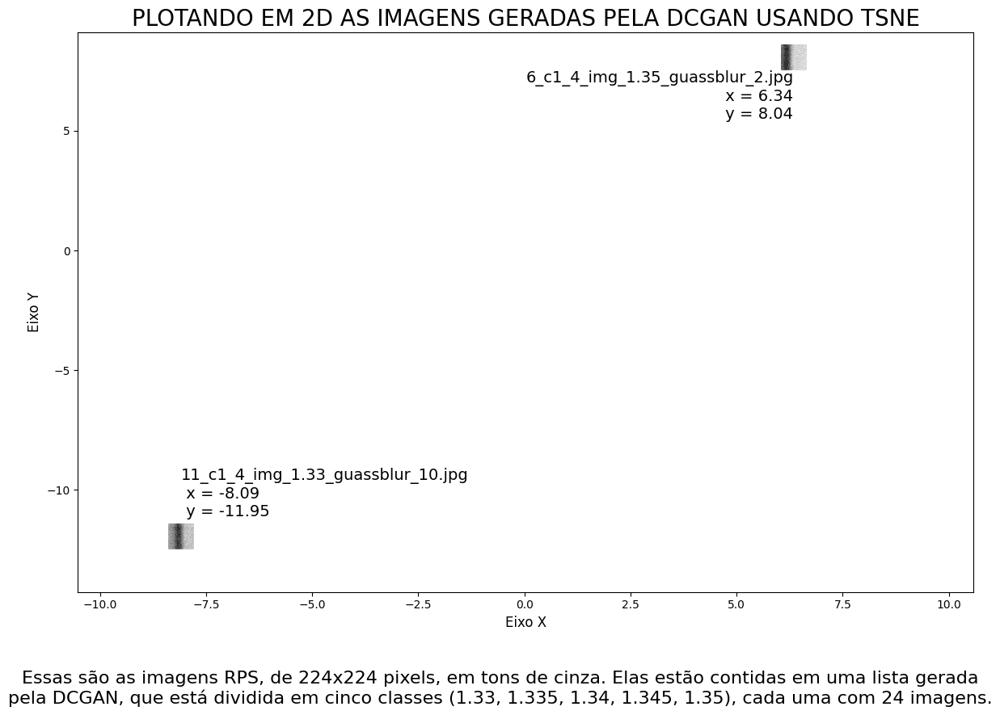

In [ ]:
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
import numpy as np
import torch
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

# Carregar a lista de imagens geradas
caminho_arquivo_6 = '/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/Lista_gerada_DCGAN/10_02_2025_dadosC1_50_epocas_12_Imagens_gerada_rps_cada_classe.pt'
loaded_generated_images_list_6 = torch.load(caminho_arquivo_6, weights_only=False)

# Acessar todas do arquivo
labels_6 = [item['label'] for item in loaded_generated_images_list_6]
imagem_gerada_6 = [item['imagem_gerada'] for item in loaded_generated_images_list_6]
image_names_6 = [item['image_index'] for item in loaded_generated_images_list_6]  # Adicionando nomes das imagens


# Verificação dos tamanhos das imagens e conversão para 2D
images_6 = np.array([img_6.flatten() for img_6 in imagem_gerada_6])
# Aplicar t-SNE
perplexity = 12
tsne = TSNE(n_components=2, init='random',  random_state=0, perplexity = perplexity)
digits_proj = tsne.fit_transform(images_6)

# Função auxiliar para inserir imagens nos pontos
def imscatter(x, y, image, ax=None, zoom=1.0, alpha=1.0):
    if ax is None:
        ax = plt.gca()
    imagebox = OffsetImage(image, zoom=zoom, cmap='gray', alpha=alpha)  # Adicionando alpha para transparência
    ab = AnnotationBbox(imagebox, (x, y), frameon=False)
    ax.add_artist(ab)

# Lista de imagens a serem destacadas
destacar_nomes = ["6_c1_4_img_1.35_guassblur_2.jpg", "11_c1_4_img_1.33_guassblur_10.jpg"]

# Criando figura
fig, ax = plt.subplots(figsize=(12, 8))

# Definindo cores para os rótulos
label_colors = plt.cm.jet(np.linspace(0, 1, len(labels_6)))  # Gerando cores baseadas no número de labels

# Plotando cada ponto, destacando apenas as imagens selecionadas
for i, (x, y) in enumerate(digits_proj):
    nome_imagem = image_names_6[i]  # Nome da imagem atual
    img = imagem_gerada_6[i].reshape(224, 224)  # Transformar em 224x224

    if nome_imagem in destacar_nomes:
        # Imagem destacada - opaca
        ax.scatter(x, y, c=[label_colors[i]], s=70, alpha=1)
        imscatter(x, y, img, ax=ax, zoom=0.1, alpha=1.0)  # Opacidade total
    else:
        # Outras imagens - transparentes
        ax.scatter(x, y, c=[label_colors[i]], s=70, alpha=0.0)  # Tornar ponto invisível
        imscatter(x, y, img, ax=ax, zoom=0.1, alpha=0.0)  # Imagem quase invisível

# Destacar os pontos das imagens selecionadas com um quadrado vermelho
for destacar_nome in destacar_nomes:
    if destacar_nome in image_names_6:
        indice_destacar = image_names_6.index(destacar_nome)
        x_destacar, y_destacar = digits_proj[indice_destacar]

        if destacar_nome == "6_c1_4_img_1.35_guassblur_2.jpg":
             ax.text(x_destacar, y_destacar - 0.5, f"{destacar_nome}\n x = {x_destacar:.2f}\n y = {y_destacar:.2f}", fontsize=14, ha='right', va='top', color='black')

        elif destacar_nome == "11_c1_4_img_1.33_guassblur_10.jpg":
             ax.text(x_destacar, y_destacar + 0.7, f"{destacar_nome}\n x = {x_destacar:.2f}\n y = {y_destacar:.2f}", fontsize=14, ha='left', va='bottom', color='black')

# Configuração do gráfico
ax.update_datalim(digits_proj)
ax.autoscale()
ax.set_xlabel("Eixo X", fontsize=12)
ax.set_ylabel("Eixo Y", fontsize=12)
plt.title("PLOTANDO EM 2D AS IMAGENS GERADAS PELA DCGAN USANDO TSNE", fontsize=20)

# Texto explicativo abaixo do gráfico
fig.text(0.5, -0.1,  # Ajuste o valor Y conforme necessário
   'Essas são as imagens RPS, de 224x224 pixels, em tons de cinza. Elas estão contidas em uma lista gerada\n'
   'pela DCGAN, que está dividida em cinco classes (1.33, 1.335, 1.34, 1.345, 1.35), cada uma com 24 imagens.',
    ha='center', va='bottom', fontsize=16)

# Ajustar layout para garantir que todas as imagens sejam exibidas corretamente
plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import torch
import math

def printImages2(images):
    num_images = len(images)
    rows = math.ceil(num_images / 10)  # Calcula o número mínimo de linhas necessárias
    cols = 10  # Mantém 10 colunas fixas

    fig, axes = plt.subplots(rows, cols, figsize=(10, rows))  # Ajusta a altura dinamicamente
    axes = axes.flatten()  # Achata a matriz de eixos para fácil indexação

    for i, img in enumerate(images):
        img_array = img.squeeze()  # Remove dimensões extras

        if isinstance(img_array, torch.Tensor):
            img_array = img_array.cpu().numpy()  # Converte para NumPy array se necessário

        # Certifique-se de que a imagem esteja no formato correto (28x28 para MNIST)
        if img_array.ndim == 3 and img_array.shape[0] == 1:
            img_array = img_array[0]  # Remove o canal se for único

        if img_array.ndim == 2:
            axes[i].imshow(img_array, cmap='gray', interpolation='nearest')
            axes[i].axis('off')  # Esconde os eixos para visualização limpa
        else:
            raise ValueError(f"Imagem tem formato inesperado: {img_array.shape}")

    # Desativar subplots extras
    for j in range(num_images, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()


In [ ]:
import matplotlib.pyplot as plt
import torch

def printImages3(images):
    num_images = len(images)

    plt.figure(figsize=(5, num_images * 2))  # Define o tamanho da figura

    for i, img in enumerate(images):
        img_array = img.squeeze()  # Remove dimensões extras

        if isinstance(img_array, torch.Tensor):
            img_array = img_array.cpu().numpy()  # Converte para NumPy se necessário

        if img_array.ndim == 3 and img_array.shape[0] == 1:
            img_array = img_array[0]

        plt.subplot(num_images, 1, i + 1)  # Define posição da imagem (linha, coluna, índice)
        plt.imshow(img_array, cmap='gray', interpolation='nearest')
        plt.axis('off')

    plt.tight_layout()
    plt.show()


## 4.13 -  Interpolação de duas imagens

### 4.13.1 - Gera lista de 60 vetores interpolados

In [ ]:
def trancisao(G, z_i, busca_vetor1_carregado, img_alvo1, maxEpochs= maxEpochs, patience=5):
    z = busca_vetor1_carregado.clone().detach().requires_grad_(True)
    z_optimizer1 = optim.Adam([z], lr=0.01)
    criterion1 = nn.MSELoss(reduction='sum')# metrica de avaliação na comparação entres as imagens gerada e alvo
    z_optimizer1.zero_grad()
    last_loss1 = 10000
    no_change1 = 0
    resultados = []  # Lista para armazenar dados
    for epoch in range(maxEpochs + 1):
        generated_image1 = G(z)
        loss = criterion1(generated_image1, img_alvo1)
        loss.backward()
        z_optimizer1.step()
        z_optimizer1.zero_grad()

        if epoch % 1 == 0:
            img = generated_image1.squeeze().detach().cpu().numpy()
            resultados.append({'id': epoch+1, 'imagem_gerada': img, 'vetor_latente': z.clone().detach()})
            plt.figure(figsize=(2, 2))
            plt.imshow(img, cmap='gray')
            plt.title(f'Epoch {epoch}')
            plt.axis('off')
            plt.show()

        if last_loss1 - loss.item() < 0:
            no_change1 += 1
        else:
            no_change1 = 0
        if no_change1 >= patience:
            break
        last_loss1 = loss.item()

    return resultados  # Retorna todas as imagens e vetores latentes salvos




### 4.13.2 - Gera lista de 60 imagens interpoladas

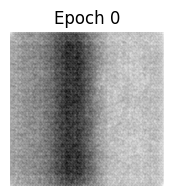

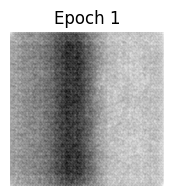

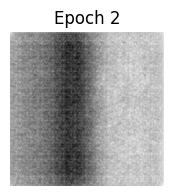

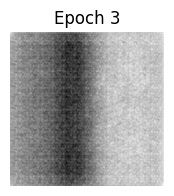

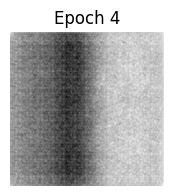

...

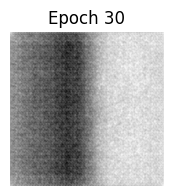

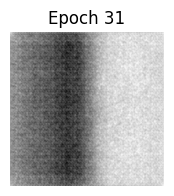

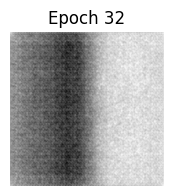

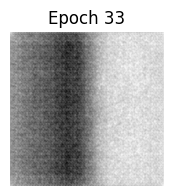

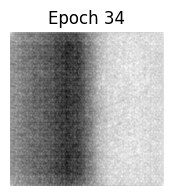

Imagens originais


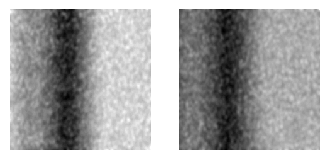

Primeiro e a Ultima Imgens interpolada


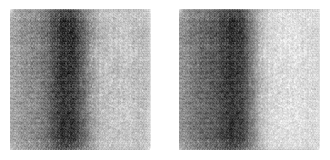

In [ ]:

caminho_arquivo = '/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/Lista_gerada_DCGAN/10_02_2025_dadosC1_50_epocas_12_Imagens_gerada_rps_cada_classe.pt'
dados_carregados = torch.load(caminho_arquivo,  weights_only=False)
############# CLASSE 0 ###############

#1_c1_4_img_1.33_guassblur_10.jpg ==0k
#2_c1_4_img_1.33_guassblur_2.jpg ==
#5_c1_4_img_1.33_guassblur_10.jpg == errado
#6_c1_4_img_1.33_guassblur_2.jpg ==  melhor imagem
#7_c1_4_img_1.33_guassblur_10.jpg
#8_c1_4_img_1.33_guassblur_2.jpg
#11_c1_4_img_1.33_guassblur_10.jpg = ok
#12_c1_4_img_1.33_guassblur_2.jpg
#15_c1_4_img_1.33_guassblur_10.jpg
#16_c1_4_img_1.33_guassblur_2.jpg
#17_c1_4_img_1.33_guassblur_10.jpg
#18_c1_4_img_1.33_guassblur_2.jpg

############# CLASSE 1 ###############

#1_c1_4_img_1.335_guassblur_10.jpg
#2_c1_4_img_1.335_guassblur_2.jpg
#5_c1_4_img_1.335_guassblur_10.jpg
#7_c1_4_img_1.335_guassblur_10.jpg
#8_c1_4_img_1.335_guassblur_2.jpg
#11_c1_4_img_1.335_guassblur_10.jpg
#12_c1_4_img_1.335_guassblur_2.jpg
#15_c1_4_img_1.335_guassblur_10.jpg
#16_c1_4_img_1.335_guassblur_2.jpg
#17_c1_4_img_1.335_guassblur_10.jpg
#18_c1_4_img_1.335_guassblur_2.jpg
#36_c1_4_img_1.335_guassblur_2.jpg
############# CLASSE 2 ###############

#1_c1_4_img_1.34_guassblur_10.jpg
#2_c1_4_img_1.34_guassblur_2.jpg
#5_c1_4_img_1.34_guassblur_10.jpg
#6_c1_4_img_1.34_guassblur_2.jpg
#7_c1_4_img_1.34_guassblur_10.jpg
#8_c1_4_img_1.34_guassblur_2.jpg
#11_c1_4_img_1.34_guassblur_10.jpg
#12_c1_4_img_1.34_guassblur_2.jpg
#15_c1_4_img_1.34_guassblur_10.jpg
#16_c1_4_img_1.34_guassblur_2.jpg
#17_c1_4_img_1.34_guassblur_10.jpg
#18_c1_4_img_1.34_guassblur_2.jpg
############# CLASSE 3 ###############
#11_c1_4_img_1.345_guassblur_10.jpg
#12_c1_4_img_1.345_guassblur_2.jpg
#15_c1_4_img_1.345_guassblur_10.jpg
#16_c1_4_img_1.345_guassblur_2.jpg
#17_c1_4_img_1.345_guassblur_10.jpg
#18_c1_4_img_1.345_guassblur_2.jpg
#1_c1_4_img_1.345_guassblur_10.jpg
#2_c1_4_img_1.345_guassblur_2.jpg
#5_c1_4_img_1.345_guassblur_10.jpg
#6_c1_4_img_1.345_guassblur_2.jpg
#7_c1_4_img_1.345_guassblur_10.jpg
#8_c1_4_img_1.345_guassblur_2.jpg

############# CLASSE 4 ###############
#1_c1_4_img_1.35_guassblur_10.jpg ==
#2_c1_4_img_1.35_guassblur_2.jpg ==
#5_c1_4_img_1.35_guassblur_10.jpg ==
#6_c1_4_img_1.35_guassblur_2.jpg ==
#7_c1_4_img_1.35_guassblur_10.jpg ==
#8_c1_4_img_1.35_guassblur_2.jpg ==
#11_c1_4_img_1.35_guassblur_10.jpg == melhor imagem
#12_c1_4_img_1.35_guassblur_2.jpg ==
#15_c1_4_img_1.35_guassblur_10.jpg ==
#16_c1_4_img_1.35_guassblur_2.jpg ==
#17_c1_4_img_1.35_guassblur_10.jpg ==
#18_c1_4_img_1.35_guassblur_2.jpg

##################### classe 4 a 0 #######################
nome_img_1 = "1_c1_4_img_1.33_guassblur_10.jpg"# classe 4
nome_img_2 = "15_c1_4_img_1.335_guassblur_10.jpg"# classe 0
###################### classe 4 a 1 #######################
#nome_img_1 = "1_c1_4_img_1.335_guassblur_10.jpg"# classe 4
#nome_img_2 = "2_c1_4_img_1.34_guassblur_2.jpg"# classe 1
###################### ok #######################
#nome_img_1 = "11_c1_4_img_1.34_guassblur_10.jpg"# classe 4
#nome_img_2 = "11_c1_4_img_1.345_guassblur_10.jpg"# classe 2
###################### classe 4 a 3 #######################
#nome_img_1 = "6_c1_4_img_1.35_guassblur_2.jpg"# classe 4
#nome_img_2 = "1_c1_4_img_1.345_guassblur_10.jpg"# classe 3


img_alvo1, img_gerada1, vetor1 = next(
    ((item['imagem_alvo'], item['imagem_gerada'], item['vetor_latente'])
    for item in dados_carregados
    if item['image_index'] == nome_img_1)
)
img_gerada1 = torch.from_numpy(img_gerada1)  # Converte o array NumPy para Tensor
############################################################################################

img_alvo2, img_gerada2, vetor2 = next(
    ((item['imagem_alvo'], item['imagem_gerada'], item['vetor_latente'])
    for item in dados_carregados
    if item['image_index'] == nome_img_2)
)
img_gerada2 = torch.from_numpy(img_gerada2)  # Converte o array NumPy para Tensor

############################################################################################
lista_interpolada = interpolacao(G, z_i, vetor1, img_gerada2, maxEpochs=120)


caminho_salvar = "/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/60_img_continuar_133_1335_.pt"
#caminho_salvar = "/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/60_img_continuar_1335_134_.pt"#0k
#caminho_salvar = "/content/drive/My Drive/mestrado_16_03_2024/224X224_14_04_2025/60_img_continuar_134_1345_.pt"#ok

torch.save(lista_interpolada, caminho_salvar)

print('Imagens originais')
printImages1([ img_alvo1,  img_alvo2])
print('Primeiro e a Ultima Imgens interpolada')
printImages1([lista_interpolada[0]['imagem_gerada'], lista_interpolada[-1]['imagem_gerada']])  # Exibe a primeira e última imagem gerada


In [ ]:

import matplotlib.pyplot as plt
import torch

def printImages2(images):
    num_images = len(images)
    rows, cols = 6, 10  # Definindo a grade 6x10

    fig, axes = plt.subplots(rows, cols, figsize=(15, 7))  # Criando subplots 5x10
    axes = axes.flatten()  # Achatar a matriz de eixos para fácil indexação

    for i, img in enumerate(images[:rows * cols]):  # Garantir que não ultrapasse 60 imagens
        img_array = img.squeeze()  # Remove dimensões extras

        if isinstance(img_array, torch.Tensor):
            img_array = img_array.cpu().numpy()  # Converte para NumPy array se necessário

        # Certifique-se de que a imagem esteja no formato correto (28x28 para MNIST)
        if img_array.ndim == 3 and img_array.shape[0] == 1:
            img_array = img_array[0]  # Remove o canal se for único

        if img_array.ndim == 2:
            axes[i].imshow(img_array, cmap='gray', interpolation='nearest')
        else:
            raise ValueError(f"Imagem tem formato inesperado: {img_array.shape}")

        axes[i].axis('off')  # Desativa os eixos para uma visualização limpa

    plt.tight_layout()
    plt.show()


In [ ]:
"""
caminho_arquivo = "/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/180_img_de_3_em3_entreclasses_4_0_.pt"
dados_carregados = torch.load(caminho_arquivo, weights_only=False)

imagens = []  # Lista para armazenar as imagens

for item in dados_carregados:
    imagens.append(item['imagem_gerada'])  # Coleta todas as imagens

imagens_selecionadas = [imagens[0], imagens[-1]]  # Seleciona a primeira e a última imagem
printImages1(imagens_selecionadas)  # Exibe apenas essas imagens


"""

### 4.13.3 - Exibir imgens interpoladas

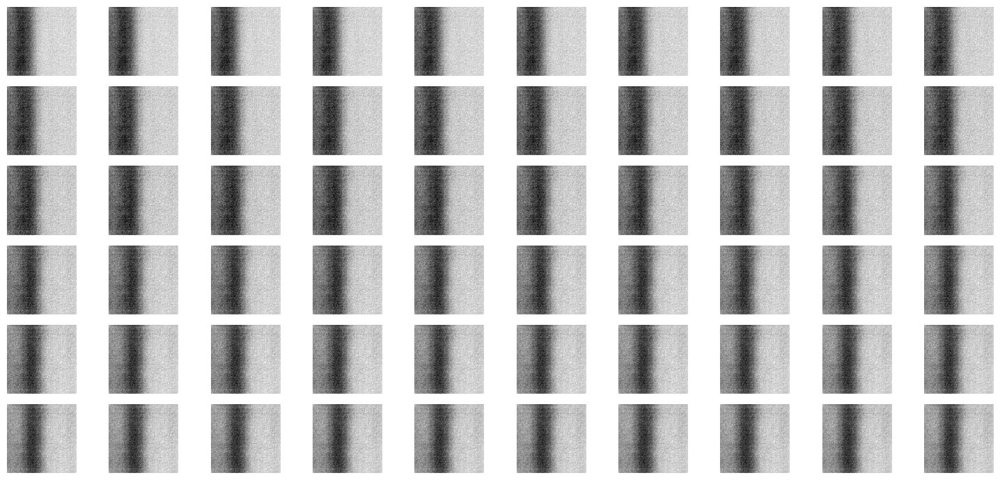

In [ ]:

caminho_arquivo = "/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/60_img_continuar_4_0_.pt"
dados_carregados = torch.load(caminho_arquivo, weights_only=False)

imagens = []  # Lista para armazenar as imagens

for item in dados_carregados:
    imagens.append(item['imagem_gerada'])  # Coleta todas as imagens

printImages2(imagens)  # Exibe todas as imagens juntas


### 4.13.4 - Grafico das referencias das imagens interpoladas

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from sklearn.manifold import TSNE

# Montar o Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Caminho do arquivo
caminho_arquivo_7 = "/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/60_img_continuar_4_0_.pt"
#caminho_arquivo_7 = "/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/180_img_de_3_em3_entreclasses_4_0_.pt"
#loaded_generated_images_list_7 = torch.load(caminho_arquivo_7)
loaded_generated_images_list_7 = torch.load(caminho_arquivo_7, weights_only=False)



imagem_gerada_7 = [item['imagem_gerada'] for item in loaded_generated_images_list_7]
image_ids_7 = [item['id'] for item in loaded_generated_images_list_7]  # Supondo que os IDs estão na chave 'ID'


# Converter imagens para 2D
imagens_7 = np.array([img_7.flatten() for img_7 in imagem_gerada_7])

# Aplicar t-SNE
perplexity = 12
tsne = TSNE(n_components=2, init='random',  random_state=0, perplexity= perplexity)
digits_proj = tsne.fit_transform(imagens_7)


fig, ax = plt.subplots(figsize=(10, 6))
scatter = ax.scatter(digits_proj[:, 0], digits_proj[:, 1], color='blue', alpha=0.6)

# Adicionar os IDs como anotações nos pontos
for i, txt in enumerate(image_ids_7):
    ax.annotate(txt, (digits_proj[i,0], digits_proj[i, 1]), fontsize=8, ha='right', va='bottom')

# Configurar eixos e título
ax.set_xlabel("Eixo X", fontsize=12)
ax.set_ylabel("Eixo Y", fontsize=12)

plt.show()


### 4.13.5 - Visualizar um GIF das imagens interpoladas

In [ ]:
from PIL import Image
from IPython.display import display, Image as IPImage
import torch

caminho_arquivo = "/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/60_img_continuar_4_0_.pt"
#caminho_arquivo = "/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/180_img_de_3_em3_entreclasses_4_0_.pt"

dados_carregados = torch.load(caminho_arquivo, weights_only=False)

imagens = []

for item in dados_carregados:
    img_array = item['imagem_gerada']
    if len(img_array.shape) == 4:  # se tiver 4 dimensões (batch, canais, altura, largura)
        img_array = img_array[0]  # seleciona a primeira imagem do batch

    img_pil = Image.fromarray(((img_array - img_array.min()) / (img_array.max() - img_array.min()) * 255).astype('uint8'))
    imagens.append(img_pil)

print(f"Quantidade de imagens: {len(imagens)}")
#cria e salva o gif
imagens[0].save('animacao.gif', save_all=True, append_images=imagens[1:], duration=100, loop=0)

display(IPImage(filename='animacao.gif'))

In [ ]:
"""
from PIL import Image
from IPython.display import display, Image as IPImage
import torch

caminho_arquivo = "/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/60_img_continuar_4_0_.pt"
#caminho_arquivo = "/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/180_img_de_3_em3_entreclasses_4_0_.pt"

dados_carregados = torch.load(caminho_arquivo)

imagens = []

for item in dados_carregados:
    img_array = item['imagem_gerada']
    if len(img_array.shape) == 4:  # se tiver 4 dimensões (batch, canais, altura, largura)
        img_array = img_array[0]  # seleciona a primeira imagem do batch

    img_pil = Image.fromarray(((img_array - img_array.min()) / (img_array.max() - img_array.min()) * 255).astype('uint8'))
    imagens.append(img_pil)

print(f"Quantidade de imagens: {len(imagens)}")

# Caminho completo para salvar o GIF no Google Drive
caminho_salvar = "/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/GIF_de_60_imagens_continu.gif"
#caminho_salvar = "/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/GIF_de_180_imagens_3em3_nao_continu.gif"

# Salva a animação como GIF no Google Drive
imagens[0].save(caminho_salvar, save_all=True, append_images=imagens[1:], duration=100, loop=0)

# Exibe o GIF
display(IPImage(filename=caminho_salvar))
"""

### 4.13.6 - Grafico das imagens interpoladas

In [ ]:
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
import numpy as np
import torch
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

# O resto do código permanece o mesmo...


# Carregar a lista de imagens geradas
caminho_arquivo = "/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/60_img_continuar_4_0_.pt"
#caminho_arquivo = "/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/180_img_de_3_em3_entreclasses_4_0_.pt"
loaded_generated_images_list = torch.load(caminho_arquivo, weights_only=False)

# Acessar todas do arquivo

imagem_gerada = [item['imagem_gerada'] for item in loaded_generated_images_list]
image_ids = [item['id'] for item in loaded_generated_images_list]  # Supondo que os IDs estão na chave 'ID'


# Verificação dos tamanhos das imagens e conversão para 2D
imagens = np.array([img.flatten() for img in imagem_gerada])



# Redução de dimensionalidade usando TSNE
tsne = TSNE(n_components=2, init='random', random_state=0, perplexity= 12)
digits_proj = tsne.fit_transform(imagens)

# Função auxiliar para inserir imagens nos pontos
def imscatter(x, y, image, ax=None, zoom=1.0):
    if ax is None:
        ax = plt.gca()
    imagebox = OffsetImage(image, zoom=zoom, cmap='gray')  # Certifique-se de que as imagens são exibidas em tons de cinza
    ab = AnnotationBbox(imagebox, (x, y), frameon=False)
    ax.add_artist(ab)

# Visualizar os dados reduzidos com imagens nos pontos
fig, ax = plt.subplots(figsize=(12, 8))


# Plotar cada imagem nos pontos correspondentes
for i in range(len(digits_proj)):
    img = imagem_gerada[i].reshape(224, 224)  # Assumindo que as imagens são 224x224
    imscatter(digits_proj[i, 0], digits_proj[i, 1], img, ax=ax, zoom=0.1)  # Aumente ou diminua o valor de 'zoom' conforme necessário


# Ajustar limites do gráfico para garantir que todas as imagens sejam exibidas corretamente
ax.update_datalim(digits_proj)
ax.autoscale()
ax.set_xlabel("Eixo X", fontsize=12)
ax.set_ylabel("Eixo Y", fontsize=12)
plt.title("APLICANDO TSNE PARA PLOTANDO EM 2D A INTERPOLAÇÃO DE DUAS IMAGENS", fontsize=20)
fig.text(0.5, -0.1,  # Ajuste o valor Y conforme necessário
   'Aqui são 60 imagens  criada pela DCGAN entre as classe classe 1.35 e da classe 1.33, elas tem  224x224 pixels e são tons de cinza.\n'
   'Essas 60 imagens, foram retira de um conjunto de 180 imagens, acada 3 imagens era salvo um. para\n'
   'Foram retira as 60 imagens de um conjunto de 180 imagens, acada 3 imagens era salvo um. para',
    ha='center', va='bottom', fontsize=16)
# Ajustar layout para garantir que todas as imagens sejam exibidas corretamente
plt.tight_layout()
plt.show()


### 4.13.7 - Mostrando a grafico das duas imagens e as imagens

---



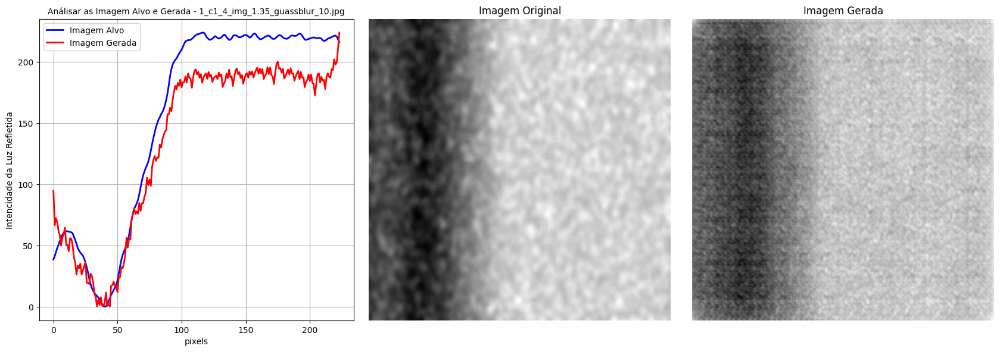

In [ ]:
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import skew
import os


# Caminho do arquivo contendo os dados salvos
caminho_arquivo = '/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/Lista_gerada_DCGAN/10_02_2025_dadosC1_50_epocas_12_Imagens_gerada_rps_cada_classe.pt'

# Carregar os dados do arquivo
dados_carregados = torch.load(caminho_arquivo, weights_only=False)

############# CLASSE 0 ###############

#1_c1_4_img_1.33_guassblur_10.jpg
#2_c1_4_img_1.33_guassblur_2.jpg
#5_c1_4_img_1.33_guassblur_10.jpg
#6_c1_4_img_1.33_guassblur_2.jpg
#7_c1_4_img_1.33_guassblur_10.jpg
#8_c1_4_img_1.33_guassblur_2.jpg
#11_c1_4_img_1.33_guassblur_10.jpg
#12_c1_4_img_1.33_guassblur_2.jpg
#15_c1_4_img_1.33_guassblur_10.jpg
#16_c1_4_img_1.33_guassblur_2.jpg
#17_c1_4_img_1.33_guassblur_10.jpg
#18_c1_4_img_1.33_guassblur_2.jpg

############# CLASSE 1 ###############
#1_c1_4_img_1.335_guassblur_10.jpg
#2_c1_4_img_1.335_guassblur_2.jpg
#5_c1_4_img_1.335_guassblur_10.jpg
#7_c1_4_img_1.335_guassblur_10.jpg
#8_c1_4_img_1.335_guassblur_2.jpg
#11_c1_4_img_1.335_guassblur_10.jpg
#12_c1_4_img_1.335_guassblur_2.jpg
#15_c1_4_img_1.335_guassblur_10.jpg
#16_c1_4_img_1.335_guassblur_2.jpg
#17_c1_4_img_1.335_guassblur_10.jpg
#18_c1_4_img_1.335_guassblur_2.jpg
#36_c1_4_img_1.335_guassblur_2.jpg

############# CLASSE 2 ###############
#1_c1_4_img_1.34_guassblur_10.jpg
#2_c1_4_img_1.34_guassblur_2.jpg
#5_c1_4_img_1.34_guassblur_10.jpg
#6_c1_4_img_1.34_guassblur_2.jpg
#7_c1_4_img_1.34_guassblur_10.jpg
#8_c1_4_img_1.34_guassblur_2.jpg
#11_c1_4_img_1.34_guassblur_10.jpg
#12_c1_4_img_1.34_guassblur_2.jpg
#15_c1_4_img_1.34_guassblur_10.jpg
#16_c1_4_img_1.34_guassblur_2.jpg
#17_c1_4_img_1.34_guassblur_10.jpg
#18_c1_4_img_1.34_guassblur_2.jpg

############# CLASSE 3 ###############
#1_c1_4_img_1.345_guassblur_10.jpg
#2_c1_4_img_1.345_guassblur_2.jpg
#5_c1_4_img_1.345_guassblur_10.jpg
#6_c1_4_img_1.345_guassblur_2.jpg
#7_c1_4_img_1.345_guassblur_10.jpg
#8_c1_4_img_1.345_guassblur_2.jpg
#11_c1_4_img_1.345_guassblur_10.jpg
#12_c1_4_img_1.345_guassblur_2.jpg
#15_c1_4_img_1.345_guassblur_10.jpg
#16_c1_4_img_1.345_guassblur_2.jpg
#17_c1_4_img_1.345_guassblur_10.jpg
#18_c1_4_img_1.345_guassblur_2.jpg


############# CLASSE 4 ###############
#1_c1_4_img_1.35_guassblur_10.jpg
#2_c1_4_img_1.35_guassblur_2.jpg
#5_c1_4_img_1.35_guassblur_10.jpg
#6_c1_4_img_1.35_guassblur_2.jpg
#7_c1_4_img_1.35_guassblur_10.jpg
#8_c1_4_img_1.35_guassblur_2.jpg
#11_c1_4_img_1.35_guassblur_10.jpg
#12_c1_4_img_1.35_guassblur_2.jpg
#15_c1_4_img_1.35_guassblur_10.jpg
#16_c1_4_img_1.35_guassblur_2.jpg
#17_c1_4_img_1.35_guassblur_10.jpg
#18_c1_4_img_1.35_guassblur_2.jpg
nome_img_1 = "1_c1_4_img_1.35_guassblur_10.jpg"

# Encontrar a imagem correspondente na lista de dados
imagem_selecionada = next(
    (item for item in dados_carregados if item['image_index'] == nome_img_1),
    None
)
# Converter para NumPy e reescalar para [0, 255]
#########################################################################
img_alvo1 = imagem_selecionada['imagem_alvo']
img_np_alvo = img_alvo1.squeeze().cpu().numpy()  # Remove dimensões extras
img_np_alvo = ((img_np_alvo + 1) * 127.5).astype(np.uint8)  # Reescala para [0, 255]
########################################################################
img_gerada1 = imagem_selecionada['imagem_gerada']
img_np_gerada = img_gerada1.squeeze()  # Se já for numpy, apenas use
img_np_gerada = ((img_np_gerada + 1) * 127.5).astype(np.uint8)
#########################################################################


#############################################################################################################################################################################
###################################################### FUNÇÃO (calcular_fwhm_max_min) - ALVO E GERADA  ######################################################################
# Função para calcular FWHM, ponto mínimo, CR e CL
def calcular_fwhm_max_min_alvo(curva_normalizada_alvo):
    max_value_alvo = np.max(curva_normalizada_alvo)
    min_value_alvo = np.min(curva_normalizada_alvo)
    fwhm_value_alvo = (max_value_alvo - min_value_alvo) / 2.0
    fwhm_line_alvo = min_value_alvo + fwhm_value_alvo
    min_index_alvo = np.argmin(curva_normalizada_alvo)

    cl_alvo = np.where(curva_normalizada_alvo[:min_index_alvo] >= fwhm_line_alvo)[0][-1] if len(np.where(curva_normalizada_alvo[:min_index_alvo] >= fwhm_line_alvo)[0]) > 0 else min_index_alvo
    cr_alvo = min_index_alvo + np.where(curva_normalizada_alvo[min_index_alvo:] >= fwhm_line_alvo)[0][0] if len(np.where(curva_normalizada_alvo[min_index_alvo:] >= fwhm_line_alvo)[0]) > 0 else min_index_alvo

    cl_ajustado_alvo = min_index_alvo - cl_alvo
    cr_ajustado_alvo = cr_alvo - min_index_alvo
    largura_total_alvo = cl_ajustado_alvo + cr_ajustado_alvo

    return fwhm_value_alvo, fwhm_line_alvo, min_value_alvo, cl_ajustado_alvo, cr_ajustado_alvo, largura_total_alvo, min_index_alvo

# Função para calcular FWHM, ponto mínimo, CR e CL
def calcular_fwhm_max_min_gerada(curva_normalizada_gerada):
    max_value_gerada = np.max(curva_normalizada_gerada)
    min_value_gerada = np.min(curva_normalizada_gerada)
    fwhm_value_gerada = (max_value_gerada - min_value_gerada) / 2.0
    fwhm_line_gerada = min_value_gerada + fwhm_value_gerada
    min_index_gerada = np.argmin(curva_normalizada_gerada)

    cl_gerada = np.where(curva_normalizada_gerada[:min_index_gerada] >= fwhm_line_gerada)[0][-1] if len(np.where(curva_normalizada_gerada[:min_index_gerada] >= fwhm_line_gerada)[0]) > 0 else min_index_gerada
    cr_gerada = min_index_gerada + np.where(curva_normalizada_gerada[min_index_gerada:] >= fwhm_line_gerada)[0][0] if len(np.where(curva_normalizada_gerada[min_index_gerada:] >= fwhm_line_gerada)[0]) > 0 else min_index_gerada

    cl_ajustado_gerada = min_index_gerada - cl_gerada
    cr_ajustado_gerada = cr_gerada - min_index_gerada
    largura_total_gerada = cl_ajustado_gerada + cr_ajustado_gerada

    return fwhm_value_gerada, fwhm_line_gerada, min_value_gerada, cl_ajustado_gerada, cr_ajustado_gerada, largura_total_gerada, min_index_gerada

###########################################################################################################################################################################
###################################################################################################

curva_alvo = np.sum(img_np_alvo, axis=0)  # Soma ao longo das linhas
curva_normalizada_visual_alvo = (curva_alvo - np.min(curva_alvo)) / (np.max(curva_alvo) - np.min(curva_alvo)) * img_np_alvo.shape[0]
fwhm_value_alvo, fwhm_line_alvo, min_value_alvo, cl_ajustado_alvo, cr_ajustado_alvo, largura_total_alvo, min_index_alvo = calcular_fwhm_max_min_alvo(curva_normalizada_visual_alvo)

curva_normalizada_energia_alvo = (curva_alvo - np.min(curva_alvo)) / (np.max(curva_alvo) - np.min(curva_alvo))
energia_normalizada_alvo = np.sum(curva_normalizada_energia_alvo ** 2)
assimetria_alvo = skew(curva_normalizada_visual_alvo)

###################################################################################################
curva_gerada = np.sum(img_np_gerada, axis=0)  # Soma ao longo das linhas
curva_normalizada_visual_gerada = (curva_gerada - np.min(curva_gerada)) / (np.max(curva_gerada) - np.min(curva_gerada)) * img_np_gerada.shape[0]
fwhm_value_gerada, fwhm_line_gerada, min_value_gerada, cl_ajustado_gerada, cr_ajustado_gerada, largura_total_gerada, min_index_gerada = calcular_fwhm_max_min_gerada(curva_normalizada_visual_gerada)

curva_normalizada_energia_gerada = (curva_gerada - np.min(curva_gerada)) / (np.max(curva_gerada) - np.min(curva_gerada))
energia_normalizada_gerada = np.sum(curva_normalizada_energia_gerada ** 2)
assimetria_gerada = skew(curva_normalizada_visual_gerada)




# Criando a figura com 3 colunas: 1 para o gráfico, 2 para as imagens
fig, axes = plt.subplots(1, 3, figsize=(17, 6))

#  Primeiro gráfico - Curvas normalizadas
axes[0].plot(curva_normalizada_visual_alvo, linewidth=2, color='blue', label="Imagem Alvo")
axes[0].plot(curva_normalizada_visual_gerada, linewidth=2, color='red', label="Imagem Gerada")

axes[0].legend()  # Exibe a legenda no gráfico
axes[0].set_title(f"Análisar as Imagem Alvo e Gerada - {nome_img_1}", fontsize=10)
axes[0].set_xlabel('pixels')
axes[0].set_ylabel('Intencidade da Luz Refletida')
axes[0].grid(True)

#  Segunda coluna - Exibe a imagem alvo
axes[1].imshow(img_alvo1.squeeze(0), cmap='gray')  # Remove a primeira dimensão
axes[1].set_title("Imagem Original")
axes[1].axis('off')  # Remove os eixos

# Terceira coluna - Exibe a imagem gerada
axes[2].imshow(img_gerada1.squeeze(), cmap='gray')  # Remove qualquer dimensão extra
axes[2].set_title("Imagem Gerada")
axes[2].axis('off')  # Remove os eixos

# Define os textos das informações
info_text1 = (f'FWHM_IMG_ALVO: {fwhm_value_alvo:.2f} - '
              f'Largura_IMG_ALVO: {largura_total_alvo} - '
              f'Energia_IMG_ALVO: {energia_normalizada_alvo:.2f} - '
              f'Assimetria_IMG_ALVO: {assimetria_alvo:.2f} - '
              f'Ponto Mínimo_IMG_ALVO: {min_index_alvo}')

info_text2 = (f'FWHM_IMG_GERADA: {fwhm_value_gerada:.2f} - '
              f'Largura_IMG_GERADA: {largura_total_gerada} - '
              f'Energia_IMG_GERADA: {energia_normalizada_gerada:.2f} - '
              f'Assimetria_IMG_GERADA: {assimetria_gerada:.2f} - '
              f'Ponto Mínimo_IMG_GERADA: {min_index_gerada}')

#  Posiciona os textos abaixo do gráfico
fig.text(0.02, -0.04, info_text1, fontsize=12, ha="left", va="top", color='blue')   # Esquerda
fig.text(0.02, -0.10, info_text2, fontsize=12, ha="left", va="top", color='red')   # Direita

plt.tight_layout()  # Ajusta o espaçamento automaticamente
plt.show()



### 4.13.8 - Mostrando todos os graficos das imagens interpoladas

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import skew

# Carregar os dados
caminho_arquivo1 = "/content/drive/My Drive/mestrado_16_03_2024/224X224_17_03_2025/180_img_de_3_em3_entreclasses_4_0_.pt"
#caminho_arquivo2 = "/content/drive/My Drive/mestrado_16_03_2024/224X224_17_03_2025/60_img_continuar_4_0_.pt"
loaded_generated_images_list = torch.load(caminho_arquivo, weights_only=False)

# Definir a função fora do loop
def calcular_fwhm_max_min_gerada(curva_normalizada_gerada):
    max_value_gerada = np.max(curva_normalizada_gerada)
    min_value_gerada = np.min(curva_normalizada_gerada)
    fwhm_value_gerada = (max_value_gerada - min_value_gerada) / 2.0
    fwhm_line_gerada = min_value_gerada + fwhm_value_gerada
    min_index_gerada = np.argmin(curva_normalizada_gerada)

    return fwhm_value_gerada, fwhm_line_gerada, min_value_gerada, max_value_gerada, min_index_gerada

# Iterar sobre cada imagem gerada
for idx, item in enumerate(loaded_generated_images_list):
    img_np_gerada = item['imagem_gerada'].squeeze()
    img_np_gerada = ((img_np_gerada + 1) * 127.5).astype(np.uint8)

    # Calcular curva e normalizar
    curva_gerada = np.sum(img_np_gerada, axis=0)
    curva_normalizada_visual_gerada = (curva_gerada - np.min(curva_gerada)) / (np.max(curva_gerada) - np.min(curva_gerada)) * img_np_gerada.shape[0]

    # Calcular métricas
    fwhm_value_gerada, fwhm_line_gerada, min_value_gerada, max_value_gerada, min_index_gerada = calcular_fwhm_max_min_gerada(curva_normalizada_visual_gerada)
    energia_normalizada_gerada = np.sum(curva_normalizada_visual_gerada ** 2)
    assimetria_gerada = skew(curva_normalizada_visual_gerada)

    # Criar gráfico
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.plot(curva_normalizada_visual_gerada, linewidth=2, color='blue', label="Imagem Gerada")
    ax.legend()

    # Adicionar informações
    info_text = (f'FWHM: {fwhm_value_gerada:.2f}\n'
                 f'Largura: {fwhm_line_gerada:.2f}\n'
                 f'Energia: {energia_normalizada_gerada:.2f}\n'
                 f'Assimetria: {assimetria_gerada:.2f}\n'
                 f'Ponto Mínimo: {min_index_gerada}')

    fig.text(0.10, -0.01, info_text, fontsize=12, ha="left", va="top")

    # Configurar eixos
    plt.title(f"Análise da Imagem {idx + 1}", fontsize=10)
    plt.xlabel('Ângulo de Incidencia (Graus °)')
    plt.ylabel('Intencidade da Luz Refletida')
    plt.grid(True)

    # Exibir gráfico
    plt.show()






### 4.13.9 - Gerando GIF dos graficos da interpolação

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import imageio
from scipy.stats import skew
import os
from IPython.display import Image

# Carregar os dados
#caminho_arquivo = "/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/180_img_de_3_em3_entreclasses_4_0_.pt"
caminho_arquivo = "/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/60_img_continuar_4_0_.pt"
loaded_generated_images_list = torch.load(caminho_arquivo, weights_only=False)

# Criar diretório temporário para armazenar as imagens
temp_dir = "temp_gif_frames"
os.makedirs(temp_dir, exist_ok=True)

# Definir a função de cálculo
def calcular_fwhm_max_min_gerada(curva_normalizada_gerada):
    max_value_gerada = np.max(curva_normalizada_gerada)
    min_value_gerada = np.min(curva_normalizada_gerada)
    fwhm_value_gerada = (max_value_gerada - min_value_gerada) / 2.0
    fwhm_line_gerada = min_value_gerada + fwhm_value_gerada
    min_index_gerada = np.argmin(curva_normalizada_gerada)
    return fwhm_value_gerada, fwhm_line_gerada, min_value_gerada, max_value_gerada, min_index_gerada

# Lista para armazenar os nomes das imagens
image_files = []

# Iterar sobre cada imagem gerada
for idx, item in enumerate(loaded_generated_images_list):
    img_np_gerada = item['imagem_gerada'].squeeze()
    img_np_gerada = ((img_np_gerada + 1) * 127.5).astype(np.uint8)

    # Calcular curva e normalizar
    curva_gerada = np.sum(img_np_gerada, axis=0)
    curva_normalizada_visual_gerada = (curva_gerada - np.min(curva_gerada)) / (np.max(curva_gerada) - np.min(curva_gerada)) * img_np_gerada.shape[0]

    # Calcular métricas
    fwhm_value_gerada, fwhm_line_gerada, min_value_gerada, max_value_gerada, min_index_gerada = calcular_fwhm_max_min_gerada(curva_normalizada_visual_gerada)
    energia_normalizada_gerada = np.sum(curva_normalizada_visual_gerada ** 2)
    assimetria_gerada = skew(curva_normalizada_visual_gerada)

    # Criar gráfico
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.plot(curva_normalizada_visual_gerada, linewidth=2, color='red', label="Imagem Gerada")
    #ax.legend()

    # Adicionar informações
    info_text = (f'FWHM: {fwhm_value_gerada:.2f}\n'
                 f'Largura: {fwhm_line_gerada:.2f}\n'
                 f'Energia: {energia_normalizada_gerada:.2f}\n'
                 f'Assimetria: {assimetria_gerada:.2f}\n'
                 f'Ponto Mínimo: {min_index_gerada}')

    # Ajustar a posição do texto
    fig.subplots_adjust(bottom=0.2)  # Ajustar para garantir espaço no gráfico
    ##fig.text(0.05, 0.15, info_text, fontsize=14, ha="left", va="top")
    # Adicionar informações no centro do gráfico
    fig.text(0.5, 0.08, info_text, fontsize=14, ha="center", va="center", wrap=True)


    # Configurar eixos
    plt.title(f"Análise da Imagem {idx + 1}", fontsize=10)
    plt.xlabel('Posição')
    plt.ylabel('Intensidade Normalizada (Visual)')
    plt.grid(True)

    # Salvar gráfico como imagem
    img_path = os.path.join(temp_dir, f"frame_{idx:03d}.png")
    plt.savefig(img_path)
    image_files.append(img_path)
    plt.close(fig)

# Definir o caminho final para o GIF
#gif_path = "/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/GIF_de_180_graficos_de_3em3_nao_continu.gif"
gif_path = "/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/GIF_de_60_graficos_continu.gif"

# Criar e salva o GIF
#imageio.mimsave(gif_path, [imageio.imread(img) for img in image_files], duration=0.5, loop=0)

# Limpar imagens temporárias
for img in image_files:
    os.remove(img)
os.rmdir(temp_dir)

print(f"GIF salvo como {gif_path}")

# Exibir o GIF com um tamanho reduzido (por exemplo, 400px de largura)
Image(gif_path, width=500)  # Ajuste o valor conforme necessário


In [ ]:
from IPython.display import display
import ipywidgets as widgets
from PIL import Image as PILImage
import io

# Caminhos dos GIFs
gif_img = "/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/GIF_de_60_imagens_continu.gif"
gif_grafico = "/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/GIF_de_60_graficos_continu.gif"

# Função para carregar a imagem e convertê-la em um formato adequado para widgets
def load_image(image_path, width, height):
    with open(image_path, "rb") as file:
        img_data = file.read()
    return widgets.Image(value=img_data, format='png', width=width, height=height)

# Carregar as imagens como widgets com tamanhos ajustados
gif1_widget = load_image(gif_img, width=300, height=100)
gif2_widget = load_image(gif_grafico, width=300, height=700)

# Organizar os GIFs lado a lado
display(widgets.HBox([gif1_widget, gif2_widget]))



In [ ]:
def busca_imagem(testloader, label, image_name):
    # Percorrer o testloader para encontrar a imagem com o rótulo e nome desejados
    for images, labels, names in testloader:
        # Para cada imagem, verificar se o rótulo e o nome correspondem
        for i in range(len(labels)):
            if labels[i].item() == label and names[i] == image_name:
                # Retorna a imagem, rótulo e nome
                return images[i], labels[i], names[i]

    # Caso a imagem não seja encontrada
    raise ValueError(f"Imagem com rótulo {label} e nome {image_name} não encontrada.")

In [ ]:
def findLatentVector_3(G, z_i, image, maxEpochs=5000, patience=5):
    z = torch.randn(1, z_i, 1, 1, device=device, requires_grad=True)# Cria um vetor latente inicial aleatório
    z_optimizer = optim.Adam([z], lr=0.01)#otimizador Adam para ajustar o vetor latente `z`
    criterion = nn.MSELoss(reduction='sum')#função de perda (loss function) do tipo MSE (Mean Squared Error).
    z_optimizer.zero_grad()#Zera os gradientes acumulados do otimizador.

    #Inicializa variáveis de controle:
    last_loss = 10000
    no_change = 0

    #Loop de treinamento que itera até `maxEpochs`
    for epoch in range(maxEpochs + 1):
        generated_image = G(z)#Gera uma imagem a partir do vetor latente `z`
        loss = criterion(generated_image, image)#Calcula a perda comparando a imagem gerada com a imagem alvo
        loss.backward()#Calcula os gradientes da perda em relação ao vetor latente `z`.
        z_optimizer.step()#Atualiza o vetor latente `z`
        z_optimizer.zero_grad()#Zera os gradientes acumulados no otimizador

        if last_loss - loss.item() < 0:#Verifica se a perda atual não melhorou significativament
            no_change += 1
        else:
            no_change = 0

        if no_change >= patience:#Interrompe o treinamento se não houver melhoria por `patience`
            break

        last_loss = loss.item()#Atualiza `last_loss` com a perda atual para a próxima iteração

    return z.detach()#Retorna o vetor latente `z` ajustado, com os gradientes desativados

In [ ]:
def busca_vetor_latente(G, z_i, image, maxEpochs=5000, patience=5):

    # choose a random starting point
    z = torch.randn(1, z_i, 1, 1, device=device, requires_grad=True)

    # define the optimization problem (method, loss)
    z_optimizer = optim.Adam([z], lr = 0.01)
    criterion = nn.MSELoss(reduction='sum')

    # run optimization
    z_optimizer.zero_grad()

    #print('started latent space recovery')
    last_loss = 10000
    no_change = 0
    for epoch in range(maxEpochs + 1):
        loss = criterion(G(z), image)
        #print(G(z))
        loss.backward()
        z_optimizer.step()

        if last_loss - loss.item() < 0:
            no_change += 1
        else:
            no_change = 0

        if no_change >= patience:
            break

        last_loss = loss.item()

    return z.detach()

In [ ]:
"""
import os
import torch
import matplotlib.pyplot as plt
from torchvision import transforms
from torchvision.io import read_image

# Caminho das imagens
img_originais = "/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/IMAGENS_ORIGINAIS_SPR"  # imagem: RGB

# Transformação sem ToTensor()
transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.Resize((224, 224)),
    transforms.Normalize((0.5,), (0.5,))
])

# Listar imagens no diretório
image_files = [os.path.join(img_originais, f) for f in os.listdir(img_originais) if f.endswith(".jpg")]

# Carregar imagens corretamente
imagens_carregadas = {
    os.path.basename(img): transform(read_image(img, mode=torchvision.io.ImageReadMode.RGB).float())
    for img in image_files
}
"""

In [ ]:
"""
def pegar_tensor(nome_imagem):
    # Acessa a imagem pelo nome e retorna o tensor
    imagem = imagens_carregadas.get(nome_imagem)
    return imagem  # Retorna o tensor (ou None, se a imagem não for encontrada)
"""

In [ ]:
"""
def Visualizar_Image_criada(G, z_i, label,  img_0, img_1, img_2, img_3):#interpolação de um numero para outro
    # Encontrar imagens no conjunto de dados com o rótulo desejado
    img0, rotulo, nome_imagem = busca_imagem(testloader, label, img_0)
    img1, rotulo, nome_imagem = busca_imagem(testloader, label, img_1)
    img2, rotulo, nome_imagem = busca_imagem(testloader, label, img_2)
    img3, rotulo, nome_imagem = busca_imagem(testloader, label, img_3)
    print('Imagens retiradas do conjunto de dados "testloader"')
    printImages1([img0, img1, img2, img3])

    # Encontrar os vetores do espaço latente que geram réplicas dessas imagens
    z0 = findLatentVector(G, z_i,  img0, maxEpochs=5000)
    z1 = findLatentVector(G, z_i,  img1, maxEpochs=5000)
    z2 = findLatentVector(G, z_i,  img2, maxEpochs=5000)
    z3 = findLatentVector(G, z_i,  img3, maxEpochs=5000)


    with torch.no_grad():
        G.eval()
        #Remove dimensões extras se houver
        #image_z0 = G(z0).cpu().numpy()

        image_z0 = G(z0).squeeze(0).permute(1, 2, 0).cpu().numpy()
        image_z1 = G(z1).squeeze(0).permute(1, 2, 0).cpu().numpy()
        image_z2 = G(z2).squeeze(0).permute(1, 2, 0).cpu().numpy()
        image_z3 = G(z3).squeeze(0).permute(1, 2, 0).cpu().numpy()



    print('Imagens gerada por um GAN baseado na imagens acima:')
    printImages1([image_z0, image_z1, image_z2, image_z3])
"""

In [ ]:
#Visualizar_Image_criada(G, z_i, 0, "h2o.jpg", "hipo.jpg", "pbs.jpg", "Imagem_camera_seco.jpg")

In [ ]:
def Visualizar_Image_criada(G, z_i, label,  img_0):#interpolação de um numero para outro
    # Encontrar imagens no conjunto de dados com o rótulo desejado
    resultados = []
    img0, rotulo, nome_imagem = busca_imagem(testloader, label, img_0)
    print('Imagens retiradas do conjunto de dados "testloader"')
    printImages1([img0])

    # Encontrar os vetores do espaço latente que geram réplicas dessas imagens
    z0 = findLatentVector_3(G, z_i,  img0, maxEpochs=5000)


    with torch.no_grad():
        G.eval()
        #Remove dimensões extras se houver
        #image_z0 = G(z0).cpu().numpy()
        image_z0 = G(z0).squeeze(0).permute(1, 2, 0).cpu().numpy()

        resultados.append({
            'image_index': nome_imagem,  # Usa o nome da imagem como identificador
            'imagem_alvo': img0,
            'vetor_latente': z0,
            'imagem_gerada': image_z0
        })

        nome_base = os.path.splitext(nome_imagem)[0]
        caminho_saida = f"/content/drive/My Drive/mestrado_16_03_2024/224X224_24_02_2025/vetor_img_{nome_base}.pt"
        torch.save(resultados, caminho_saida)

    print('Imagens gerada por um GAN baseado na imagens acima:')
    printImages1([image_z0])

In [ ]:
#h2o.jpg", "hipo.jpg", "pbs.jpg", "Imagem_camera_seco.jpg
#Simulado_h2o.png
#Simulado_h2o_teste2.png
#img_simulada_133.jpg
#img_simulada_1335.jpg
#img_simulada_134.jpg
#img_simulada_1345.jpg
#img_simulada_135.jpg
#Imagem_camera_seco_cortada.jpg
#Visualizar_Image_criada( G, z_i, 0,"Simulado_h2o.png")

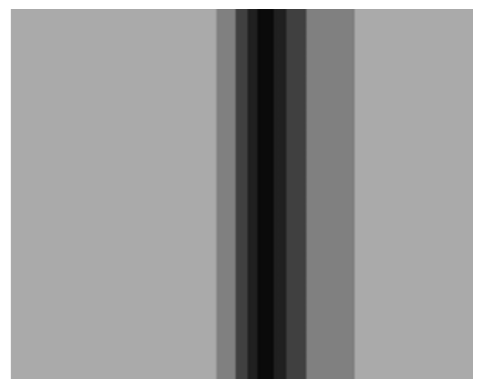

In [ ]:
#Simulado_h2o.png
#Simulado_h2o_teste2.png
#img_simulada_133.jpg
#img_simulada_1335.jpg
#img_simulada_134.jpg
#img_simulada_1345.jpg
#img_simulada_135.jpg
#Imagem_camera_seco_cortada.jpg


import matplotlib.pyplot as plt
from PIL import Image

# Caminho da imagem
caminho_trainloader = "/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/IMG_SEM RUIDO/Simulado_h2o_teste2.png"

# Abrir a imagem
imagem = Image.open(caminho_trainloader)

# Exibir corretamente em tons de cinza
plt.imshow(imagem, cmap="gray")  # Força escala de cinza
plt.axis("off")
plt.show()







In [ ]:
############# CLASSE 0 ###############

#1_c1_4_img_1.33_guassblur_10.jpg
#2_c1_4_img_1.33_guassblur_2.jpg
#5_c1_4_img_1.33_guassblur_10.jpg
#6_c1_4_img_1.33_guassblur_2.jpg
#7_c1_4_img_1.33_guassblur_10.jpg
#8_c1_4_img_1.33_guassblur_2.jpg
#11_c1_4_img_1.33_guassblur_10.jpg
#12_c1_4_img_1.33_guassblur_2.jpg
#15_c1_4_img_1.33_guassblur_10.jpg
#16_c1_4_img_1.33_guassblur_2.jpg
#17_c1_4_img_1.33_guassblur_10.jpg
#18_c1_4_img_1.33_guassblur_2.jpg

############# CLASSE 1 ###############
#1_c1_4_img_1.335_guassblur_10.jpg
#2_c1_4_img_1.335_guassblur_2.jpg
#5_c1_4_img_1.335_guassblur_10.jpg
#7_c1_4_img_1.335_guassblur_10.jpg
#8_c1_4_img_1.335_guassblur_2.jpg
#11_c1_4_img_1.335_guassblur_10.jpg
#12_c1_4_img_1.335_guassblur_2.jpg
#15_c1_4_img_1.335_guassblur_10.jpg
#16_c1_4_img_1.335_guassblur_2.jpg
#17_c1_4_img_1.335_guassblur_10.jpg
#18_c1_4_img_1.335_guassblur_2.jpg
#36_c1_4_img_1.335_guassblur_2.jpg

############# CLASSE 2 ###############
#1_c1_4_img_1.34_guassblur_10.jpg
#2_c1_4_img_1.34_guassblur_2.jpg
#5_c1_4_img_1.34_guassblur_10.jpg
#6_c1_4_img_1.34_guassblur_2.jpg
#7_c1_4_img_1.34_guassblur_10.jpg
#8_c1_4_img_1.34_guassblur_2.jpg
#11_c1_4_img_1.34_guassblur_10.jpg
#12_c1_4_img_1.34_guassblur_2.jpg
#15_c1_4_img_1.34_guassblur_10.jpg
#16_c1_4_img_1.34_guassblur_2.jpg
#17_c1_4_img_1.34_guassblur_10.jpg
#18_c1_4_img_1.34_guassblur_2.jpg

############# CLASSE 3 ###############
#1_c1_4_img_1.345_guassblur_10.jpg
#2_c1_4_img_1.345_guassblur_2.jpg
#5_c1_4_img_1.345_guassblur_10.jpg
#6_c1_4_img_1.345_guassblur_2.jpg
#7_c1_4_img_1.345_guassblur_10.jpg
#8_c1_4_img_1.345_guassblur_2.jpg
#11_c1_4_img_1.345_guassblur_10.jpg
#12_c1_4_img_1.345_guassblur_2.jpg
#15_c1_4_img_1.345_guassblur_10.jpg
#16_c1_4_img_1.345_guassblur_2.jpg
#17_c1_4_img_1.345_guassblur_10.jpg
#18_c1_4_img_1.345_guassblur_2.jpg


############# CLASSE 4 ###############
#1_c1_4_img_1.35_guassblur_10.jpg
#2_c1_4_img_1.35_guassblur_2.jpg
#5_c1_4_img_1.35_guassblur_10.jpg
#6_c1_4_img_1.35_guassblur_2.jpg
#7_c1_4_img_1.35_guassblur_10.jpg
#8_c1_4_img_1.35_guassblur_2.jpg
#11_c1_4_img_1.35_guassblur_10.jpg
#12_c1_4_img_1.35_guassblur_2.jpg
#15_c1_4_img_1.35_guassblur_10.jpg
#16_c1_4_img_1.35_guassblur_2.jpg
#17_c1_4_img_1.35_guassblur_10.jpg
#18_c1_4_img_1.35_guassblur_2.jpg

In [ ]:
import matplotlib.pyplot as plt
import torch

def printImages5(titles, images_row1, images_row2):
    num_images = len(images_row2)  # Assume que todas as linhas têm o mesmo número de elementos
    rows = 3  # Número total de linhas

    fig, axes = plt.subplots(rows, num_images, figsize=(num_images * 2, rows * 2))  # Ajusta o tamanho

    # Se houver apenas uma imagem, transforma axes em listas
    if num_images == 1:
        axes = [[ax] for ax in axes]  # Ajusta estrutura para caso de uma única coluna

    # Preenche a primeira linha (títulos)
    for i, title in enumerate(titles):
        axes[0, i].text(0.5, 0.5, title, fontsize=10, ha='center', va='center')
        axes[0, i].axis('off')  # Remove os eixos para texto

    # Função para exibir imagens ou operadores
    def display_image(ax, img):
        if isinstance(img, str):  # Se for um operador ('+', '-', '=')
            ax.text(0.5, 0.5, img, fontsize=18, ha='center', va='center', fontweight='bold')
            ax.axis('off')  # Remove os eixos para o texto
        else:
            if isinstance(img, torch.Tensor):
                img = img.squeeze().cpu().numpy()  # Remove dimensões extras e converte para NumPy

            if img.ndim == 4 and img.shape[0] == 1:
                img = img.squeeze()  # Remove dimensões extras
            elif img.ndim == 3 and img.shape[0] == 1:
                img = img[0]  # Remove o canal extra se for único
            elif img.ndim == 3 and img.shape[-1] == 1:
                img = img.squeeze(-1)  # Remove a última dimensão (caso de (224, 224, 1))

            ax.imshow(img, cmap='gray', interpolation='nearest')
            ax.axis('off')  # Remove os eixos para uma visualização limpa

    # Preenche a segunda linha (imagens alvo)
    for i, img in enumerate(images_row1):
        display_image(axes[1, i], img)

    # Preenche a terceira linha (imagens geradas + operadores)
    for i, img in enumerate(images_row2):
        display_image(axes[2, i], img)

    plt.show()



In [3]:
import torch
import os

# Caminho do primeiro arquivo
caminho_arquivo_1 = "/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/Lista_gerada_DCGAN/10_02_2025_dadosC1_50_epocas_12_Imagens_gerada_rps_cada_classe.pt"
dados_carregados_1 = torch.load(caminho_arquivo_1, weights_only=False)

# Nome da primeira imagem
nome_img_1 = "1_c1_4_img_1.33_guassblur_10.jpg"
imagem_selecionada_1 = next((item for item in dados_carregados_1 if item['image_index'] == nome_img_1), None)

imagem_alvo1 = imagem_selecionada_1['imagem_alvo']
vetor_latente_simulado1 = imagem_selecionada_1['vetor_latente']
imagem_gerada_simulado1 = imagem_selecionada_1['imagem_gerada']

# Caminho do segundo arquivo
nome_imagem2 = "Imagem_camera_secoCortada.jpg"
nome_base2 = os.path.splitext(nome_imagem2)[0]
caminho_arquivo_2 = f"/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/vetor_img_{nome_base2}.pt"
dados_carregados_2 = torch.load(caminho_arquivo_2, weights_only=False)

imagem_selecionada_2 = next((item for item in dados_carregados_2 if item['image_index'] == nome_imagem2), None)

imagem_alvo2 = imagem_selecionada_2['imagem_alvo']
vetor_latente_original2 = imagem_selecionada_2['vetor_latente']
imagem_gerada_original2 = imagem_selecionada_2['imagem_gerada']

# Calculando vetor latente interpolado
vetor_latente_soma1 = vetor_latente_simulado1 + vetor_latente_original2


with torch.no_grad():
    G.eval()
    image_soma1 = G(vetor_latente_soma1).cpu().numpy()

# Exibir imagens corretamente
printImages5(
    [f'{nome_img_1}', '', f'{nome_base2}', '', 'Resultado'],  # Primeira linha: Títulos
    [imagem_alvo1, '', imagem_alvo2, '', ''],  # Segunda linha: Imagens alvo
    [imagem_gerada_simulado1, '+', imagem_gerada_original2, '=', image_soma1]  # Terceira linha: Imagens geradas
)


NameError: name 'G' is not defined

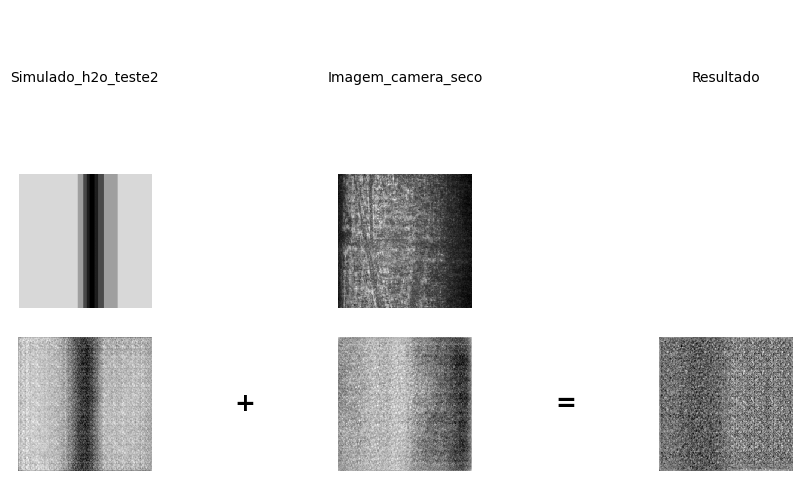

In [ ]:
nome_imagem3 = "Simulado_h2o_teste2.png"
nome_base3 = os.path.splitext(nome_imagem3)[0]
caminho_arquivo_3 = f"/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/vetor_img_{nome_base3}.pt"
dados_carregados_3 = torch.load(caminho_arquivo_3, weights_only=False)

imagem_selecionada_3 = next((item for item in dados_carregados_3 if item['image_index'] == nome_imagem3),None)

imagem_alvo3 = imagem_selecionada_3['imagem_alvo']
vetor_latente_original3 = imagem_selecionada_3['vetor_latente']
imagem_gerada_original3 = imagem_selecionada_3['imagem_gerada']


############################################################################################

nome_imagem4 = "Imagem_camera_seco.jpg"
nome_base4 = os.path.splitext(nome_imagem4)[0]
caminho_arquivo_4 = f"/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/vetor_img_{nome_base4}.pt"
dados_carregados_4 = torch.load(caminho_arquivo_4, weights_only=False)
imagem_selecionada_4 = next(
    (item for item in dados_carregados_4 if item['image_index'] == nome_imagem4),
    None
)
imagem_alvo4 = imagem_selecionada_4['imagem_alvo']
vetor_latente_original4 = imagem_selecionada_4['vetor_latente']
imagem_gerada_original4 = imagem_selecionada_4['imagem_gerada']
import numpy
vetor_latente_soma2 =   vetor_latente_original3 - vetor_latente_original4



with torch.no_grad():
    G.eval()
    image_soma2 = G(vetor_latente_soma2).cpu()
printImages5(

    [f'{nome_base3}', '', f'{nome_base4}', '', 'Resultado'],  # Primeira linha: Títulos
    [imagem_alvo3, '', imagem_alvo4, '', ''],  # Segunda linha: Imagens alvo
    [imagem_gerada_original3, '+', imagem_gerada_original4, '=', image_soma2]  # Terceira linha: Imagens geradas com operadores
)


#h2o.jpg", "hipo.jpg", "pbs.jpg", "Imagem_camera_seco.jpg
#Simulado_h2o.png
#Simulado_h2o_teste2.png
#img_simulada_133.jpg
#img_simulada_1335.jpg
#img_simulada_134.jpg
#img_simulada_1345.jpg
#img_simulada_135.jpg




In [ ]:
def visualizeTransition(G, z_i, label1, label2):


    # Caminho do primeiro arquivo
    caminho_arquivo_1 = "/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/Lista_gerada_DCGAN/10_02_2025_dadosC1_50_epocas_12_Imagens_gerada_rps_cada_classe.pt"
    dados_carregados_1 = torch.load(caminho_arquivo_1, weights_only=False)

    # Nome da primeira imagem
    nome_img_1 = "1_c1_4_img_1.33_guassblur_10.jpg"
    imagem_selecionada_1 = next((item for item in dados_carregados_1 if item['image_index'] == nome_img_1), None)

    imagem_alvo1 = imagem_selecionada_1['imagem_alvo']
    vetor_latente_simulado1 = imagem_selecionada_1['vetor_latente']
    imagem_gerada_simulado1 = imagem_selecionada_1['imagem_gerada']

    # Caminho do segundo arquivo
    nome_imagem2 = "Imagem_camera_secoCortada.jpg"
    nome_base2 = os.path.splitext(nome_imagem2)[0]

    caminho_arquivo_2 = f"/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/vetor_img_{nome_base2}.pt"
    dados_carregados_2 = torch.load(caminho_arquivo_2, weights_only=False)

    imagem_selecionada_2 = next((item for item in dados_carregados_2 if item['image_index'] == nome_imagem2), None)

    imagem_alvo2 = imagem_selecionada_2['imagem_alvo']
    vetor_latente_original2 = imagem_selecionada_2['vetor_latente']
    imagem_gerada_original2 = imagem_selecionada_2['imagem_gerada']



    # interpolate between the two points and print samples
    print('\nlinear interpolation of samples')
    printImages1([imagem_alvo2, imagem_alvo1])
    interpolatedImages = evaluateModel(G, z_i, mode='linear', p1= vetor_latente_original2, p2=vetor_latente_simulado1)
    printImages1(interpolatedImages)

    print('\nspherical linear interpolation of samples')
    interpolatedImages = evaluateModel(G, z_i, mode='spherical', p1= vetor_latente_original2, p2=vetor_latente_simulado1)
    printImages1(interpolatedImages)


linear interpolation of samples


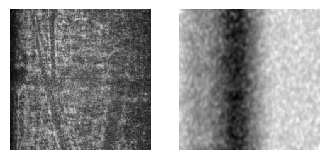

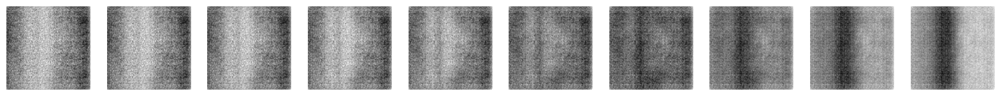


spherical linear interpolation of samples


<ipython-input-10-ee0f770f27f9>:6: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  omega = arccos(clip(dot(low/norm(low), high/norm(high)), -1, 1))


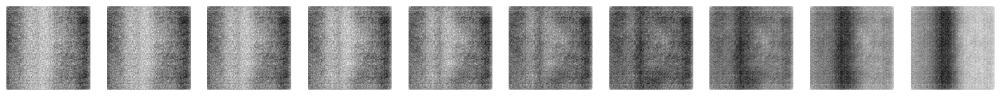

In [ ]:
visualizeTransition(G,z_i,3,6)

In [ ]:
def visualizeTransition43(G, z_i, label1, label2):


    nome_imagem3 = "Simulado_h2o_teste2.png"
    nome_base3 = os.path.splitext(nome_imagem3)[0]
    caminho_arquivo_3 = f"/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/vetor_img_{nome_base3}.pt"
    dados_carregados_3 = torch.load(caminho_arquivo_3, weights_only=False)

    imagem_selecionada_3 = next((item for item in dados_carregados_3 if item['image_index'] == nome_imagem3),None)

    imagem_alvo3 = imagem_selecionada_3['imagem_alvo']
    vetor_latente_original3 = imagem_selecionada_3['vetor_latente']
    imagem_gerada_original3 = imagem_selecionada_3['imagem_gerada']


    # Caminho do segundo arquivo
    nome_imagem2 = "Imagem_camera_secoCortada.jpg"
    nome_base2 = os.path.splitext(nome_imagem2)[0]

    caminho_arquivo_2 = f"/content/drive/My Drive/mestrado_16_03_2024/224X224_24_03_2025/vetor_img_{nome_base2}.pt"
    dados_carregados_2 = torch.load(caminho_arquivo_2, weights_only=False)

    imagem_selecionada_2 = next((item for item in dados_carregados_2 if item['image_index'] == nome_imagem2), None)

    imagem_alvo2 = imagem_selecionada_2['imagem_alvo']
    vetor_latente_original2 = imagem_selecionada_2['vetor_latente']
    imagem_gerada_original2 = imagem_selecionada_2['imagem_gerada']



    # interpolate between the two points and print samples
    print('\nlinear interpolation of samples')
    printImages1([imagem_alvo2, imagem_alvo3])
    interpolatedImages = evaluateModel(G, z_i, mode='linear', p1= vetor_latente_original2, p2=vetor_latente_original3)
    printImages1(interpolatedImages)

    print('\nspherical linear interpolation of samples')
    interpolatedImages = evaluateModel(G, z_i, mode='spherical', p1= vetor_latente_original2, p2=vetor_latente_original3)
    printImages1(interpolatedImages)


linear interpolation of samples


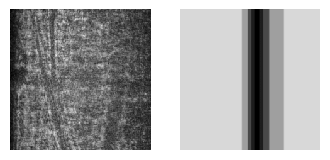

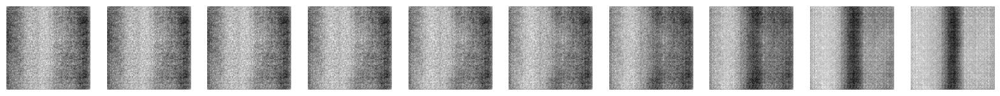


spherical linear interpolation of samples


<ipython-input-10-ee0f770f27f9>:6: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  omega = arccos(clip(dot(low/norm(low), high/norm(high)), -1, 1))


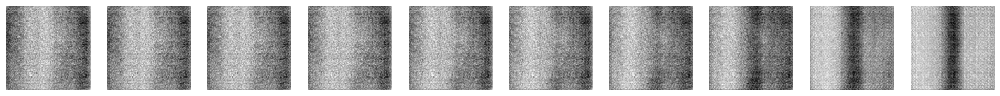

In [ ]:
visualizeTransition43(G,z_i,3,6)

In [ ]:
import torch
import os
import torchvision
import torchvision.transforms as transforms
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
import torch.optim as optim
import zipfile
from torch.utils.data import random_split, DataLoader

from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# definir dispositivo
device = torch.device("cpu")

"""
# Caminho para o arquivo zip (ajuste conforme necessário)
zip_path = "/teamspace/studios/this_studio/IMAGENS_SIMULADAS_RPS_C1/IMAGENS_SIMULADAS_RPS_C1-20250510T235134Z-1-001.zip"
extract_to = "/teamspace/studios/this_studio/IMAGENS_SIMULADAS_RPS_C1/"

# Extração
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print("Arquivo extraído com sucesso!")
"""
###################################################
caminho_trainloader = "/teamspace/studios/this_studio/IMAGENS_SIMULADAS_RPS_C1/trainloader"
caminho_testloader = "/teamspace/studios/this_studio/IMAGENS_SIMULADAS_RPS_C1/testloader"

# Transformação das imagens
transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),  # Converter para escala de cinza
    transforms.Resize((224, 224)),                # Redimensionar para 224x224
    transforms.ToTensor(),                        # Converter para tensor
    transforms.Normalize((0.5,), (0.5,))          # Normalizar para [-1, 1]
])

# Criando uma classe personalizada para o Dataset que também retorna o nome da imagem
class CustomImageFolder(datasets.ImageFolder):
    def __getitem__(self, index):
        image, label = super().__getitem__(index)  # Obtém a imagem transformada e o rótulo
        image_path = self.imgs[index][0]  # Caminho completo da imagem
        image_name = os.path.basename(image_path)  # Obtém apenas o nome do arquivo

        return image, label, image_name  # Retorna a imagem, rótulo e nome do arquivo

# Criar o dataset usando a classe CustomImageFolder
dataset_trainloader = CustomImageFolder(root=caminho_trainloader, transform=transform)
dataset_testloader = CustomImageFolder(root=caminho_testloader, transform=transform)


trainloader = DataLoader(dataset_trainloader, batch_size=1, shuffle=True, num_workers=0)# Tem 108 imagens cada classe, totalizando 540imagens
testloader = DataLoader(dataset_testloader, batch_size=1, shuffle=True, num_workers=0)# # Tem 12 imagens cada classe, totalizando 60 imagens

#########################################################################################
########################Arquitetura da Rede Discriminadora###############################

import torch
import torch.nn as nn
import torch.nn.functional as F

class Discriminator(nn.Module):
    def __init__(self, d_n):
        super(Discriminator, self).__init__()

        self.conv1 = nn.Conv2d(1, d_n, 4, 2, 1, bias=False)  # 224x224 -> 112x112
        self.conv2 = nn.Conv2d(d_n, d_n*2, 4, 2, 1, bias=False)  # 112x112 -> 56x56
        self.conv3 = nn.Conv2d(d_n*2, d_n*4, 4, 2, 1, bias=False)  # 56x56 -> 28x28
        self.conv4 = nn.Conv2d(d_n*4, d_n*8, 4, 2, 1, bias=False)  # 28x28 -> 14x14
        self.conv5 = nn.Conv2d(d_n*8, d_n*16, 4, 2, 1, bias=False)  # 14x14 -> 7x7
        self.conv6 = nn.Conv2d(d_n*16, 1, 7, 1, 0, bias=False)  # 7x7 -> 1x1

    def forward(self, x):  # a entrada é 1 x 224 x 224
        x = F.leaky_relu(self.conv1(x), 0.2)  # state size: d_n x 112 x 112
        x = F.leaky_relu(self.conv2(x), 0.2)  # state size: (2*d_n) x 56 x 56
        x = F.leaky_relu(self.conv3(x), 0.2)  # state size: (4*d_n) x 28 x 28
        x = F.leaky_relu(self.conv4(x), 0.2)  # state size: (8*d_n) x 14 x 14
        x = F.leaky_relu(self.conv5(x), 0.2)  # state size: (16*d_n) x 7 x 7
        x = torch.sigmoid(self.conv6(x))  # state size: 1 x 1 x 1
        return x

#########################################################################################
###########################Arquitetura da Rede Geradora##################################

import torch
import torch.nn as nn
import torch.nn.functional as F

class Generator(nn.Module):
    def __init__(self, z_i, g_n):
        super(Generator, self).__init__()

        self.conv1 = nn.ConvTranspose2d(z_i, g_n*16, 7, 1, 0, bias=False)  # 1x1 -> 7x7
        self.batchNorm1 = nn.BatchNorm2d(g_n*16)
        self.conv2 = nn.ConvTranspose2d(g_n*16, g_n*8, 4, 2, 1, bias=False)  # 7x7 -> 14x14
        self.batchNorm2 = nn.BatchNorm2d(g_n*8)
        self.conv3 = nn.ConvTranspose2d(g_n*8, g_n*4, 4, 2, 1, bias=False)  # 14x14 -> 28x28
        self.batchNorm3 = nn.BatchNorm2d(g_n*4)
        self.conv4 = nn.ConvTranspose2d(g_n*4, g_n*2, 4, 2, 1, bias=False)  # 28x28 -> 56x56
        self.batchNorm4 = nn.BatchNorm2d(g_n*2)
        self.conv5 = nn.ConvTranspose2d(g_n*2, g_n, 4, 2, 1, bias=False)  # 56x56 -> 112x112
        self.batchNorm5 = nn.BatchNorm2d(g_n)
        self.conv6 = nn.ConvTranspose2d(g_n, 1, 4, 2, 1, bias=False)  # 112x112 -> 224x224

    def forward(self, x):
        # a entrada é (z_i) x 1 x 1
        x = F.leaky_relu(self.batchNorm1(self.conv1(x)), 0.2)  # state size: (16*g_n) x 7 x 7
        x = F.leaky_relu(self.batchNorm2(self.conv2(x)), 0.2)  # state size: (8*g_n) x 14 x 14
        x = F.leaky_relu(self.batchNorm3(self.conv3(x)), 0.2)  # state size: (4*g_n) x 28 x 28
        x = F.leaky_relu(self.batchNorm4(self.conv4(x)), 0.2)  # state size: (2*g_n) x 56 x 56
        x = F.leaky_relu(self.batchNorm5(self.conv5(x)), 0.2)  # state size: (g_n) x 112 x 112
        x = torch.tanh(self.conv6(x))  # state size: 1 x 224 x 224
        return x
###################################################################
######################Inicializando Pesos##########################

def initWeights(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

#########################################################################################
######################Criando, treinando e validando os modelos##########################

# hiperparâmetros do discriminador e do gerador"
z_i = 100 # tamanho da entrada da distribuição aleatória
d_n = 64 # São as características para usar na rede discriminadora
g_n = 64 # São as características para usar na rede geradora

# iniciar a rede discriminadora
D = Discriminator(d_n).to(device)
D.apply(initWeights)

# iniciar a rede geradora
G = Generator(z_i, g_n).to(device)
G.apply(initWeights)

############################################################
# Otimizador responsável por atualizar os parâmetros do Gerador durante o treinamento.
# lr (taxa de aprendizado): Define o tamanho do passo a cada atualização no treinamento.
# betas: Parâmetros do Adam que ajudam a manter a estabilidade durante o treinamento.
d_optimizer = optim.Adam(D.parameters(), lr = 0.00001, betas=(0.5, 0.999))

############################################################

# Otimizador responsável por atualizar os parâmetros do Gerador durante o treinamento.
# lr (taxa de aprendizado): Define o tamanho do passo a cada atualização no treinamento.
# betas: Parâmetros do Adam que ajudam a manter a estabilidade durante o treinamento.
g_optimizer = optim.Adam(G.parameters(), lr=0.00001, betas=(0.5, 0.999))

############################################################

# hiperparâmetros de treinamento
maxEpochs = 50



#########################################################################################
###############Buscar a "perda do gerador" e a "perda do discriminador"##################

import json


loss_data_path = "/teamspace/studios/this_studio/Loss_salvo_DCGAM/30_01_2025_img_rps_c1_lr_0_00001_50_loss_data.json"


# Lê os dados do arquivo JSON
with open(loss_data_path, 'r') as f:
    loss_data = json.load(f)

d_loss_ = loss_data['d_loss_']
g_loss_ = loss_data['g_loss_']

#########################################################################################
##############################Buscar o modelo treinado"##################################

PATH_G = "/teamspace/studios/this_studio/Modelo_salvo_DCGAM/30_01_2025_img_spr_c1_lr_0.00001_Modelo_salvo_G_50_epochs.pt"


# Recria as instâncias das classes do gerador
G = Generator(z_i, g_n).to(device)
# Carrega o state_dict salvo nos modelos
G.load_state_dict(torch.load(PATH_G))
# Coloca os modelos em modo de avaliação
G.eval()

#########################################################################################
##############################GERANDO VOTORES LATENTES"##################################
def findLatentVector(G, z_i, image, maxEpochs=30, patience=5000):
    z = torch.randn(1, z_i, 1, 1, device=device, requires_grad=True)
    z_optimizer = optim.Adam([z], lr=0.01)
    criterion = nn.MSELoss(reduction='sum')
    z_optimizer.zero_grad()

    # Ajusta a imagem para ter shape [1, 1, H, W] se necessário
    if image.dim() == 3:
        image = image.unsqueeze(0)  # [1, 224, 224] -> [1, 1, 224, 224]
    elif image.dim() == 2:
        image = image.unsqueeze(0).unsqueeze(0)  # [224, 224] -> [1, 1, 224, 224]

    # Certifica-se de que a imagem está no mesmo dispositivo
    image = image.to(device)

    last_loss = 10000
    no_change = 0

    for epoch in range(maxEpochs + 1):
        generated_image = G(z)
        loss = criterion(generated_image, image)
        loss.backward()
        z_optimizer.step()
        z_optimizer.zero_grad()

        if last_loss - loss.item() < 0:
            no_change += 1
        else:
            no_change = 0

        if no_change >= patience:
            break

        last_loss = loss.item()

    return z.detach()

################################################################################
##############################MOSTRA IMAGENS####################################

def printImages1(images):
    num_images = len(images)
    fig, axes = plt.subplots(1, num_images, figsize=(num_images * 2, 2))

    if num_images == 1:
        axes = [axes]  # Se houver apenas uma imagem, axes não será uma lista

    for i, img in enumerate(images):
        img_array = img.squeeze()  # Remove dimensões extras
        if isinstance(img_array, torch.Tensor):
            img_array = img_array.cpu().numpy()  # Converte para NumPy array se necessário

        # Certifique-se de que a imagem esteja no formato correto (28x28 para MNIST)
        if img_array.ndim == 3 and img_array.shape[0] == 1:
            img_array = img_array[0]  # Remove o canal se for único

        if img_array.ndim == 2:
            # Imagem já está no formato correto
            axes[i].imshow(img_array, cmap='gray', interpolation='nearest')
        else:
            raise ValueError(f"Imagem tem formato inesperado: {img_array.shape}")

        axes[i].axis('off')  # Desliga os eixos para uma visualização limpa

    plt.show()

#########################################################################################
##############################GERANDO LISTA DE IMAGENS"##################################
def busca_120_imagens_por_nome_de_classe(G, z_i, dataset, nome_classe, maxEpochs=5000, num_imagens=2):
    label_alvo = dataset.class_to_idx[nome_classe]

    # Filtra todas as imagens da classe alvo
    imagens_classe = [dataset[idx] for idx in range(len(dataset)) if dataset[idx][1] == label_alvo]

    resultados = []
    count = 0

    # Número de repetições necessárias para alcançar num_imagens
    num_repeticoes = (num_imagens + len(imagens_classe) - 1) // len(imagens_classe)  # arredonda para cima

    for repeticao in range(num_repeticoes):
        for imagem_alvo, label, nome_imagem in imagens_classe:
            if count >= num_imagens:
                break

            imagem_alvo = imagem_alvo.to(device)

            print(f"Gerando vetor latente para imagem {nome_imagem} da classe '{nome_classe}' (amostra {count+1})")

            z_latent = findLatentVector(G, z_i, imagem_alvo, maxEpochs=maxEpochs)

            with torch.no_grad():
                G.eval()
                image_z_latent = G(z_latent).cpu().numpy()
                printImages1([imagem_alvo, image_z_latent])

            nome_sem_extensao = os.path.splitext(nome_imagem)[0]
            nome_numerado = f"{nome_sem_extensao}_{count+1}"

            resultados.append({
                'image_index': nome_numerado,
                'label': label,
                'imagem_alvo': imagem_alvo.cpu(),
                'vetor_latente': z_latent.cpu(),
                'imagem_gerada': image_z_latent
            })

            count += 1

    return resultados
#########################################################################################
##############################GERANDO LISTA DE IMAGENS"##################################

import time
import torch

start_time = time.time()

# Gera as imagens
resultado = busca_120_imagens_por_nome_de_classe(G, z_i, dataset_testloader, nome_classe="1.33", num_imagens=2)

# Salva no caminho especificado
caminho_saida = "/teamspace/studios/this_studio/LISTA_IMG_GERADA/teste2.pt"
torch.save(resultado, caminho_saida)

end_time = time.time()
elapsed_time = end_time - start_time

print(f"Tempo de execução: {elapsed_time:.4f} segundos")